In [1]:
from astropy.io import fits
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
np.seterr(divide='ignore', invalid='ignore');
plt.rcParams.update({'figure.max_open_warning': 0})
import scipy.stats as stats
import astropy.units as u
from astropy.table import Table, Column, MaskedColumn, join
from tqdm import tqdm
from bisect import bisect_left
c = 2.998e10
k = 1.38e-16
h = 6.626e-27
plt.rcParams.update({'font.size': 22})
halpha = 6564.61
hbeta = 4862.68
hgamma = 4341.68
hdelta = 4102.89
plt.rcParams['figure.figsize'] = [15, 10]
from IPython.display import Audio, display
def allDone():
    display(Audio(filename='beep.mp3', autoplay=True))
from scipy.interpolate import interp1d,InterpolatedUnivariateSpline
import lmfit

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx
import emcee
import corner
import numdifftools
from scipy.ndimage import interpolation
from scipy.signal import medfilt
from scipy.interpolate import interp1d
from multiprocessing import Pool
import pickle
import h5py
import multiprocessing
import itertools
from multiprocessing import sharedctypes
import scipy

In [2]:
def get_spectrum(source_id):
    path = wdtable[wdtable['source_id'] == source_id][0]['specpath']
    try:
        f = fits.open(path)
        flux = f[1].data['flux']
        loglam = f[1].data['loglam']
        f.close()
        lam = 10**loglam
    except:
        print('Spectrum file missing...')
        return
    return lam,flux

In [3]:
wdtable = Table.read('linefits.fits')
DA = (wdtable['spectral_class'] == 'DA')*(~np.isnan(wdtable['Teff']))*(~np.isnan(wdtable['log_g']))*\
        (wdtable['S/N'] > 20) * (wdtable['Teff'] < 50000)
wdtable = wdtable[DA]
len(wdtable)

4099

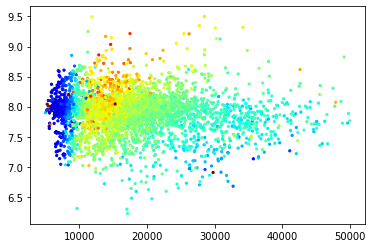

In [4]:
plt.scatter(wdtable['Teff'],wdtable['log_g'], s = 5, c = wdtable['fwhm_b'], vmax = 100, cmap = 'jet')

In [5]:
interpfluxs = [];
lamgrid = np.arange(4000,7000)
for i in tqdm(range(len(wdtable))):
    spec = get_spectrum(wdtable['source_id'][i])
    lam  = spec[0]
    flux = spec[1]
    trans = ((wdtable['center_b'][i] - hbeta)+(wdtable['center_a'][i]-halpha))/2
    shiftedflux = interpolation.shift(flux,-trans,cval=np.nan)
    func = interp1d(lam,flux,kind='linear',assume_sorted = False,fill_value='extrapolate')
    interpflux = func(lamgrid)
    interpfluxs.append(interpflux)

  1%|          | 31/4099 [00:05<11:05,  6.11it/s]

Spectrum file missing...


TypeError: 'NoneType' object is not subscriptable

In [ ]:
spectra = np.asarray(interpfluxs)

lamgrid = np.arange(4000,7000)
lam = lamgrid
lamgrid = lam
lines = ((lam > hbeta-150) & (lam < hbeta + 150)) | ((lam > halpha-100) & (lam < halpha + 100))\
        | ((lam > hgamma-90) & (lam < hgamma + 120))| ((lam > hdelta-70) & (lam < hdelta + 70))

mask = ~lines
def quadratic(array,c1,c2,c3,c4):
    return c1 + c2*array + c3*array**2 + c4*array**3

In [ ]:
normspec = [];

for i in tqdm(range(len(spectra))):
    p,cov = curve_fit(quadratic,lamgrid[mask],spectra[i][mask],p0=[-25,1e-2,1e-5,1e-10])
    contcorr = (spectra[i]/quadratic(lam,p[0],p[1],p[2],p[3]))
    skylinemask = (lamgrid > 5578.5 - 10)*(lamgrid < 5578.5 + 10) + (lamgrid > 5894.6 - 10)*(lamgrid < 5894.6 + 10)\
        + (lamgrid > 6301.7 - 10)*(lamgrid < 6301.7 + 10) + (lamgrid > 7246.0 - 10)*(lamgrid < 7246.0 + 10)
    contcorr[skylinemask] = 1
    where = np.isnan(contcorr)
    contcorr[where] = 1
    normspec.append(contcorr)
normspec = np.asarray(normspec)
len(normspec)

In [8]:
where = (normspec > 1.25) + (normspec < 0)
normspec[where] = 1

In [7]:
normspec = pickle.load(open('DAnormspec.p','rb'))

In [9]:
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize,scale,MinMaxScaler,StandardScaler
import multiprocessing

Using TensorFlow backend.


In [10]:
teffs = np.asarray(wdtable['Teff'])
loggs = np.asarray(wdtable['log_g'])

In [11]:
sc = MinMaxScaler()
msc = MinMaxScaler()
X = sc.fit_transform(np.stack((teffs,loggs)).transpose())
t = msc.fit_transform(normspec)
X_train,X_test,y_train,y_test = train_test_split(X,t,test_size=0.1,random_state=13)

In [13]:
def generator():
    x = Input(shape=(2,))
    y = Dense(256,activation='relu')(x)
    y = Dropout(0.5)(y)
    y = Dense(256,activation='relu')(y)
    y = Dropout(0.5)(y)
    out = Dense(3000,activation='linear')(y)
    
    model = Model(inputs = x, outputs = out)
    model.compile(optimizer = Adam(lr=0.0001), loss = 'mse', \
                  metrics = ['mean_absolute_percentage_error'])
    return model
model = generator()
print(model.summary())
model.load_weights('ddriven_fitting_256.h5')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 2)                 0         
_________________________________________________________________
dense_4 (Dense)              (None, 256)               768       
_________________________________________________________________
dropout_3 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 3000)              771000    
Total params: 837,560
Trainable params: 837,560
Non-trainable params: 0
_________________________________________________________________
None

In [129]:
history = [];
for i in range(1):
    print('Training meta-batch %i'%i)
    epoch = 2500
    batch = len(X_train)
    for i in tqdm(range(epoch)):
        h = model.fit(X_train,y_train,epochs=1,verbose=0,batch_size=batch)
        history.append(h.history['loss'][0])
    model.save_weights('ddriven_fitting_256.h5')

  0%|          | 0/2500 [00:00<?, ?it/s]

Training meta-batch 0


100%|██████████| 2500/2500 [13:24<00:00,  2.99it/s]


Text(0.5, 1.0, '-0.03 percent improvement')

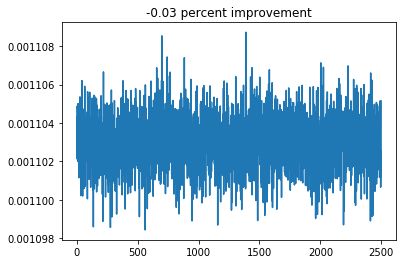

In [130]:
plt.plot(history)
plt.title('%.2f percent improvement' % -(((history[-1]-history[0])/history[0])*100))

Text(0.5, 1.0, 'H-Beta Line')

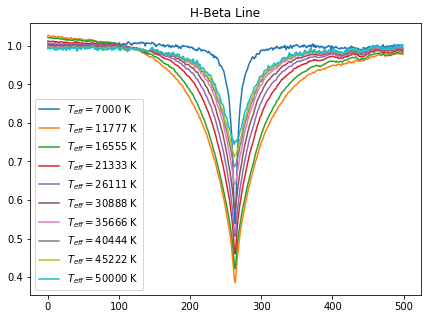

In [131]:
plt.figure(figsize=(7,5))
ts = np.linspace(7000,50000,10)
ls = np.linspace(8,8,10)
samples = sc.transform(np.stack((ts,ls)).transpose())
gens = msc.inverse_transform(model.predict(samples))
tscores = (ts - np.min(ts))/(np.max(ts) - np.min(ts))
for i in range(len(gens)):
    plt.plot(gens[i][600:1100],label='$T_{eff} = %i$ K'%ts[i])
plt.legend(fontsize=10)
plt.title('H-Beta Line')

Text(0.5, 1.0, 'H-Beta Line')

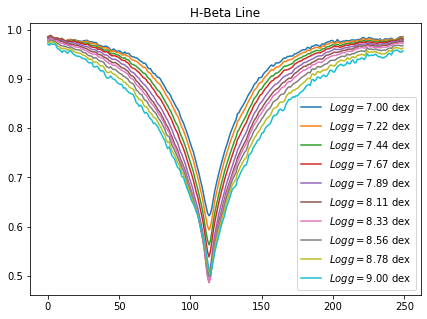

In [17]:
plt.figure(figsize=(7,5))
ts = np.linspace(25000,25000,10)
ls = np.linspace(7,9,10)
samples = sc.transform(np.stack((ts,ls)).transpose())
gens = msc.inverse_transform(model.predict(samples))
tscores = (ts - np.min(ts))/(np.max(ts) - np.min(ts))
for i in range(len(gens)):
    plt.plot(gens[i][750:1000],label='$Logg = %.2f$ dex'%ls[i])
plt.legend(fontsize=10)
plt.title('H-Beta Line')

In [18]:
preds = model.predict(X_test)

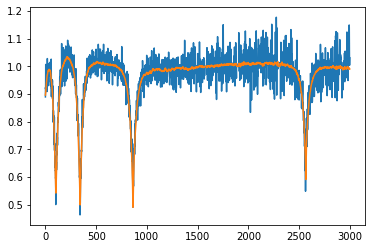

In [19]:
i = 53
plt.plot(msc.inverse_transform(y_test)[i])
plt.plot(msc.inverse_transform(preds)[i])

In [105]:
modelscaling = 1
from astropy.convolution import Gaussian1DKernel
from scipy.signal import convolve as scipy_convolve
def spectrum_sampler(wl,teff,logg,trans):
    label = sc.transform(np.asarray(np.stack((teff,logg)).reshape(1,-1)))
    synth = (interpolation.shift(model.predict(label)[0],trans,cval=1.)*modelscaling)
    newsynth = scipy_convolve(synth,Gaussian1DKernel(5),'same')
    return synth[lines].astype('float64')

def chisquare(residual):
    return sum(residual**2)

In [21]:
lamgrid = np.arange(4000,7000)
fitter = lmfit.Model(spectrum_sampler)
params = fitter.make_params(teff = 20000.,logg=8.,trans=0.)


params['teff'].set(min=5000,max=80000,brute_step=2500);
params['logg'].set(min=6.5,max=9.5,brute_step=0.5);
params['trans'].set(min=-10,max=10,vary=True,brute_step=1)

bayesparams = fitter.make_params(teff = 20000.,logg=8.,trans=0.)
bayesparams['teff'].set(min=5000,max=80000)
bayesparams['logg'].set(min=6.5,max=9.5)
bayesparams['trans'].set(min=-3,max=3,vary=True,brute_step=1)

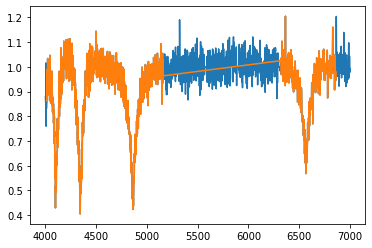

In [110]:
lines = ((lam > hbeta-200) & (lam < hbeta + 300)) | ((lam > halpha-250) & (lam < halpha + 300))\
        | ((lam > hgamma-120) & (lam < hgamma + 400))| ((lam > hdelta-90) & (lam < hdelta + 150))

plt.plot(lamgrid,normspec[34])
plt.plot(lamgrid[lines],normspec[34][lines])

In [194]:
def lnlike(prms):
    model = spectrum_sampler(None,prms[0],prms[1],prms[2])
    diff = model - spec
    chisq = np.sum(diff**2)
    lnlike = -0.5 * chisq
    return lnlike

def lnprior(prms):
    if prms[0] < params['teff'].min or prms[0] > params['teff'].max:
        return -np.Inf
    elif prms[1] < params['logg'].min or prms[1] > params['logg'].max:
        return -np.Inf
    elif prms[2] < params['trans'].min or prms[2] > params['trans'].max:
        return -np.Inf
    return 0.0

def lnprob(prms):
    lp = lnprior(prms)
    if not np.isfinite(lp):
        return -np.Inf
    return lp + lnlike(prms)


ndim,nwalkers = 3,100


steps = 250
burn = 50

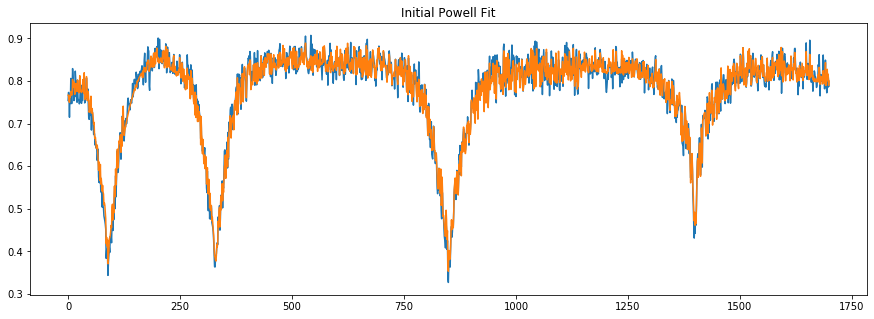

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 88
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.43649691
    reduced chi-square = 2.5707e-04
    Akaike info crit   = -14050.5078
    Bayesian info crit = -14039.6310
[[Variables]]
    teff:   16117.57 (fixed)
    logg:   7.95500016 +/- 0.01167609 (0.15%) (init = 8)
    trans: -0.08712476 +/- 0.01568574 (18.00%) (init = 0)

 Starting Bayesian Sampling...


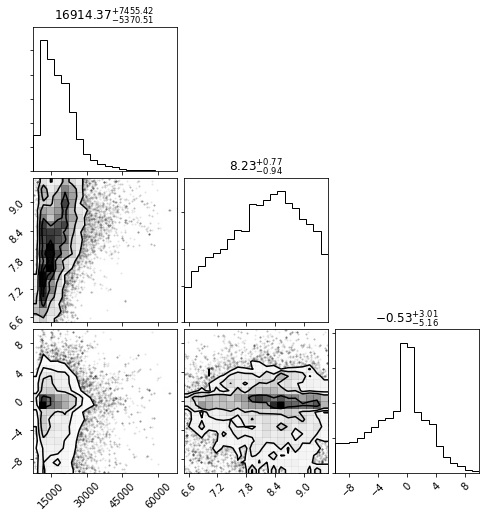

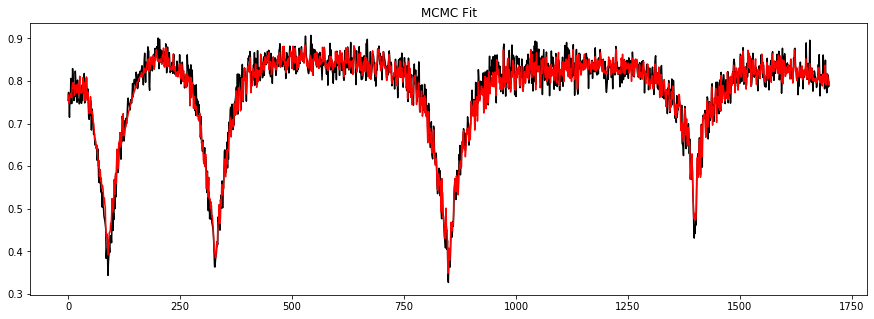

----------------------------------------------------------------------
----------------------------------------------------------------------


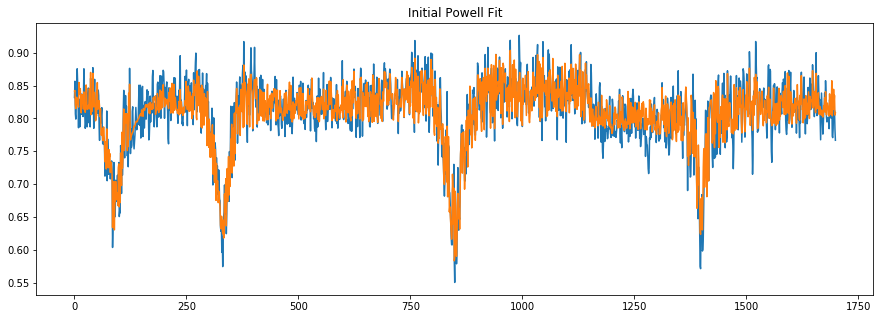

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 92
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.81483533
    reduced chi-square = 4.7988e-04
    Akaike info crit   = -12989.3597
    Bayesian info crit = -12978.4829
[[Variables]]
    teff:   35039.6 (fixed)
    logg:   7.48035559 +/- 0.02815972 (0.38%) (init = 8)
    trans: -0.03950443 +/- 0.02017212 (51.06%) (init = 0)

 Starting Bayesian Sampling...


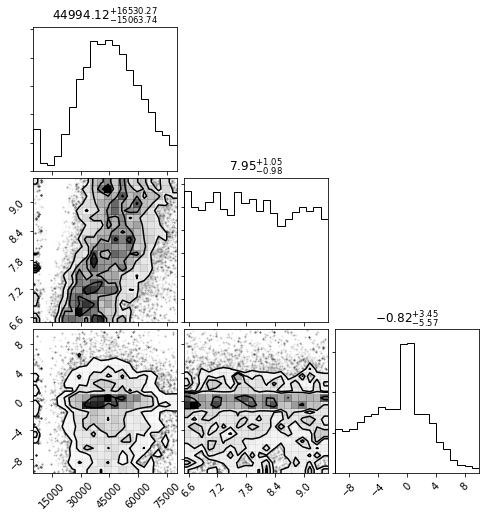

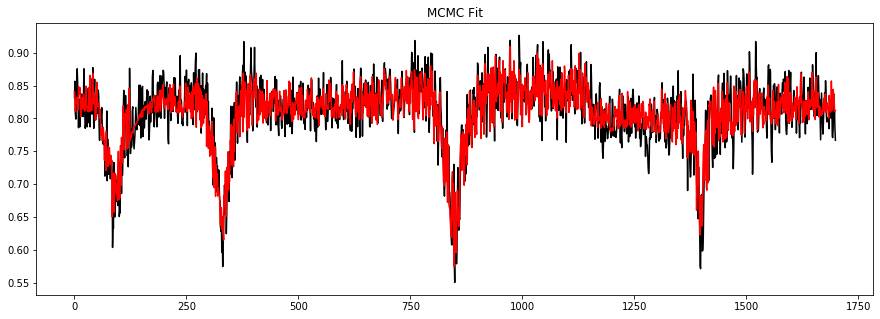

----------------------------------------------------------------------
----------------------------------------------------------------------


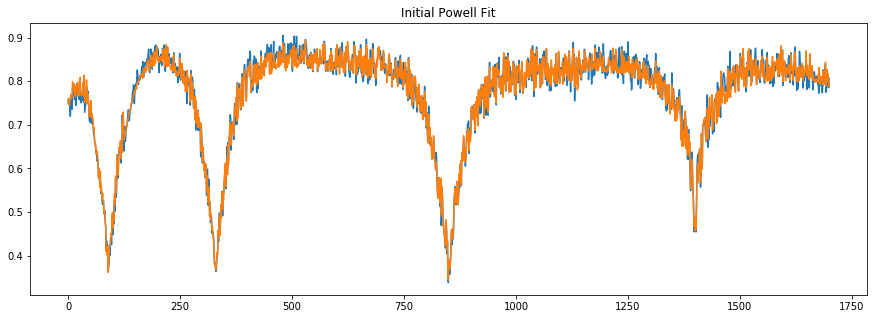

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 67
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.27262043
    reduced chi-square = 1.6055e-04
    Akaike info crit   = -14850.6992
    Bayesian info crit = -14839.8224
[[Variables]]
    teff:   15246.88 (fixed)
    logg:   8.00709790 +/- 0.00978098 (0.12%) (init = 8)
    trans: -0.07862319 +/- 0.01253180 (15.94%) (init = 0)

 Starting Bayesian Sampling...


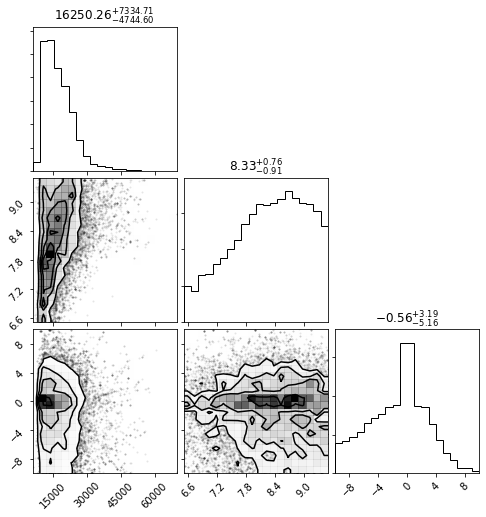

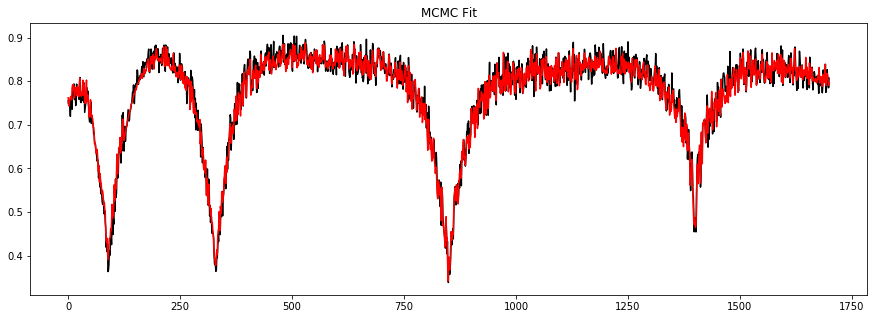

----------------------------------------------------------------------
----------------------------------------------------------------------


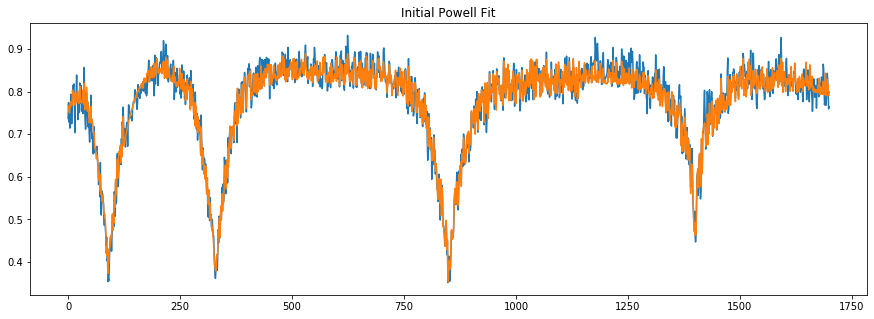

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 84
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.68837351
    reduced chi-square = 4.0540e-04
    Akaike info crit   = -13276.0723
    Bayesian info crit = -13265.1955
[[Variables]]
    teff:   16256.34 (fixed)
    logg:   7.97924322 +/- 0.01391246 (0.17%) (init = 8)
    trans: -0.06826116 +/- 0.01974404 (28.92%) (init = 0)

 Starting Bayesian Sampling...


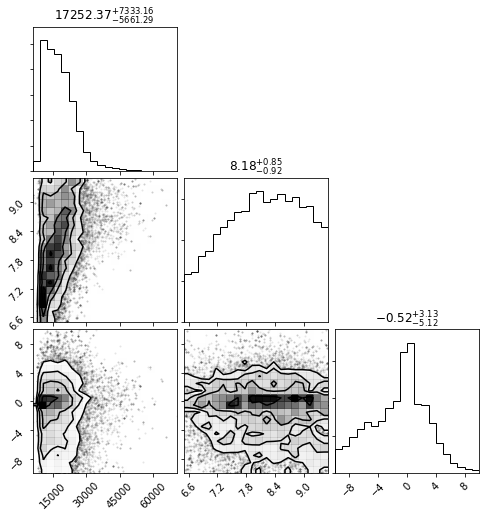

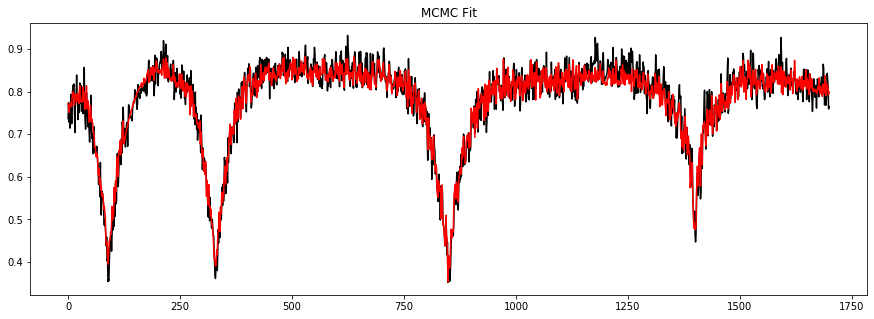

----------------------------------------------------------------------
----------------------------------------------------------------------


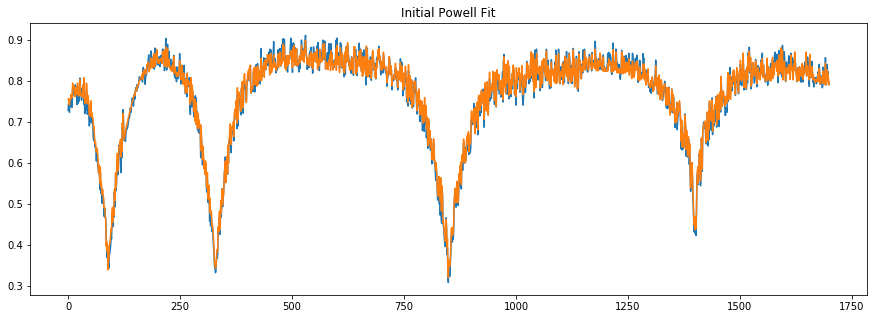

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 86
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.23198270
    reduced chi-square = 1.3662e-04
    Akaike info crit   = -15125.1092
    Bayesian info crit = -15114.2325
[[Variables]]
    teff:   13446.84 (fixed)
    logg:   8.02444504 +/- 0.01262303 (0.16%) (init = 8)
    trans: -0.04566990 +/- 0.01169455 (25.61%) (init = 0)

 Starting Bayesian Sampling...


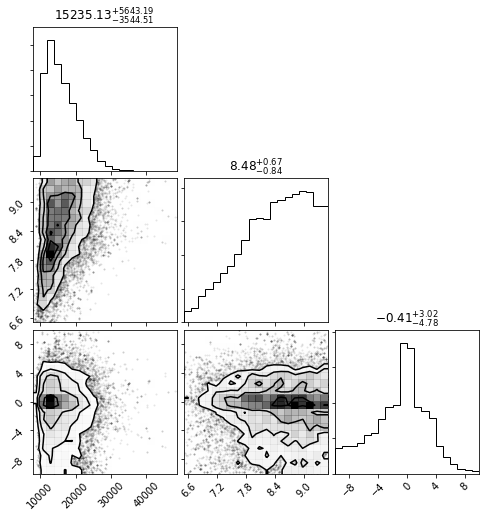

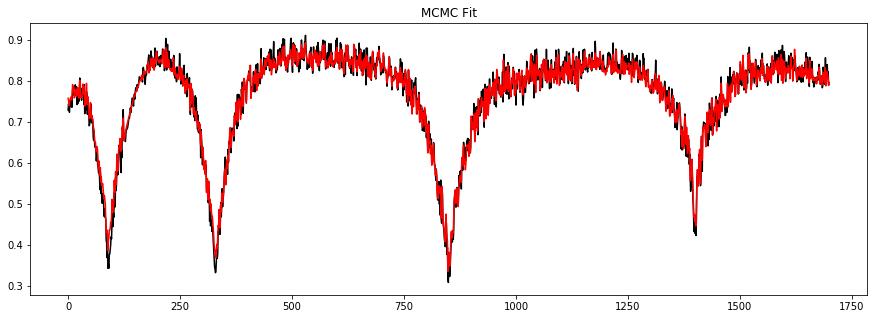

----------------------------------------------------------------------
----------------------------------------------------------------------


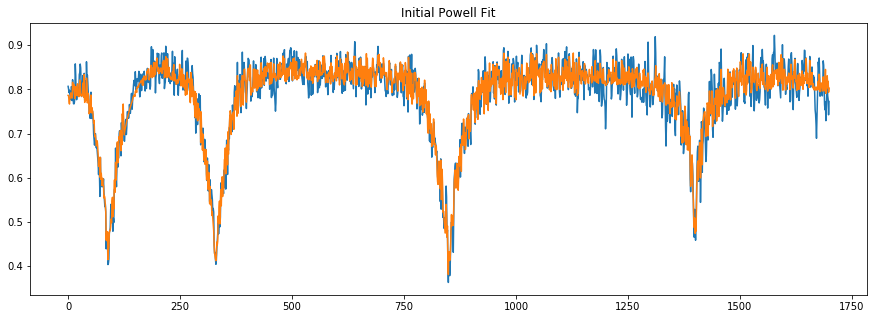

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 82
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.02178302
    reduced chi-square = 6.0176e-04
    Akaike info crit   = -12604.6184
    Bayesian info crit = -12593.7417
[[Variables]]
    teff:   20035.7 (fixed)
    logg:   8.04408177 +/- 0.03418237 (0.42%) (init = 8)
    trans: -0.05280814 +/- 0.02486266 (47.08%) (init = 0)

 Starting Bayesian Sampling...


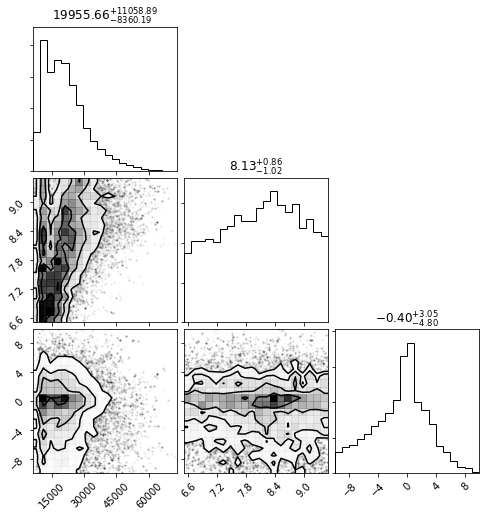

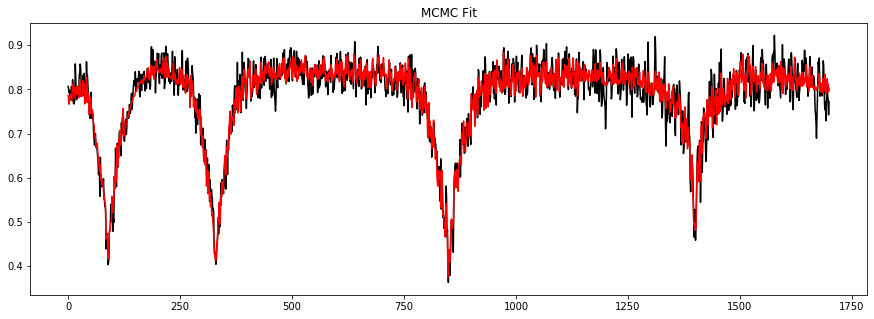

----------------------------------------------------------------------
----------------------------------------------------------------------


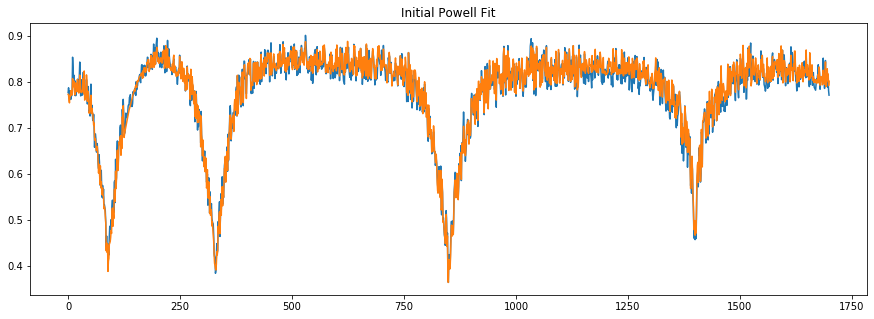

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 76
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.26687660
    reduced chi-square = 1.5717e-04
    Akaike info crit   = -14886.8991
    Bayesian info crit = -14876.0223
[[Variables]]
    teff:   17220.75 (fixed)
    logg:   8.02296112 +/- 0.01024994 (0.13%) (init = 8)
    trans: -0.07802397 +/- 0.01250732 (16.03%) (init = 0)

 Starting Bayesian Sampling...


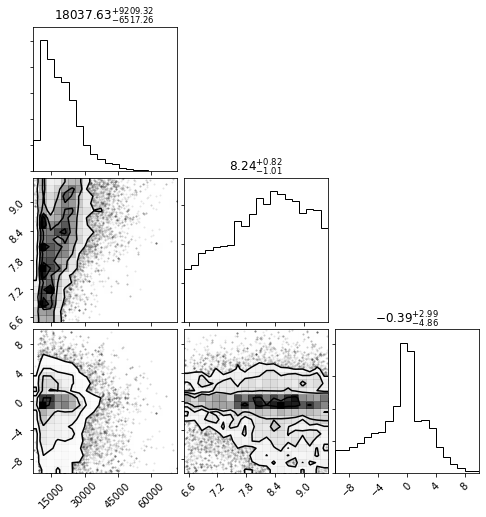

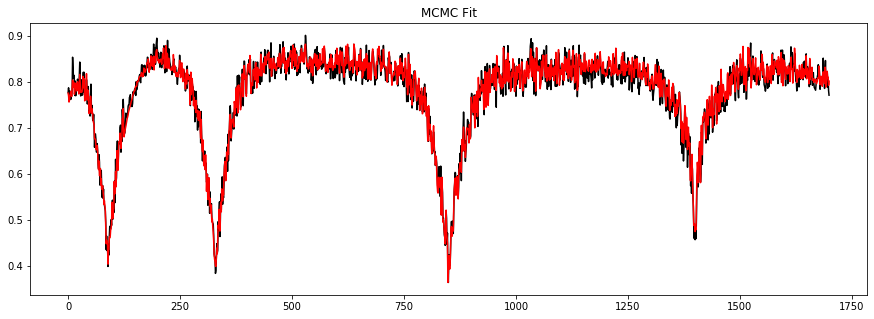

----------------------------------------------------------------------
----------------------------------------------------------------------


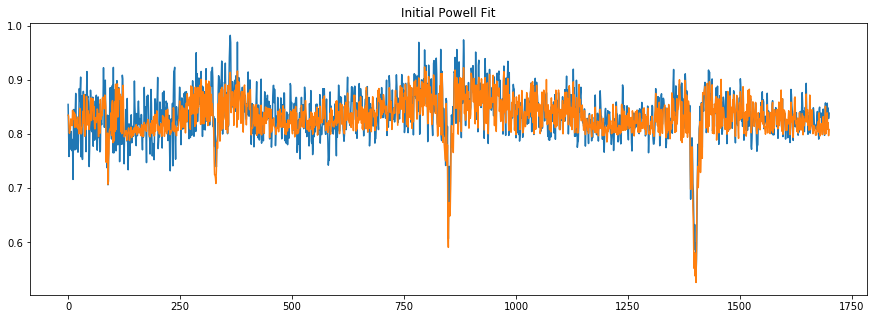

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 81
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.15340338
    reduced chi-square = 6.7927e-04
    Akaike info crit   = -12398.6330
    Bayesian info crit = -12387.7563
[[Variables]]
    teff:   6064.324 (fixed)
    logg:   8.26027707 +/- 0.02222832 (0.27%) (init = 8)
    trans: -0.02756480 +/- 0.02222645 (80.63%) (init = 0)

 Starting Bayesian Sampling...


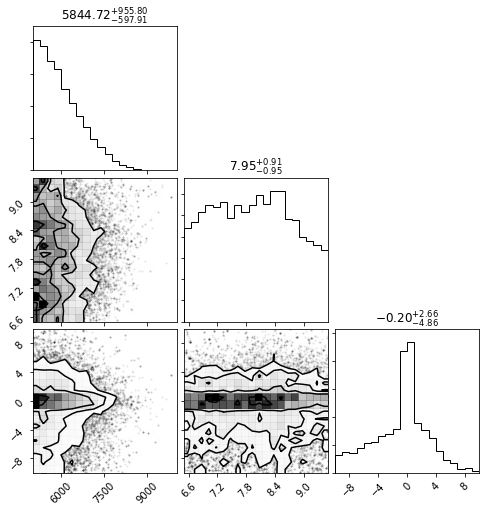

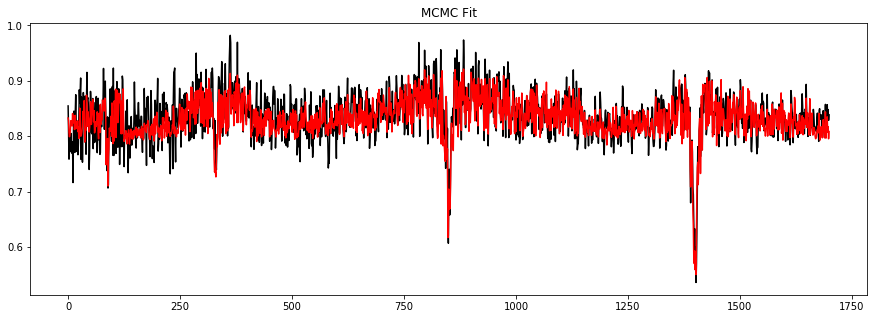

----------------------------------------------------------------------
----------------------------------------------------------------------


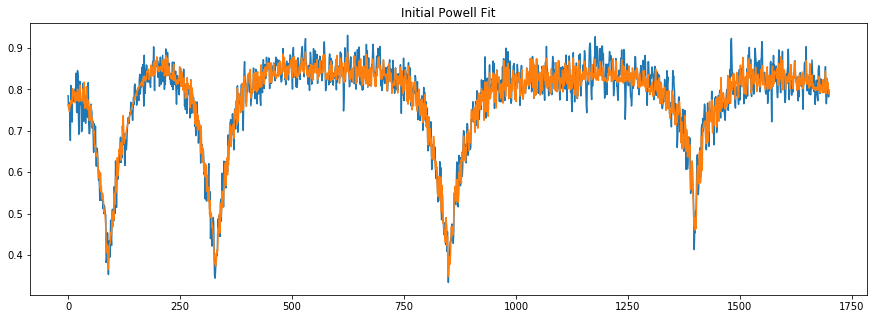

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 70
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.07359047
    reduced chi-square = 6.3227e-04
    Akaike info crit   = -12520.5374
    Bayesian info crit = -12509.6606
[[Variables]]
    teff:   14967.39 (fixed)
    logg:   7.84523015 +/- 0.01279112 (0.16%) (init = 8)
    trans: -0.07064340 +/- 0.02457859 (34.79%) (init = 0)

 Starting Bayesian Sampling...


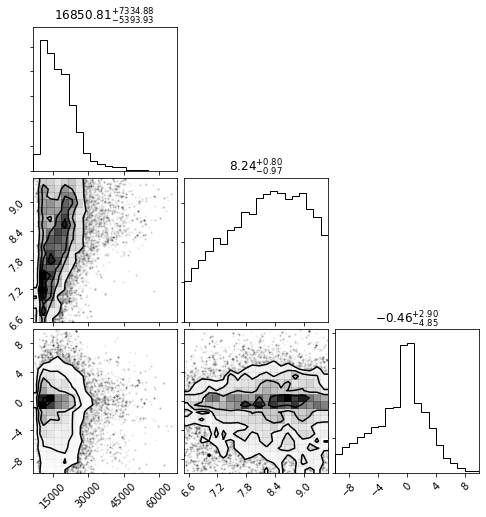

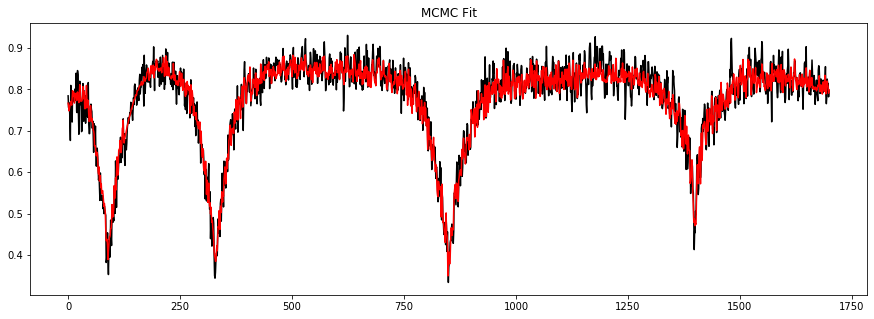

----------------------------------------------------------------------
----------------------------------------------------------------------


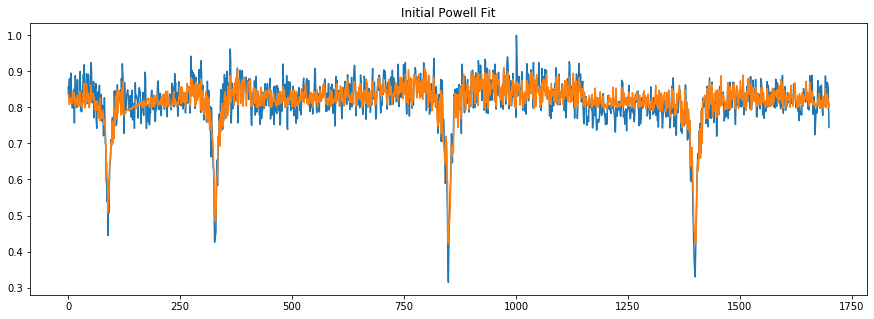

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 79
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.53070486
    reduced chi-square = 9.0148e-04
    Akaike info crit   = -11917.5139
    Bayesian info crit = -11906.6371
[[Variables]]
    teff:   7625.071 (fixed)
    logg:   8.06560534 +/- 0.04423829 (0.55%) (init = 8)
    trans: -0.10896237 +/- 0.02538365 (23.30%) (init = 0)

 Starting Bayesian Sampling...


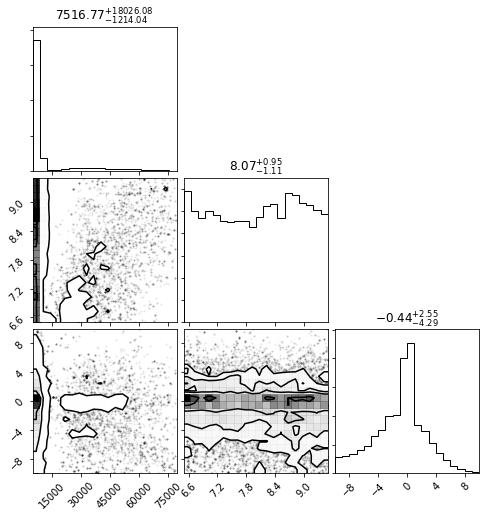

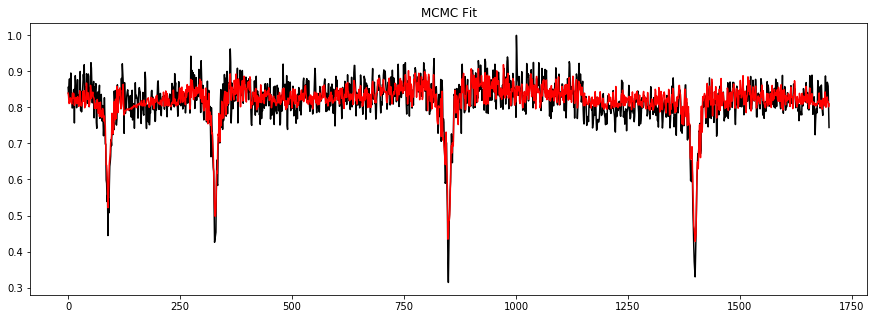

----------------------------------------------------------------------
----------------------------------------------------------------------


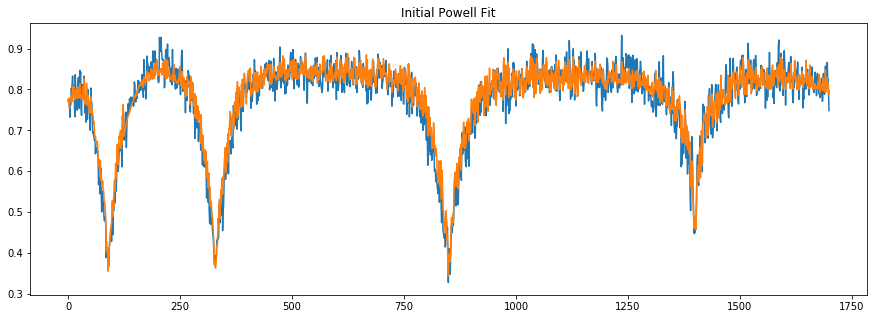

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 100
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.23801923
    reduced chi-square = 7.2910e-04
    Akaike info crit   = -12278.2804
    Bayesian info crit = -12267.4036
[[Variables]]
    teff:   9832.999 (fixed)
    logg:   7.20934373 +/- 0.01296154 (0.18%) (init = 8)
    trans: -0.06060305 +/- 0.02663974 (43.96%) (init = 0)

 Starting Bayesian Sampling...


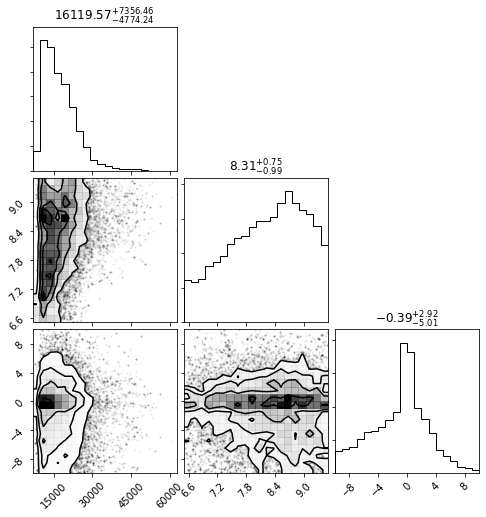

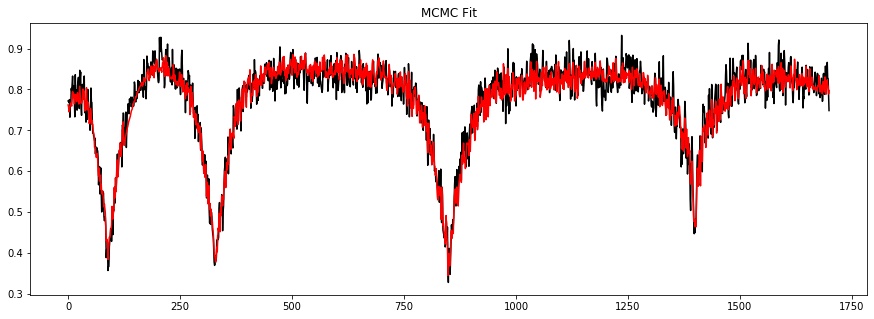

----------------------------------------------------------------------
----------------------------------------------------------------------


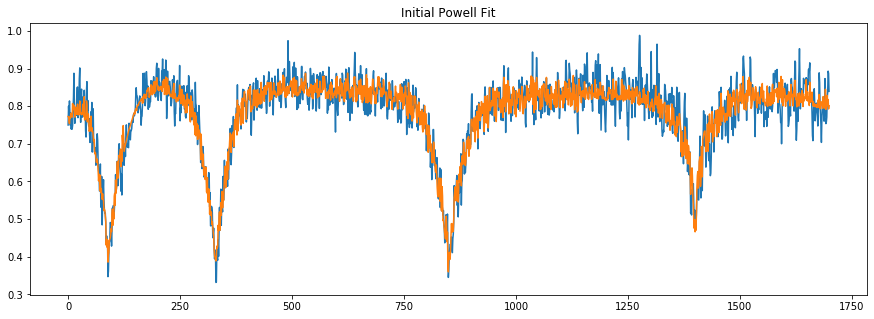

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 72
    # data points      = 1700
    # variables        = 2
    chi-square         = 2.15132641
    reduced chi-square = 0.00126698
    Akaike info crit   = -11338.9082
    Bayesian info crit = -11328.0314
[[Variables]]
    teff:   17041.56 (fixed)
    logg:   7.96307032 +/- 0.02438550 (0.31%) (init = 8)
    trans: -0.00799696 +/- 0.03438629 (429.99%) (init = 0)

 Starting Bayesian Sampling...


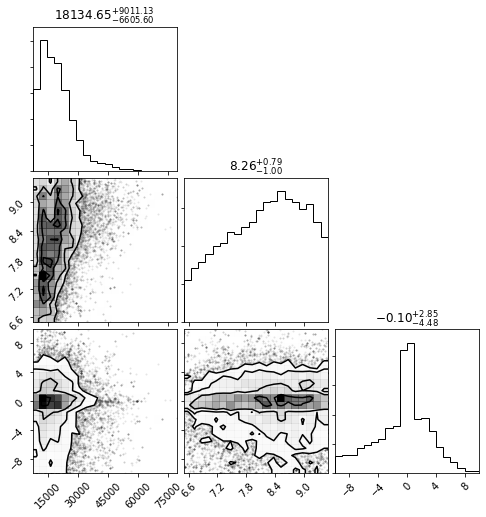

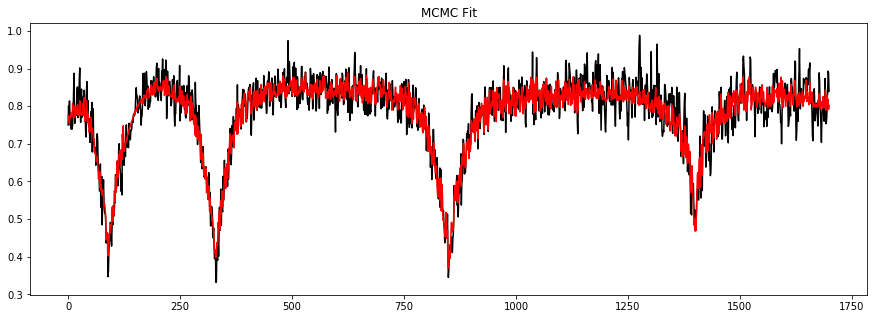

----------------------------------------------------------------------
----------------------------------------------------------------------


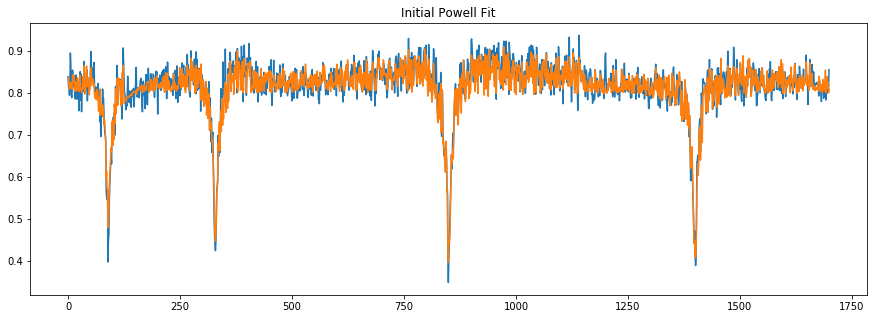

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 78
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.69409121
    reduced chi-square = 4.0877e-04
    Akaike info crit   = -13262.0102
    Bayesian info crit = -13251.1335
[[Variables]]
    teff:   8124.872 (fixed)
    logg:   8.20573241 +/- 0.02524279 (0.31%) (init = 8)
    trans: -0.10119683 +/- 0.01789439 (17.68%) (init = 0)

 Starting Bayesian Sampling...


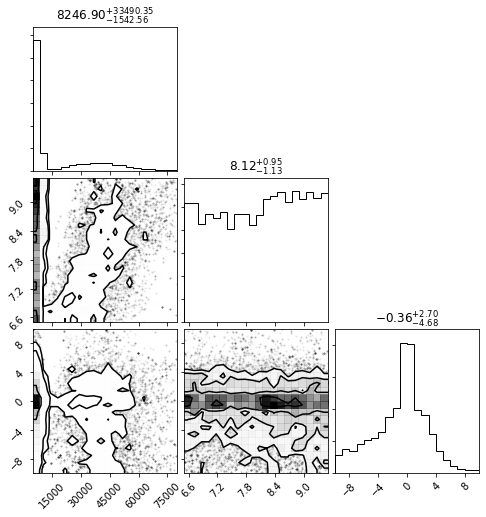

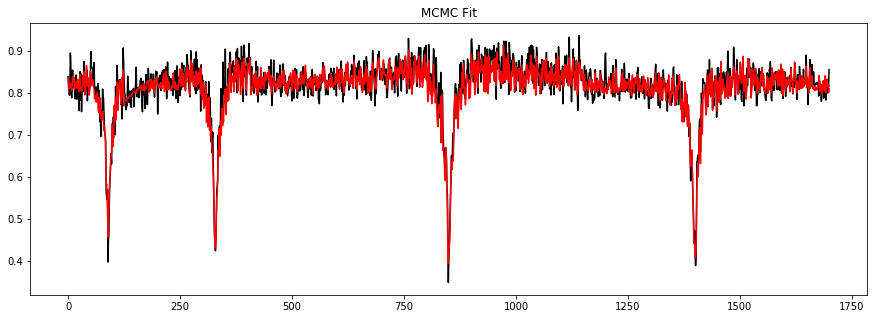

----------------------------------------------------------------------
----------------------------------------------------------------------


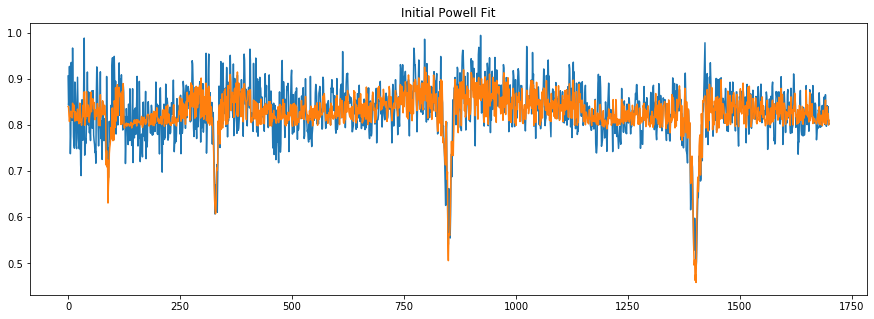

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 77
    # data points      = 1700
    # variables        = 2
    chi-square         = 2.37219361
    reduced chi-square = 0.00139705
    Akaike info crit   = -11172.7663
    Bayesian info crit = -11161.8896
[[Variables]]
    teff:   6696.875 (fixed)
    logg:   8.40808591 +/- 0.12781077 (1.52%) (init = 8)
    trans: -0.08795406 +/- 0.03268949 (37.17%) (init = 0)

 Starting Bayesian Sampling...


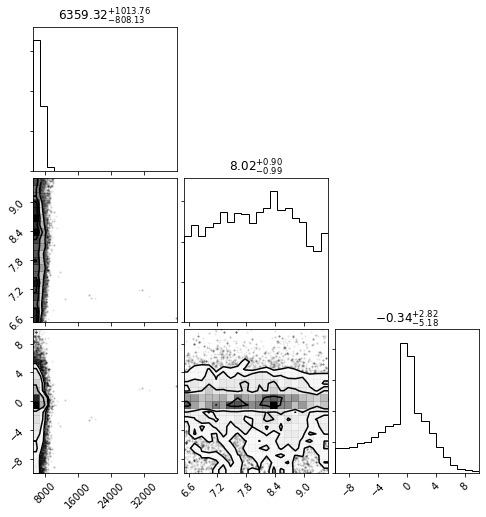

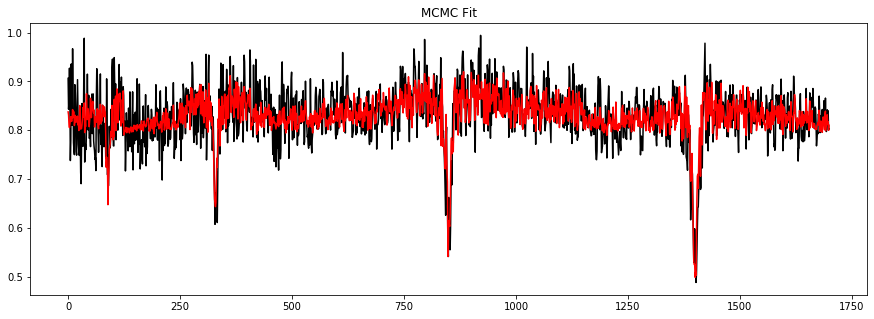

----------------------------------------------------------------------
----------------------------------------------------------------------


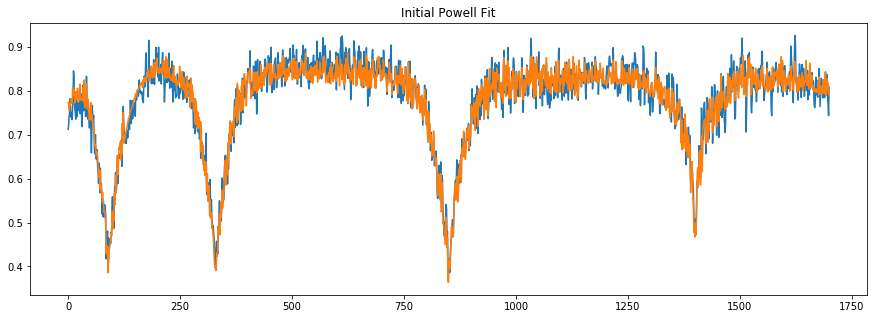

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 82
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.93203430
    reduced chi-square = 5.4890e-04
    Akaike info crit   = -12760.9076
    Bayesian info crit = -12750.0309
[[Variables]]
    teff:   17004.51 (fixed)
    logg:   7.92139967 +/- 0.02036760 (0.26%) (init = 8)
    trans: -0.06860466 +/- 0.02307309 (33.63%) (init = 0)

 Starting Bayesian Sampling...


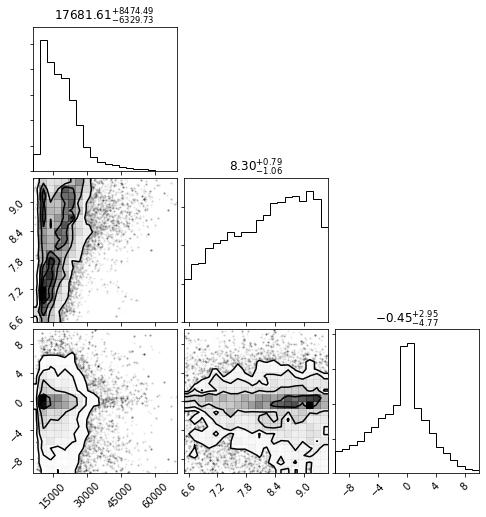

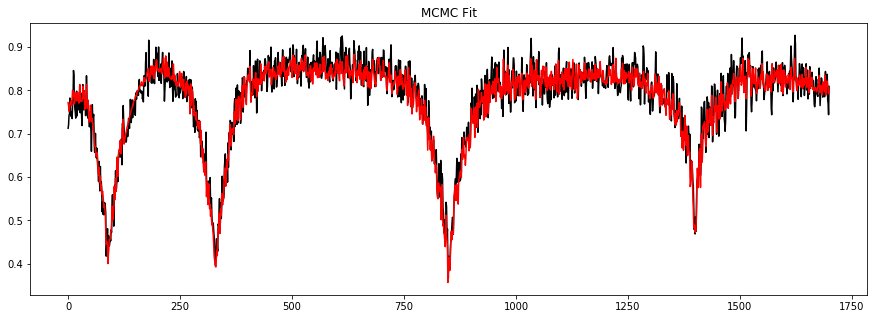

----------------------------------------------------------------------
----------------------------------------------------------------------


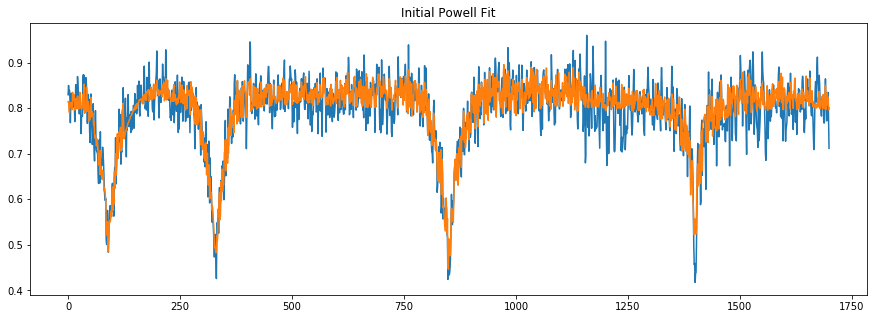

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 94
    # data points      = 1700
    # variables        = 2
    chi-square         = 2.10658677
    reduced chi-square = 0.00124063
    Akaike info crit   = -11374.6347
    Bayesian info crit = -11363.7579
[[Variables]]
    teff:   24789.02 (fixed)
    logg:   7.66474508 +/- 0.03413010 (0.45%) (init = 8)
    trans: -0.03129831 +/- 0.03323980 (106.20%) (init = 0)

 Starting Bayesian Sampling...


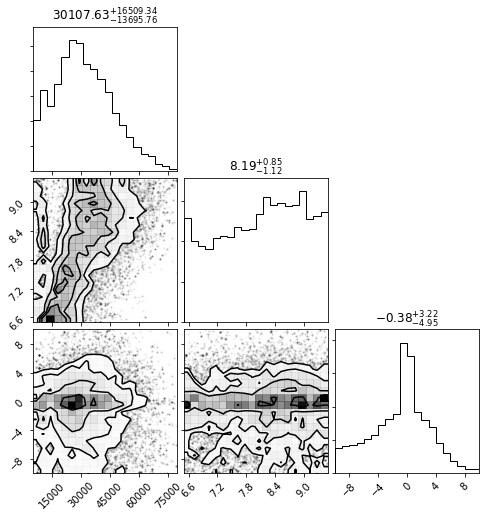

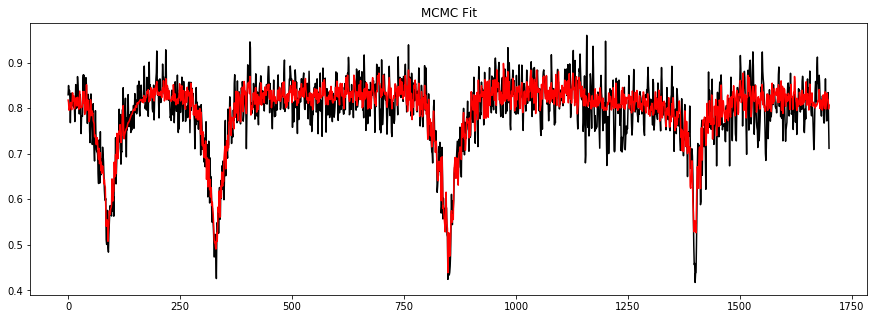

----------------------------------------------------------------------
----------------------------------------------------------------------


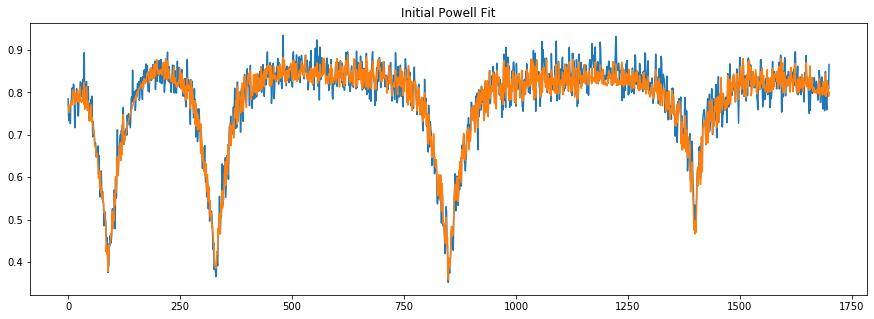

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 105
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.83795230
    reduced chi-square = 4.9349e-04
    Akaike info crit   = -12941.8020
    Bayesian info crit = -12930.9252
[[Variables]]
    teff:   15638.1 (fixed)
    logg:   7.80121610 +/- 0.00999275 (0.13%) (init = 8)
    trans: -0.06214500 +/- 0.02139979 (34.44%) (init = 0)

 Starting Bayesian Sampling...


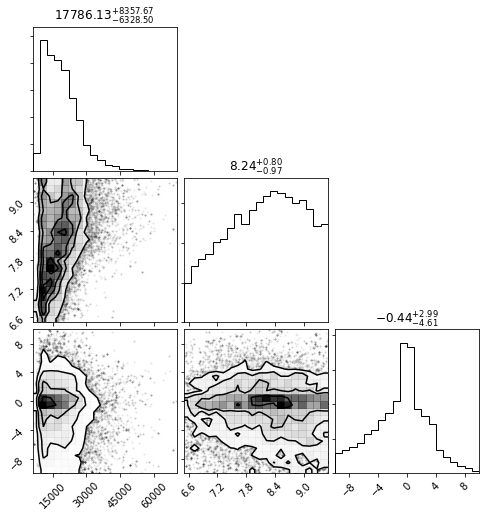

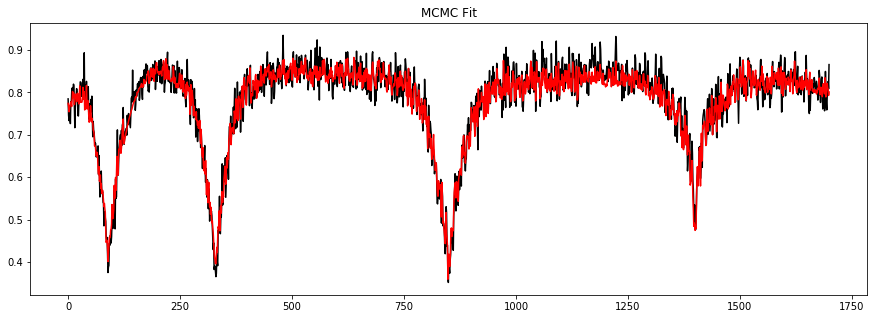

----------------------------------------------------------------------
----------------------------------------------------------------------


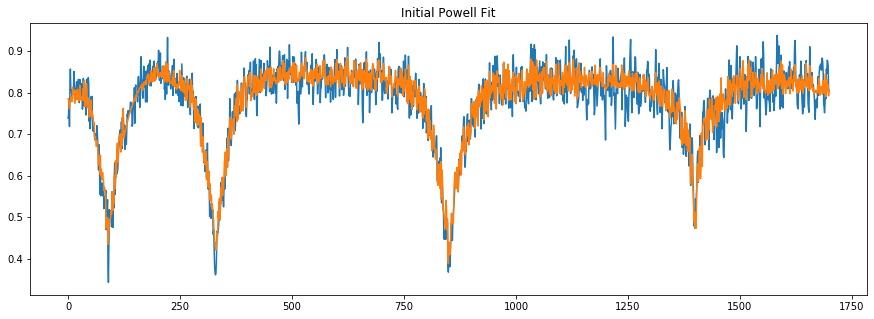

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 63
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.67696634
    reduced chi-square = 9.8761e-04
    Akaike info crit   = -11762.3751
    Bayesian info crit = -11751.4983
[[Variables]]
    teff:   21173.22 (fixed)
    logg:   8.43750094 +/- 0.02919149 (0.35%) (init = 8)
    trans: -0.06986710 +/- 0.03197421 (45.76%) (init = 0)

 Starting Bayesian Sampling...


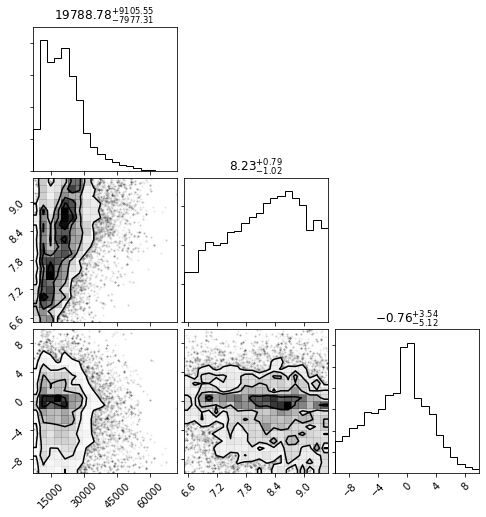

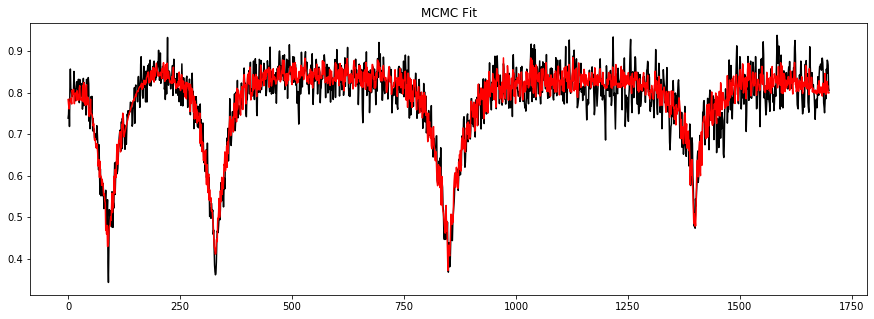

----------------------------------------------------------------------
----------------------------------------------------------------------


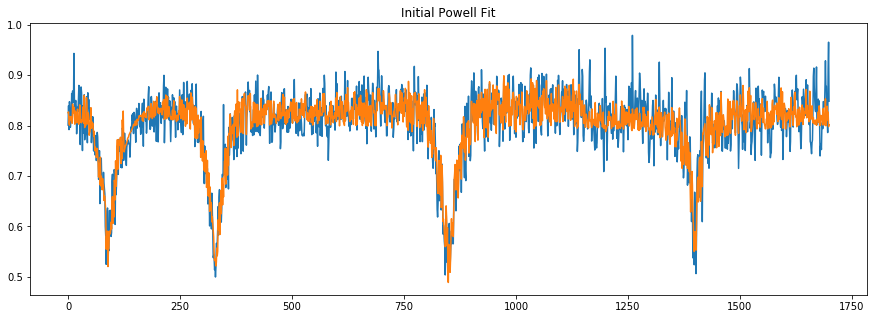

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 131
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.66183237
    reduced chi-square = 9.7870e-04
    Akaike info crit   = -11777.7866
    Bayesian info crit = -11766.9098
[[Variables]]
    teff:   25046.8 (fixed)
    logg:   7.26531492 +/- 0.01755211 (0.24%) (init = 8)
    trans: -0.05468928 +/- 0.02945785 (53.86%) (init = 0)

 Starting Bayesian Sampling...


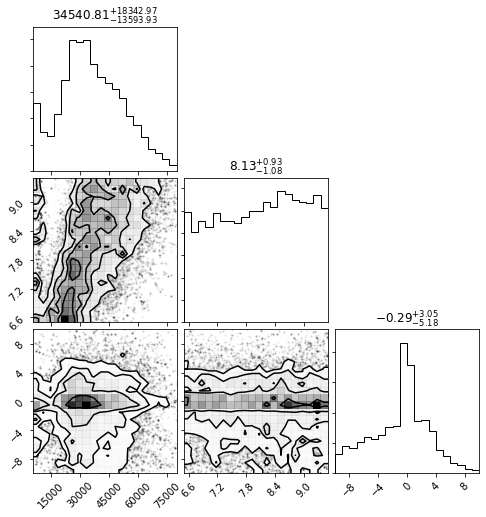

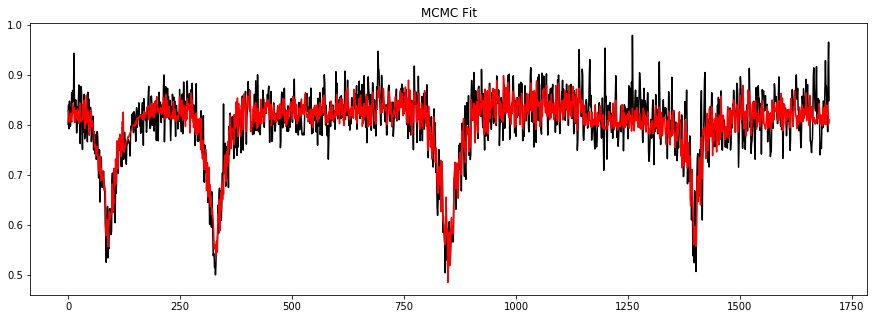

----------------------------------------------------------------------
----------------------------------------------------------------------


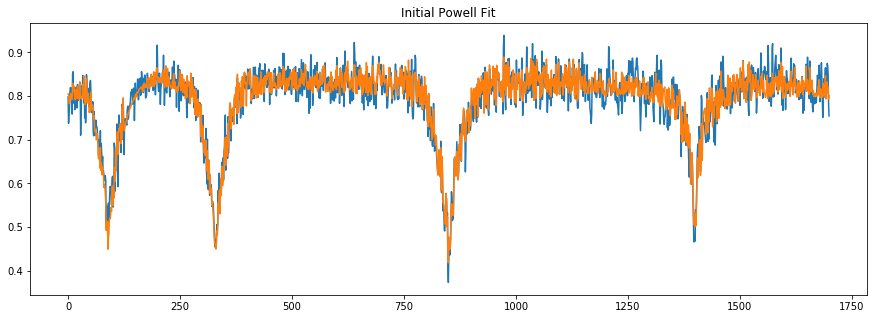

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 89
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.06941785
    reduced chi-square = 6.2981e-04
    Akaike info crit   = -12527.1575
    Bayesian info crit = -12516.2807
[[Variables]]
    teff:   21930.75 (fixed)
    logg:   7.72520408 +/- 0.02198243 (0.28%) (init = 8)
    trans: -0.09650750 +/- 0.02318187 (24.02%) (init = 0)

 Starting Bayesian Sampling...


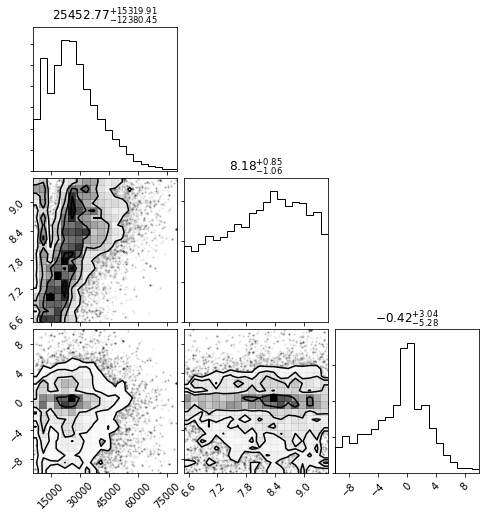

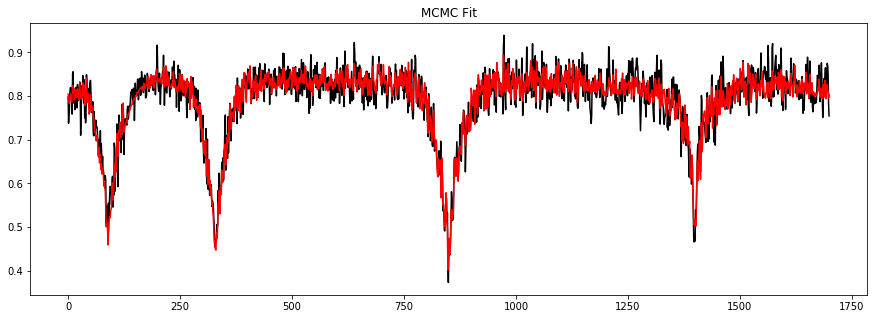

----------------------------------------------------------------------
----------------------------------------------------------------------


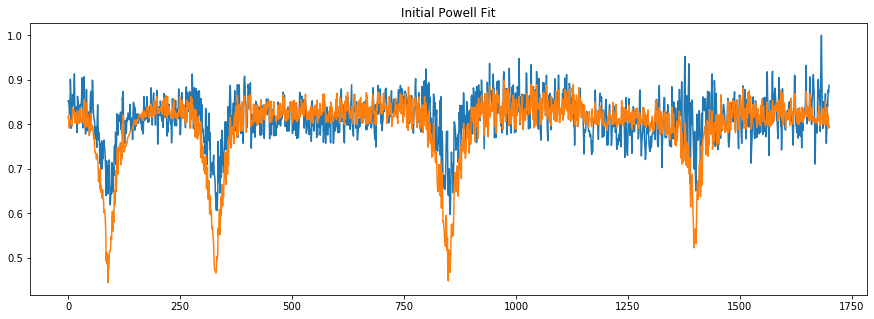

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 117
    # data points      = 1700
    # variables        = 2
    chi-square         = 4.86360647
    reduced chi-square = 0.00286431
    Akaike info crit   = -9952.22560
    Bayesian info crit = -9941.34883
##  Warning: uncertainties could not be estimated:
    teff:   at initial value
    logg:   at boundary
[[Variables]]
    teff:   17142.59 (fixed)
    logg:   6.50000000 +/- 5.1591e-08 (0.00%) (init = 8)
    trans: -0.03866273 +/-        nan (nan%) (init = 0)

 Starting Bayesian Sampling...


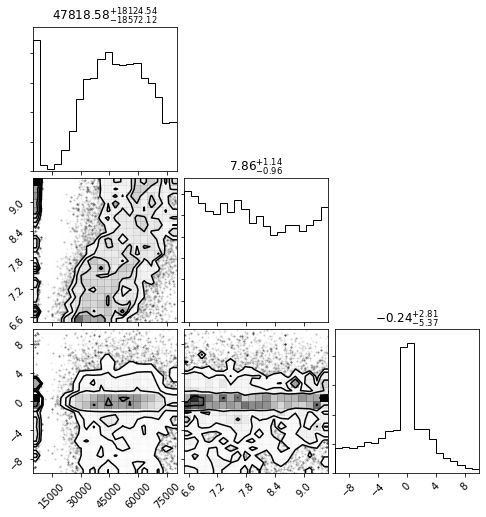

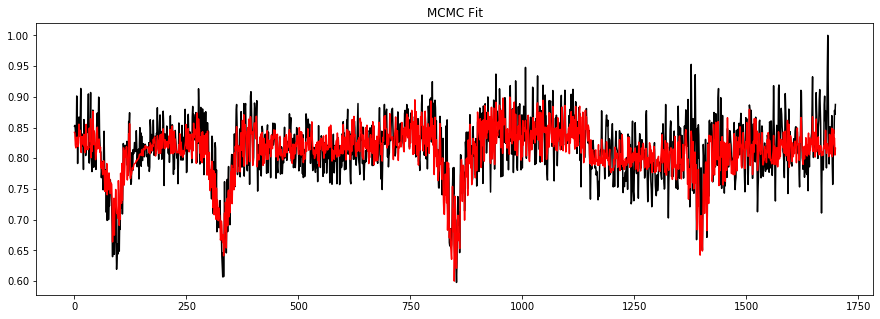

----------------------------------------------------------------------
----------------------------------------------------------------------


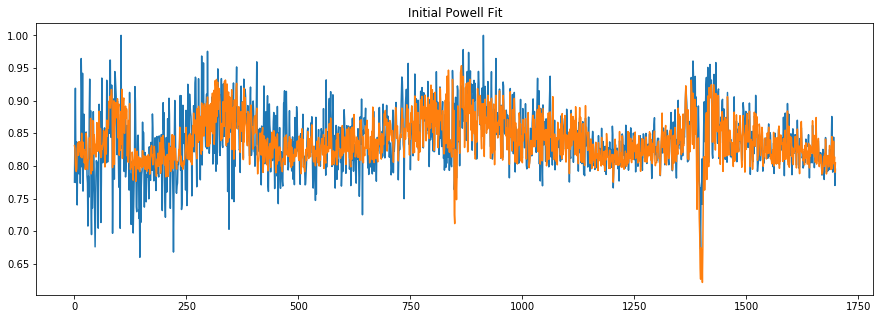

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 73
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.82224802
    reduced chi-square = 0.00107317
    Akaike info crit   = -11621.1314
    Bayesian info crit = -11610.2547
[[Variables]]
    teff:   5013.871 (fixed)
    logg:   7.73622194 +/- 0.04673744 (0.60%) (init = 8)
    trans: -0.04254826 +/- 0.57171554 (1343.69%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(logg, trans) =  0.142

 Starting Bayesian Sampling...


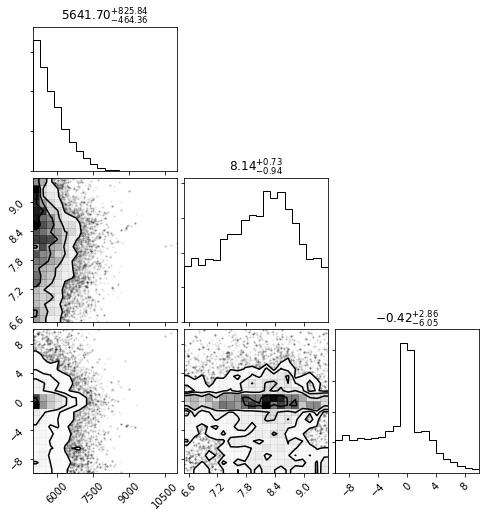

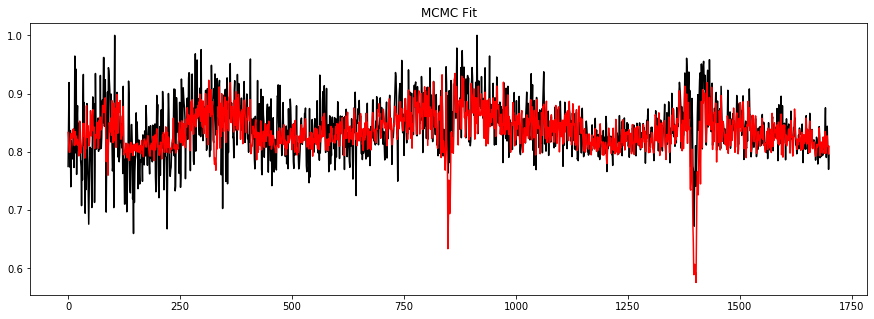

----------------------------------------------------------------------
----------------------------------------------------------------------


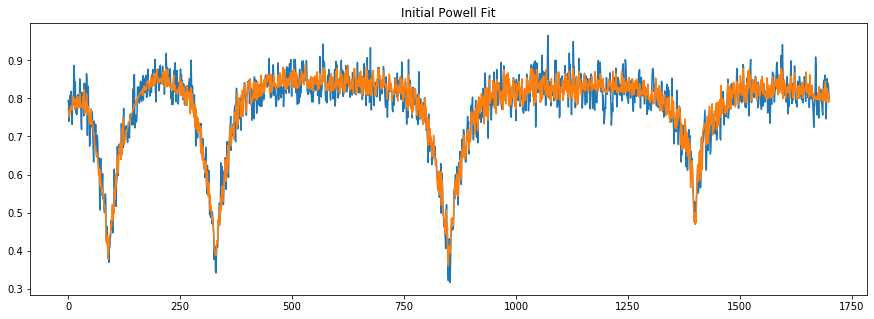

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 97
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.38137698
    reduced chi-square = 8.1353e-04
    Akaike info crit   = -12092.0146
    Bayesian info crit = -12081.1379
[[Variables]]
    teff:   15105.08 (fixed)
    logg:   7.73682613 +/- 0.01950089 (0.25%) (init = 8)
    trans: -0.03397478 +/- 0.02758086 (81.18%) (init = 0)

 Starting Bayesian Sampling...


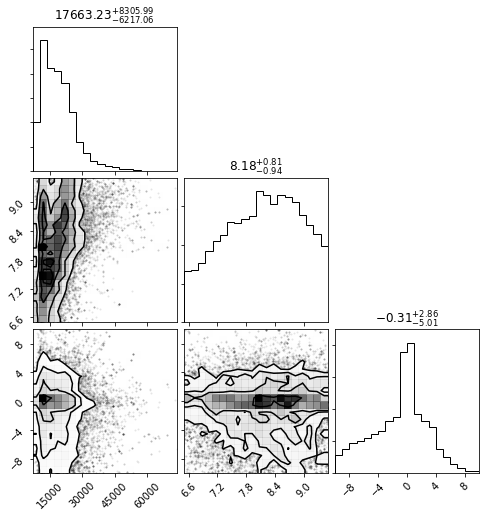

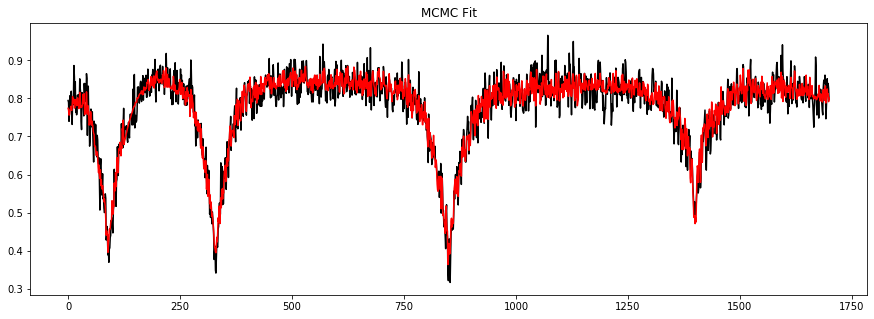

----------------------------------------------------------------------
----------------------------------------------------------------------


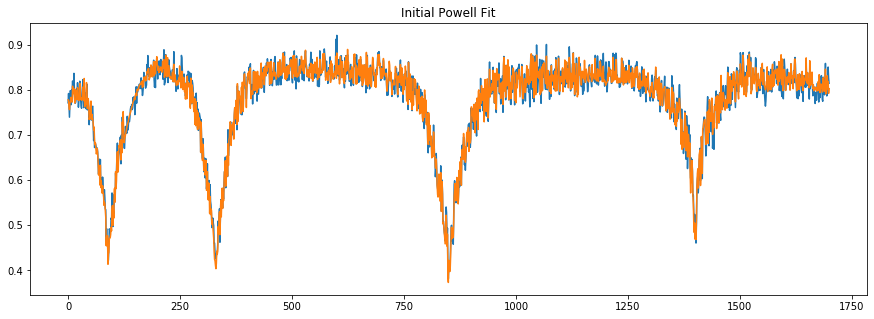

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 68
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.31764261
    reduced chi-square = 1.8707e-04
    Akaike info crit   = -14590.8603
    Bayesian info crit = -14579.9835
[[Variables]]
    teff:   19102.83 (fixed)
    logg:   8.34222885 +/- 0.01235770 (0.15%) (init = 8)
    trans: -0.04770210 +/- 0.01338383 (28.06%) (init = 0)

 Starting Bayesian Sampling...


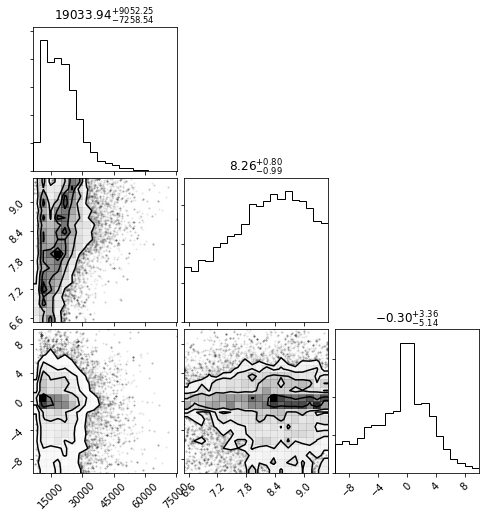

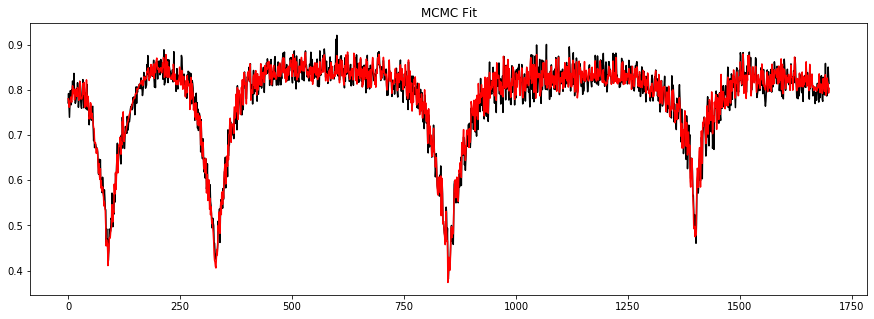

----------------------------------------------------------------------
----------------------------------------------------------------------


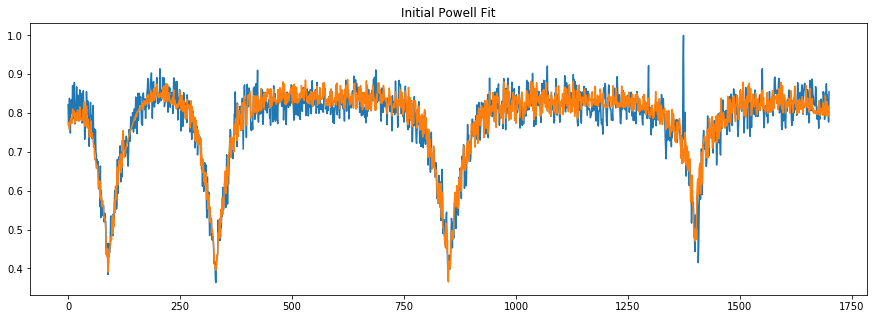

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 96
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.49397488
    reduced chi-square = 8.7984e-04
    Akaike info crit   = -11958.8035
    Bayesian info crit = -11947.9268
[[Variables]]
    teff:   16808.33 (fixed)
    logg:   7.82153052 +/- 0.01535578 (0.20%) (init = 8)
    trans: -0.01062637 +/- 0.02906562 (273.52%) (init = 0)

 Starting Bayesian Sampling...


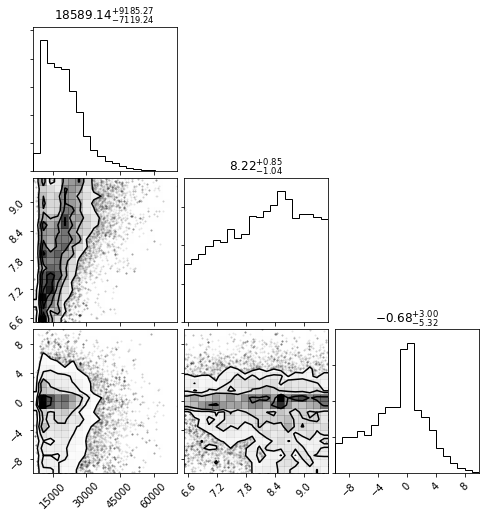

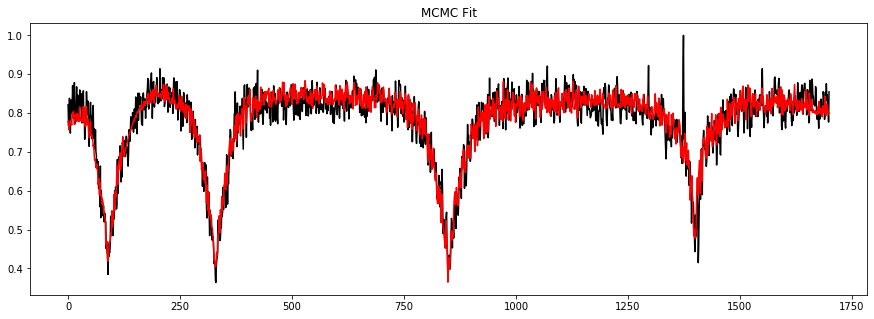

----------------------------------------------------------------------
----------------------------------------------------------------------


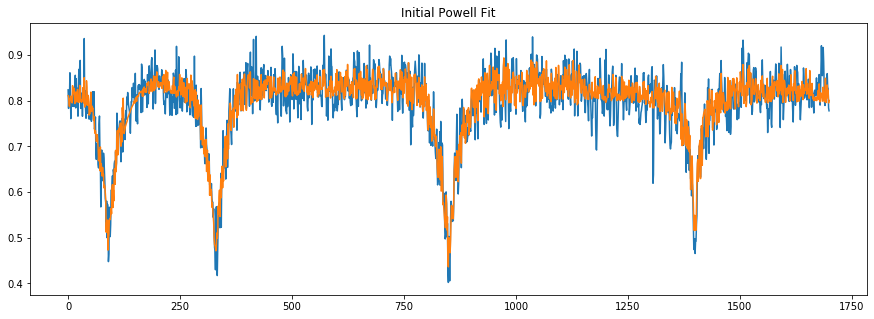

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 88
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.86177488
    reduced chi-square = 0.00109645
    Akaike info crit   = -11584.6505
    Bayesian info crit = -11573.7738
[[Variables]]
    teff:   24295.35 (fixed)
    logg:   7.74475628 +/- 0.03517983 (0.45%) (init = 8)
    trans: -0.04533419 +/- 0.03156791 (69.63%) (init = 0)

 Starting Bayesian Sampling...


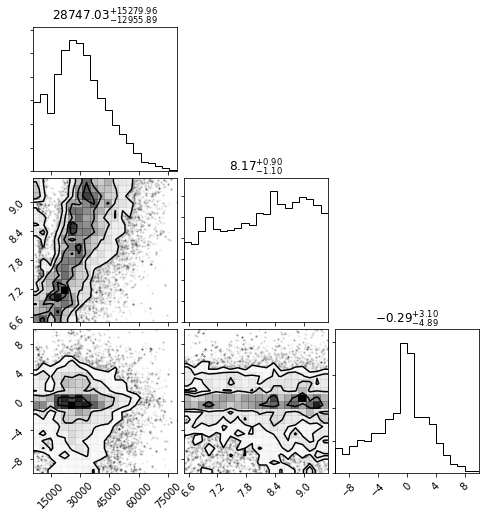

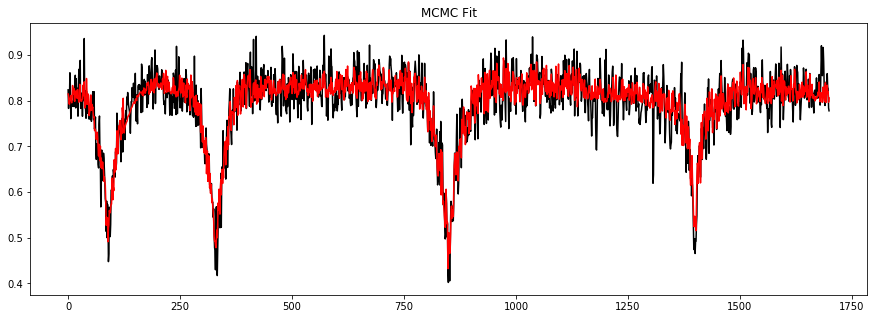

----------------------------------------------------------------------
----------------------------------------------------------------------


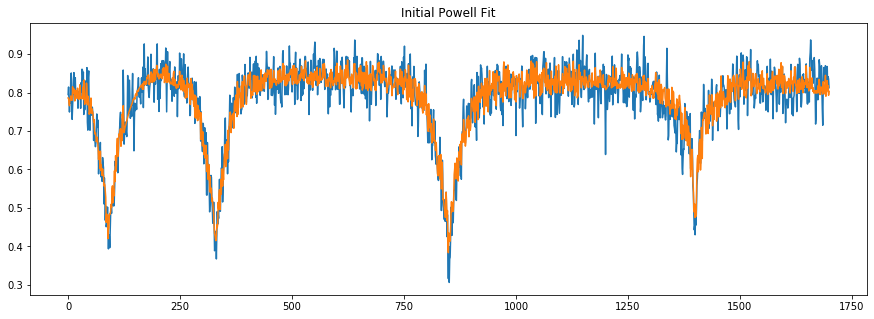

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 75
    # data points      = 1700
    # variables        = 2
    chi-square         = 2.22254871
    reduced chi-square = 0.00130892
    Akaike info crit   = -11283.5392
    Bayesian info crit = -11272.6624
[[Variables]]
    teff:   20526.3 (fixed)
    logg:   8.18848280 +/- 0.06020016 (0.74%) (init = 8)
    trans: -0.05952562 +/- 0.03482980 (58.51%) (init = 0)

 Starting Bayesian Sampling...


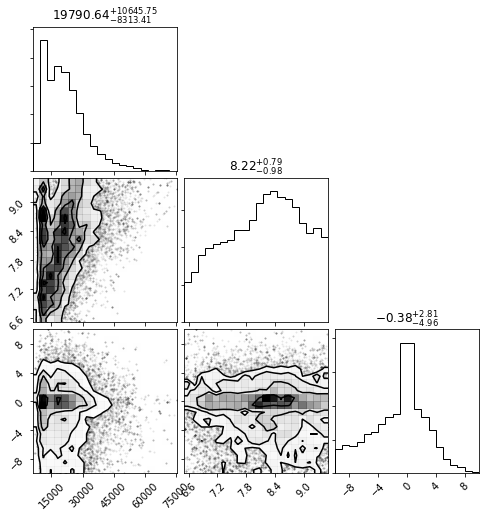

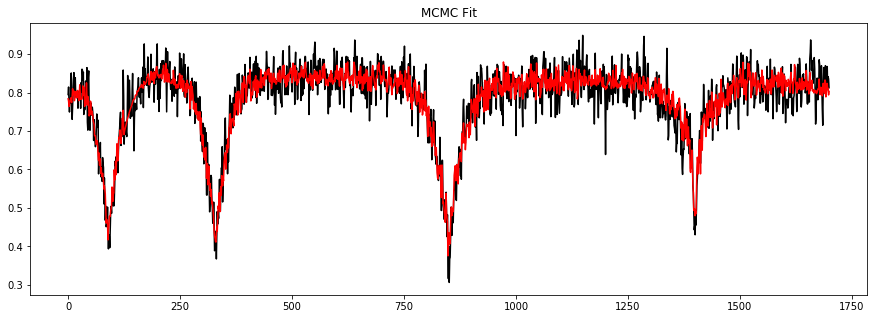

----------------------------------------------------------------------
----------------------------------------------------------------------


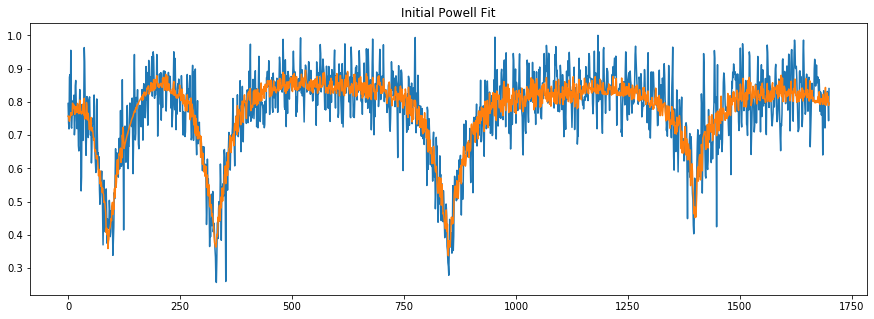

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 97
    # data points      = 1700
    # variables        = 2
    chi-square         = 6.92729327
    reduced chi-square = 0.00407968
    Akaike info crit   = -9350.95444
    Bayesian info crit = -9340.07767
[[Variables]]
    teff:   14856.07 (fixed)
    logg:   8.06717164 +/- 0.05460067 (0.68%) (init = 8)
    trans: -0.05235724 +/- 0.05750788 (109.84%) (init = 0)

 Starting Bayesian Sampling...


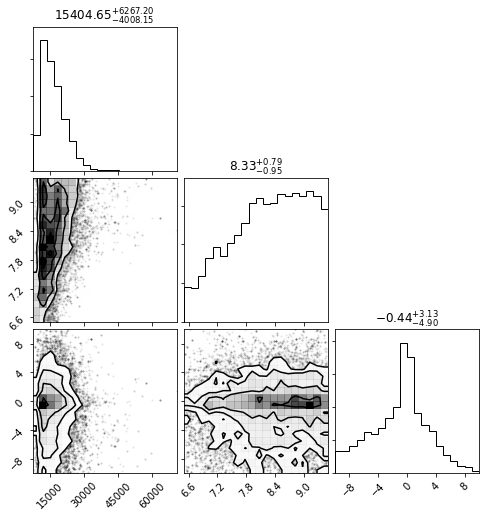

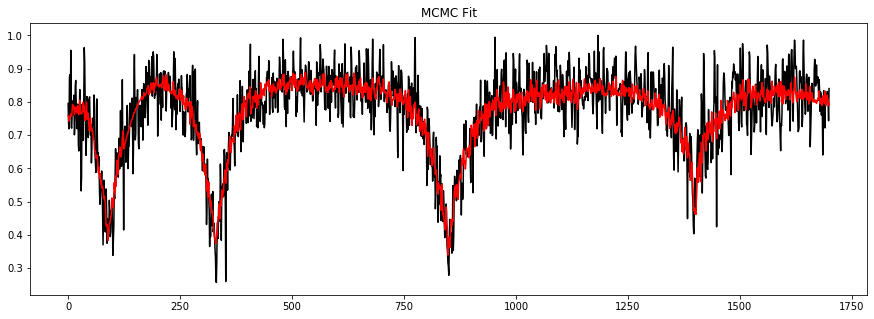

----------------------------------------------------------------------
----------------------------------------------------------------------


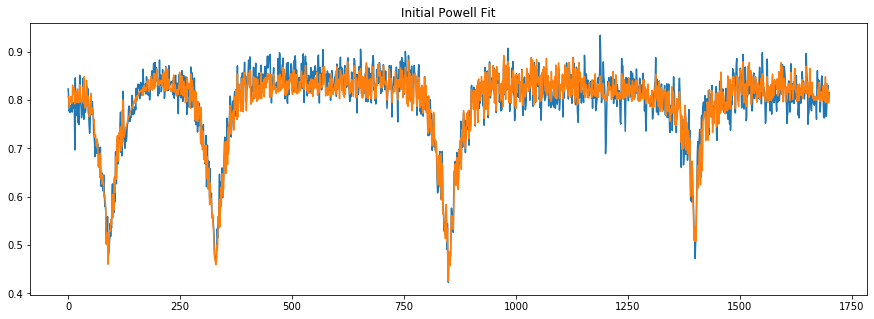

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 102
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.70770154
    reduced chi-square = 4.1679e-04
    Akaike info crit   = -13228.9978
    Bayesian info crit = -13218.1210
[[Variables]]
    teff:   23075.91 (fixed)
    logg:   7.73396648 +/- 0.02066743 (0.27%) (init = 8)
    trans: -0.05305537 +/- 0.01986111 (37.43%) (init = 0)

 Starting Bayesian Sampling...


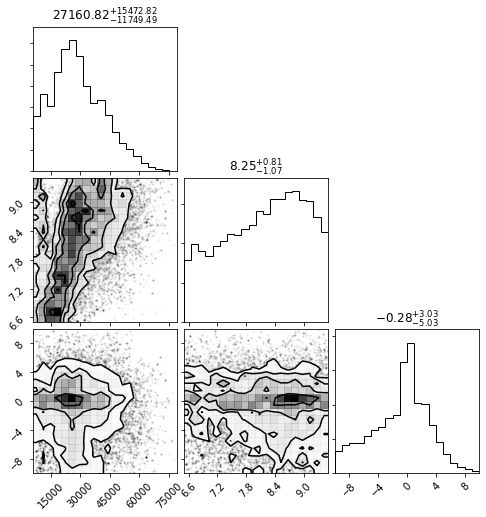

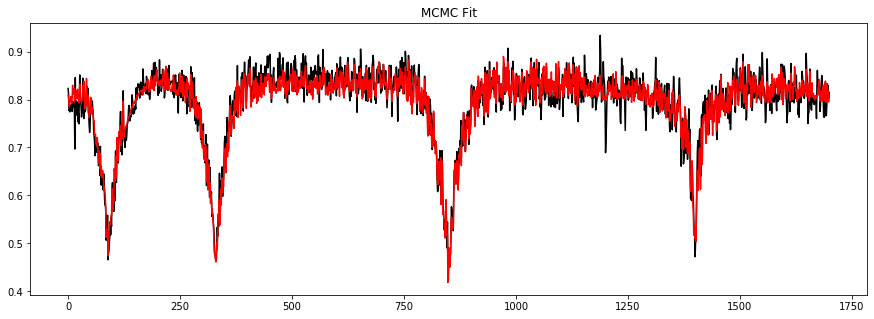

----------------------------------------------------------------------
----------------------------------------------------------------------


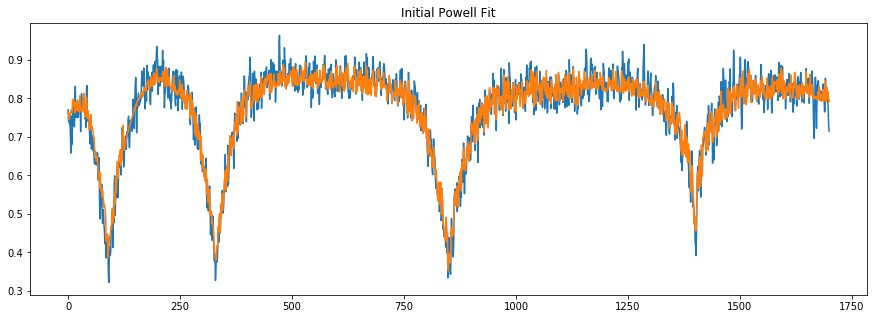

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 111
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.39755753
    reduced chi-square = 8.2306e-04
    Akaike info crit   = -12072.2176
    Bayesian info crit = -12061.3409
[[Variables]]
    teff:   16700.81 (fixed)
    logg:   8.33719846 +/- 0.01969373 (0.24%) (init = 8)
    trans: -0.05563826 +/- 0.02834356 (50.94%) (init = 0)

 Starting Bayesian Sampling...


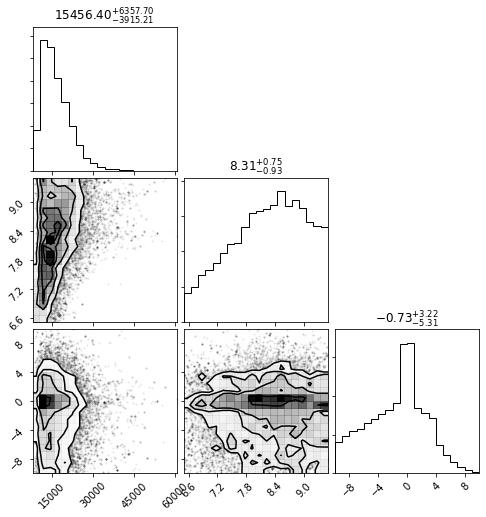

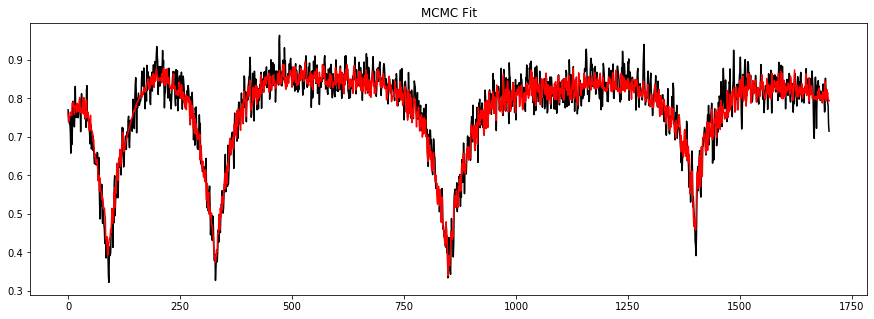

----------------------------------------------------------------------
----------------------------------------------------------------------


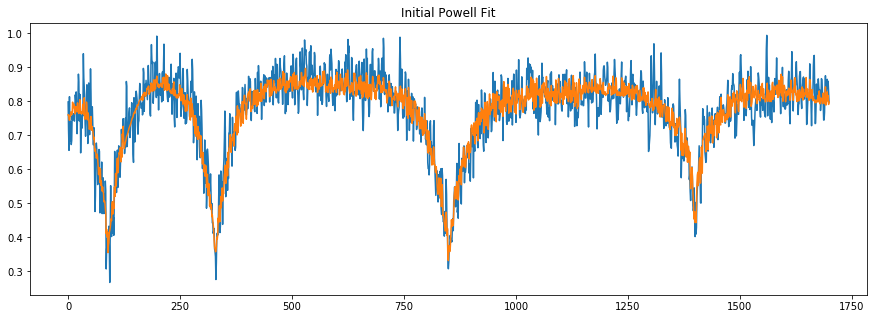

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 71
    # data points      = 1700
    # variables        = 2
    chi-square         = 3.85648238
    reduced chi-square = 0.00227119
    Akaike info crit   = -10346.6677
    Bayesian info crit = -10335.7909
[[Variables]]
    teff:   12406.52 (fixed)
    logg:   8.12845901 +/- 0.01470428 (0.18%) (init = 8)
    trans: -0.06648459 +/- 0.04326492 (65.08%) (init = 0)

 Starting Bayesian Sampling...


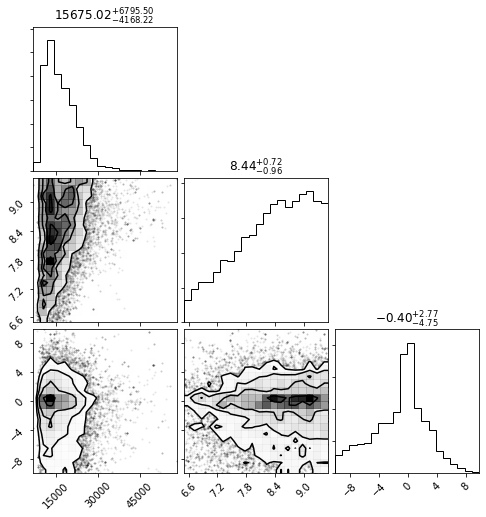

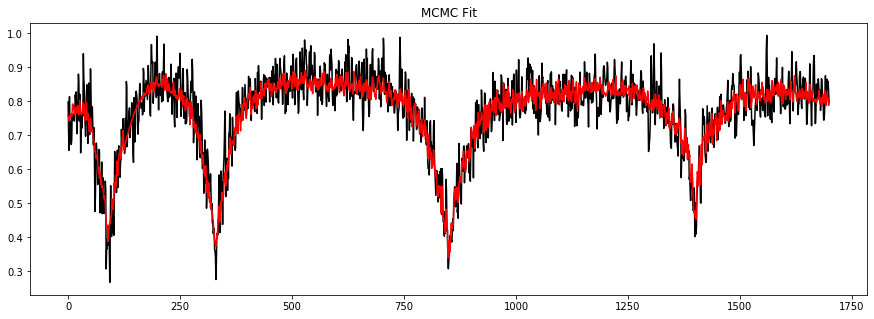

----------------------------------------------------------------------
----------------------------------------------------------------------


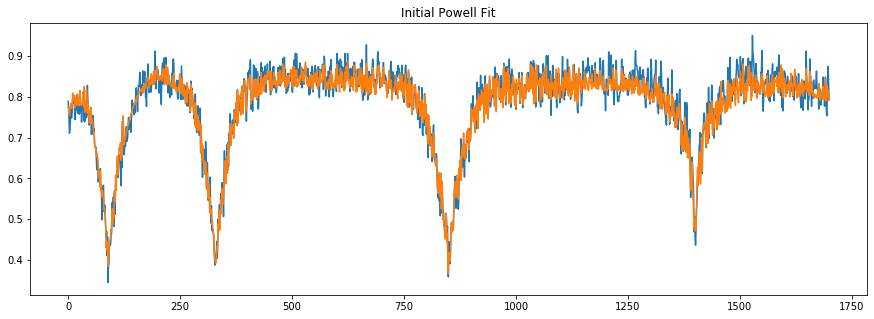

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 87
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.94205533
    reduced chi-square = 5.5480e-04
    Akaike info crit   = -12742.7272
    Bayesian info crit = -12731.8504
[[Variables]]
    teff:   15982.32 (fixed)
    logg:   7.77478183 +/- 0.01091480 (0.14%) (init = 8)
    trans: -0.08220128 +/- 0.02257090 (27.46%) (init = 0)

 Starting Bayesian Sampling...


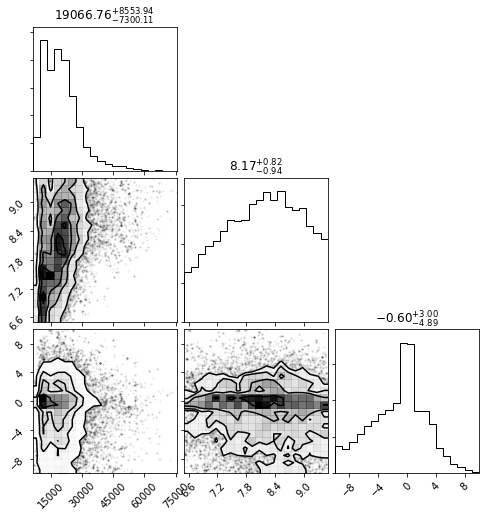

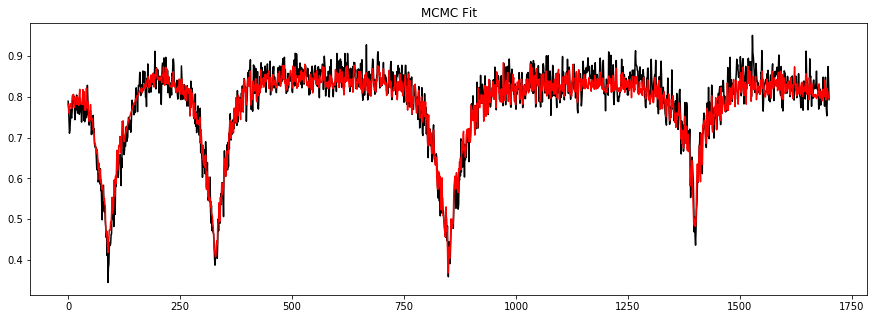

----------------------------------------------------------------------
----------------------------------------------------------------------


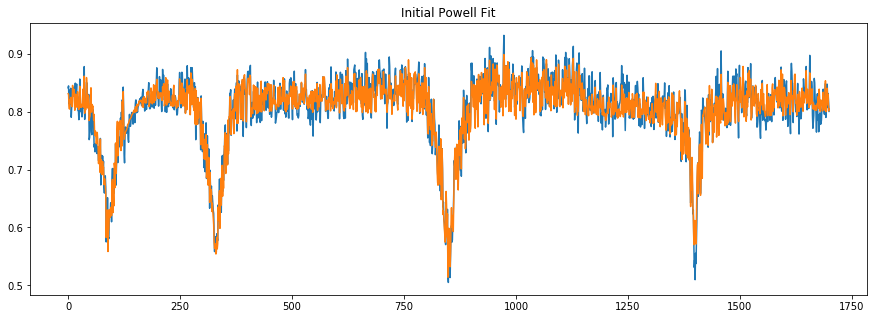

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 92
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.52335159
    reduced chi-square = 3.0822e-04
    Akaike info crit   = -13742.0050
    Bayesian info crit = -13731.1283
[[Variables]]
    teff:   30448.26 (fixed)
    logg:   7.77166954 +/- 0.01255761 (0.16%) (init = 8)
    trans: -0.07150043 +/- 0.01676665 (23.45%) (init = 0)

 Starting Bayesian Sampling...


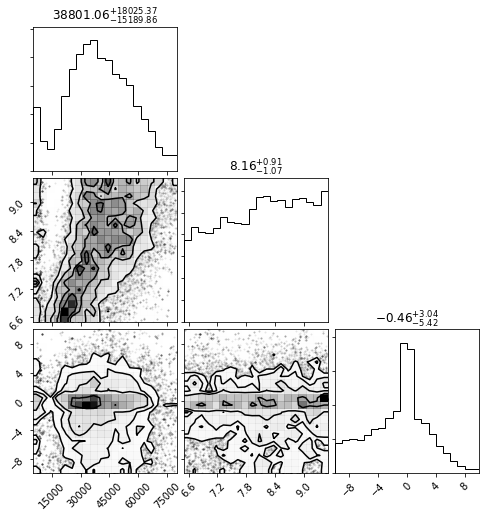

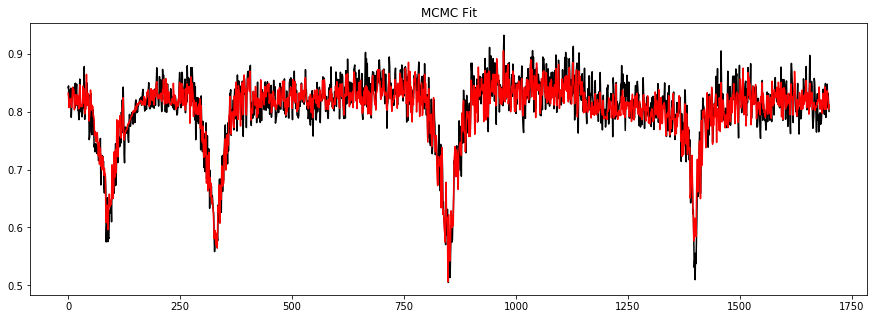

----------------------------------------------------------------------
----------------------------------------------------------------------


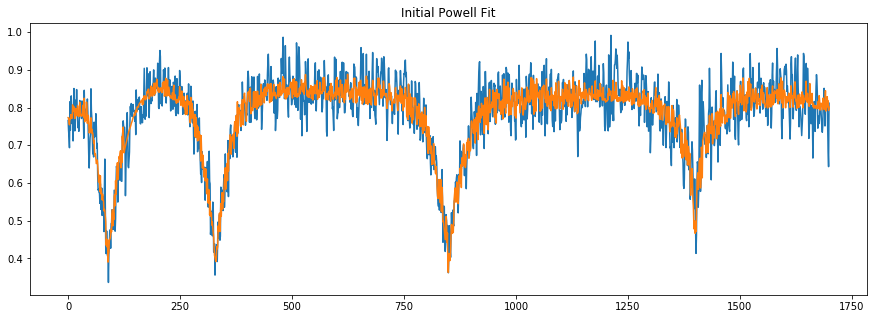

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 83
    # data points      = 1700
    # variables        = 2
    chi-square         = 3.51393485
    reduced chi-square = 0.00206946
    Akaike info crit   = -10504.8000
    Bayesian info crit = -10493.9233
[[Variables]]
    teff:   17325.18 (fixed)
    logg:   8.03567953 +/- 0.04126076 (0.51%) (init = 8)
    trans: -0.03124452 +/- 0.04318655 (138.22%) (init = 0)

 Starting Bayesian Sampling...


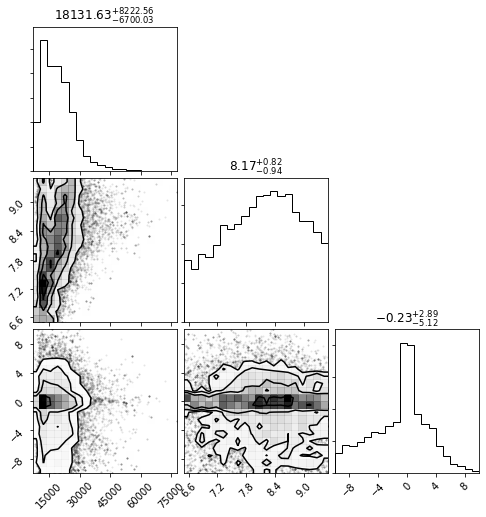

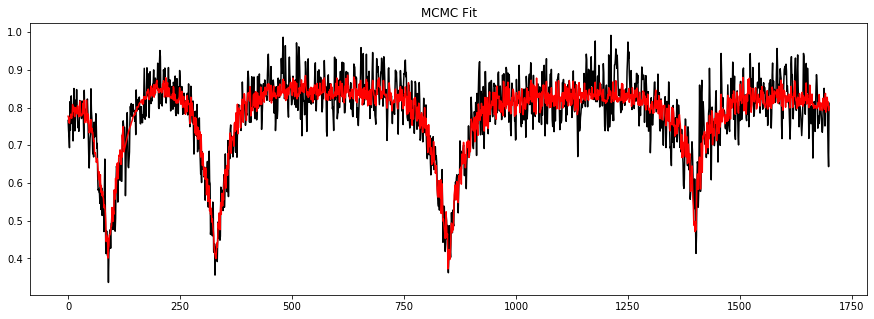

----------------------------------------------------------------------
----------------------------------------------------------------------


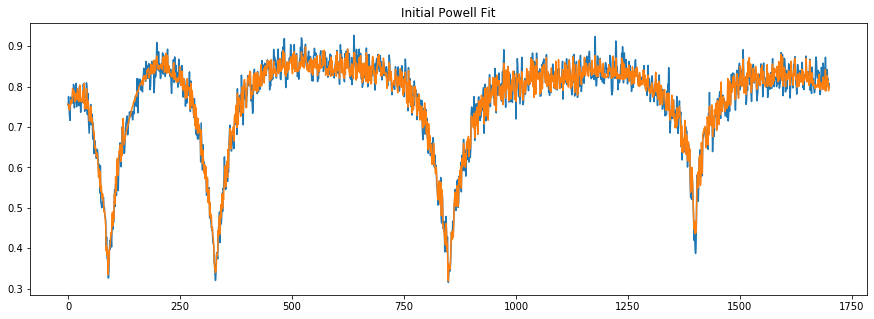

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 108
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.54147990
    reduced chi-square = 3.1889e-04
    Akaike info crit   = -13684.1159
    Bayesian info crit = -13673.2391
[[Variables]]
    teff:   13104.95 (fixed)
    logg:   7.98611915 +/- 0.01601390 (0.20%) (init = 8)
    trans: -0.07269003 +/- 0.01809414 (24.89%) (init = 0)

 Starting Bayesian Sampling...


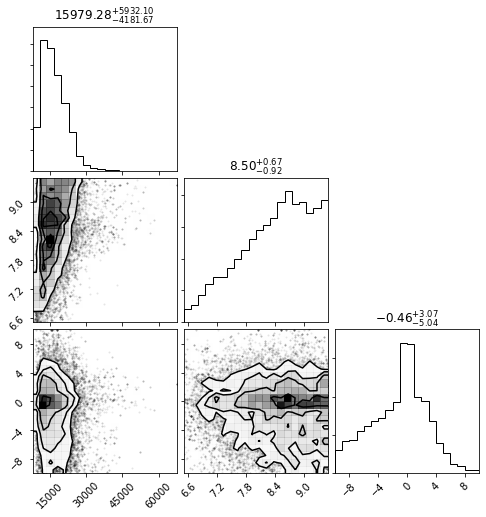

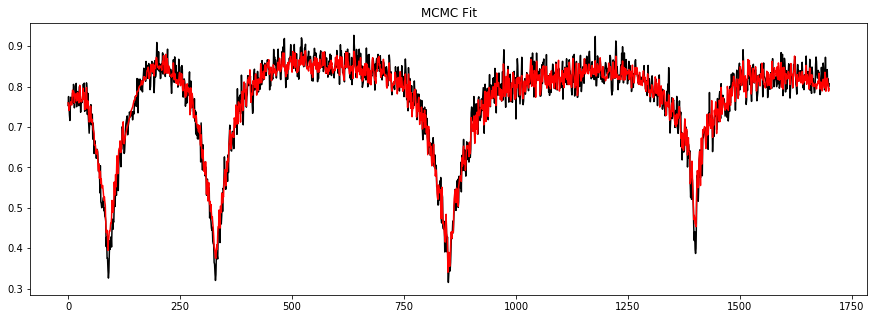

----------------------------------------------------------------------
----------------------------------------------------------------------


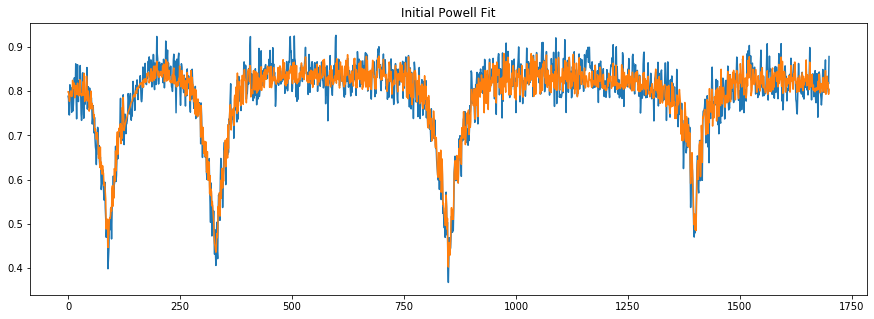

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 90
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.13951110
    reduced chi-square = 6.7109e-04
    Akaike info crit   = -12419.2332
    Bayesian info crit = -12408.3564
[[Variables]]
    teff:   24029.25 (fixed)
    logg:   8.26954071 +/- 0.03223573 (0.39%) (init = 8)
    trans: -0.08498412 +/- 0.02515674 (29.60%) (init = 0)

 Starting Bayesian Sampling...


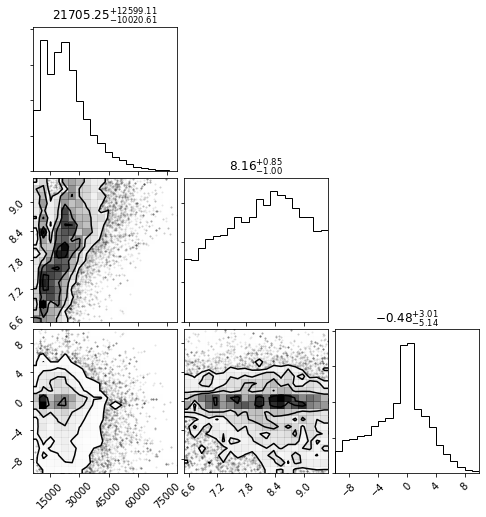

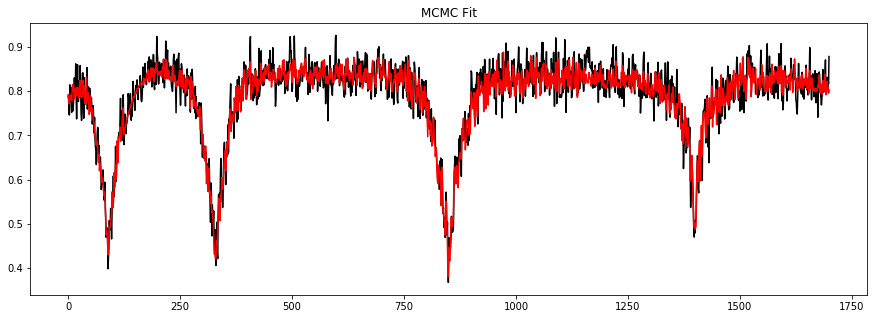

----------------------------------------------------------------------
----------------------------------------------------------------------


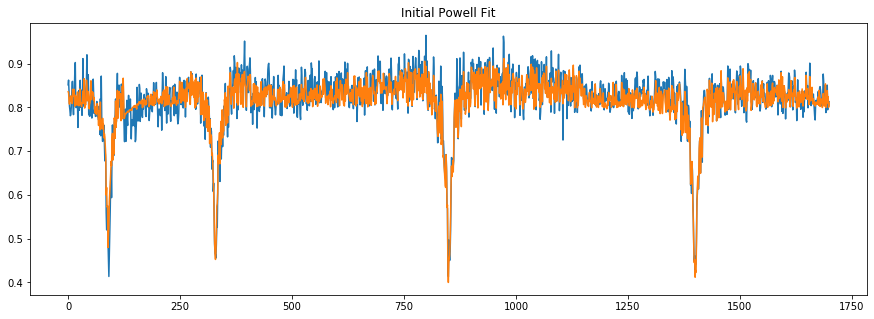

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 85
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.02008760
    reduced chi-square = 6.0076e-04
    Akaike info crit   = -12607.4415
    Bayesian info crit = -12596.5648
[[Variables]]
    teff:   7892.991 (fixed)
    logg:   8.04163327 +/- 0.03795081 (0.47%) (init = 8)
    trans: -0.06618286 +/- 0.02191507 (33.11%) (init = 0)

 Starting Bayesian Sampling...


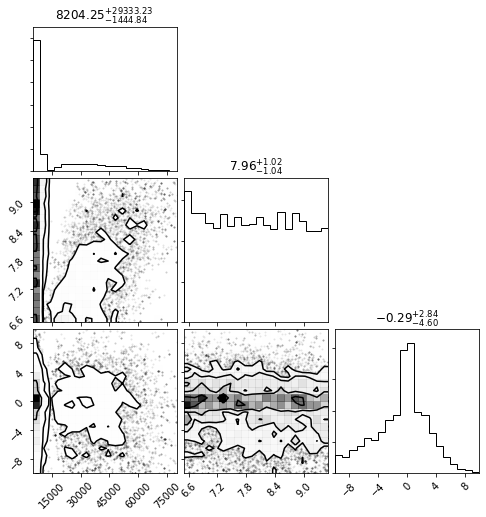

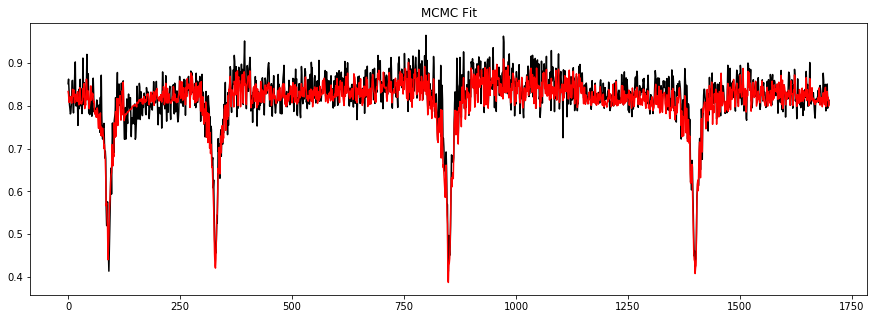

----------------------------------------------------------------------
----------------------------------------------------------------------


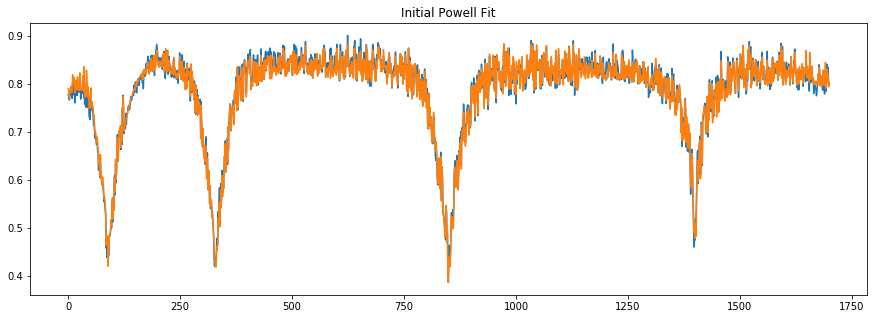

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 88
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.15632947
    reduced chi-square = 9.2067e-05
    Akaike info crit   = -15796.0941
    Bayesian info crit = -15785.2174
[[Variables]]
    teff:   20667.6 (fixed)
    logg:   7.95566063 +/- 0.00757951 (0.10%) (init = 8)
    trans: -0.06580468 +/- 0.00928513 (14.11%) (init = 0)

 Starting Bayesian Sampling...


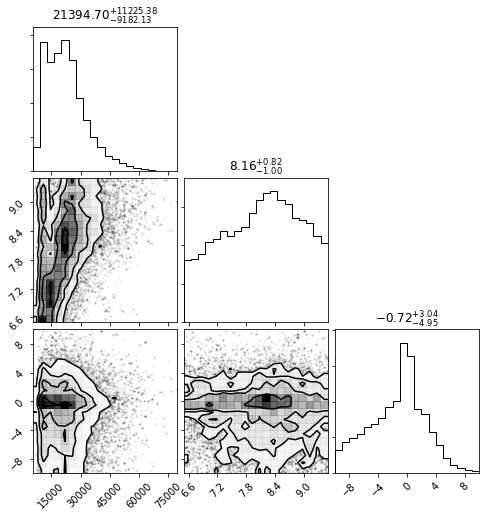

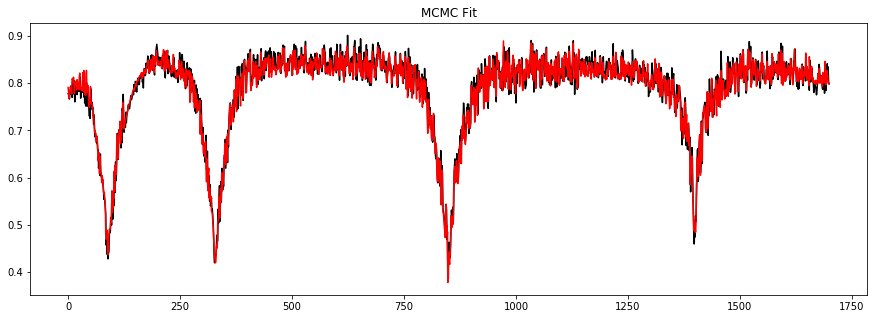

----------------------------------------------------------------------
----------------------------------------------------------------------


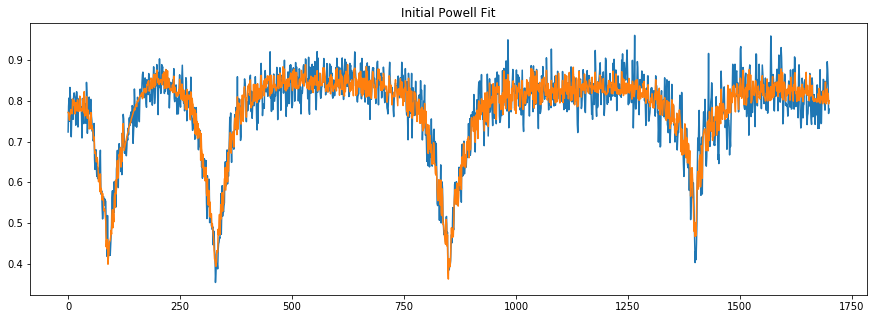

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 75
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.94859626
    reduced chi-square = 0.00114758
    Akaike info crit   = -11507.1663
    Bayesian info crit = -11496.2895
[[Variables]]
    teff:   17638.27 (fixed)
    logg:   8.21872630 +/- 0.03314676 (0.40%) (init = 8)
    trans:  0.02179623 +/- 0.02972945 (136.40%) (init = 0)

 Starting Bayesian Sampling...


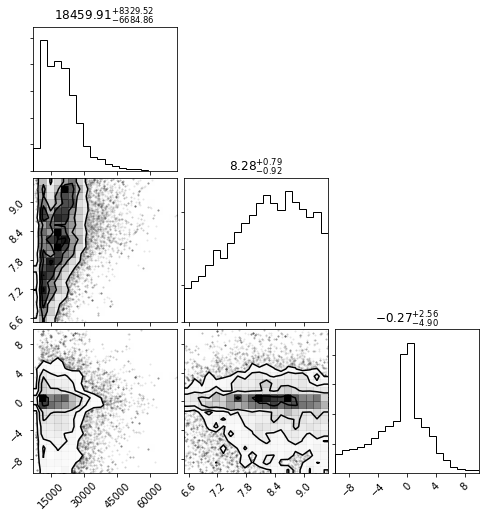

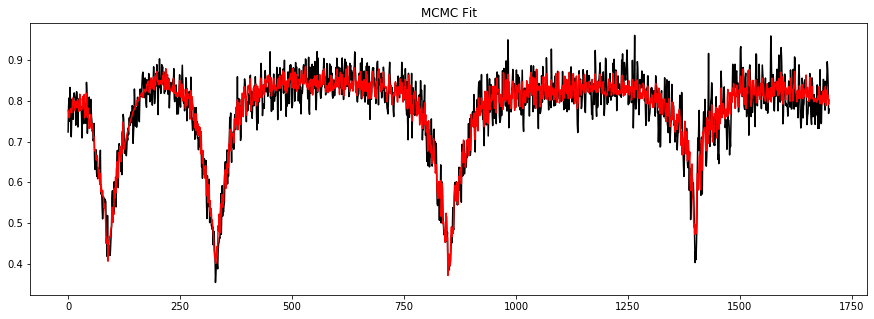

----------------------------------------------------------------------
----------------------------------------------------------------------


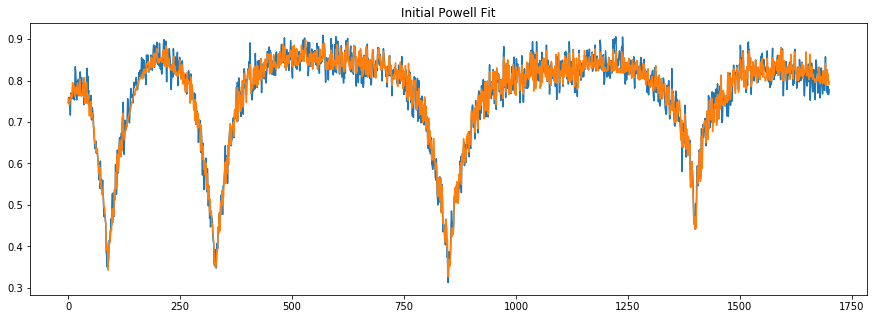

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 71
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.60888940
    reduced chi-square = 3.5859e-04
    Akaike info crit   = -13484.6537
    Bayesian info crit = -13473.7769
[[Variables]]
    teff:   13959.58 (fixed)
    logg:   8.03308468 +/- 0.03437992 (0.43%) (init = 8)
    trans: -0.09726700 +/- 0.01864444 (19.17%) (init = 0)

 Starting Bayesian Sampling...


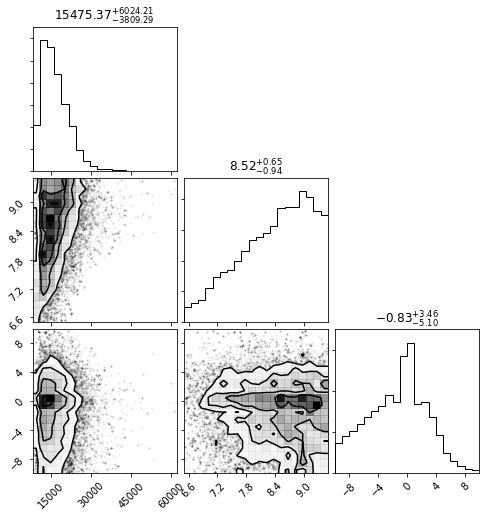

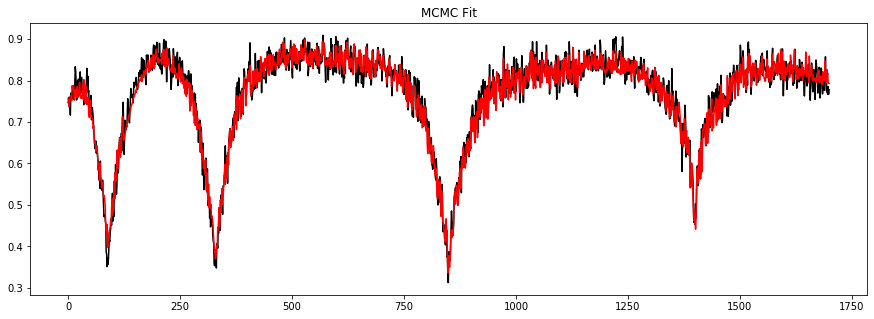

----------------------------------------------------------------------
----------------------------------------------------------------------


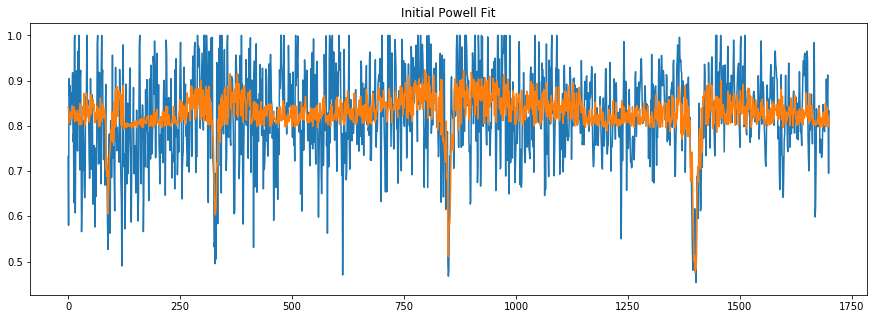

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 103
    # data points      = 1700
    # variables        = 2
    chi-square         = 12.7287305
    reduced chi-square = 0.00749631
    Akaike info crit   = -8316.68714
    Bayesian info crit = -8305.81037
[[Variables]]
    teff:   6352.488 (fixed)
    logg:   7.51472253 +/- 0.22178687 (2.95%) (init = 8)
    trans: -0.10002895 +/- 0.08096271 (80.94%) (init = 0)

 Starting Bayesian Sampling...


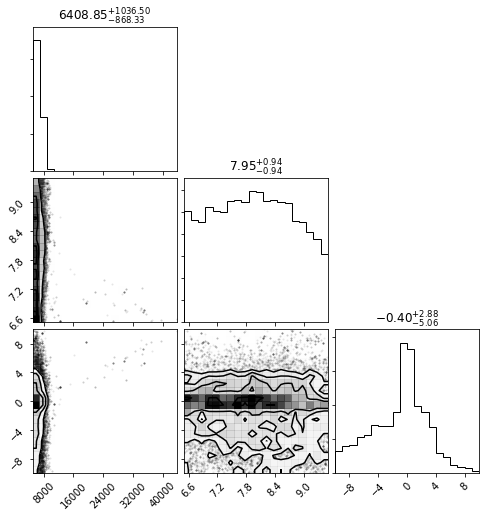

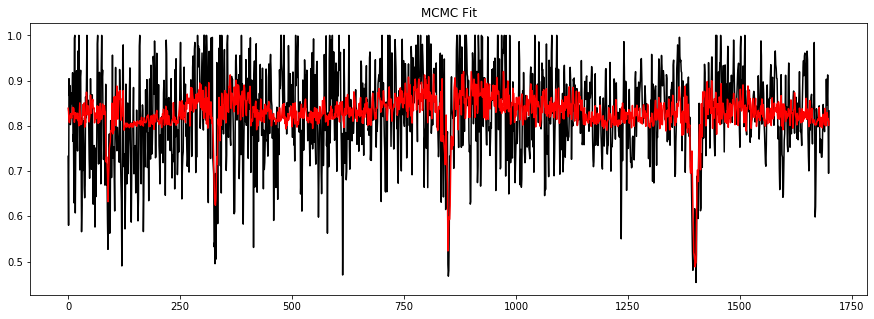

----------------------------------------------------------------------
----------------------------------------------------------------------


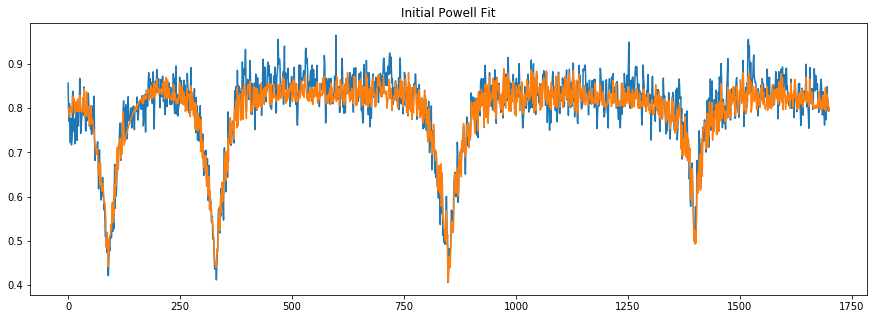

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 90
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.45929364
    reduced chi-square = 8.5942e-04
    Akaike info crit   = -11998.7327
    Bayesian info crit = -11987.8560
[[Variables]]
    teff:   21879.71 (fixed)
    logg:   7.82080670 +/- 0.01994391 (0.26%) (init = 8)
    trans: -0.07024537 +/- 0.02893149 (41.19%) (init = 0)

 Starting Bayesian Sampling...


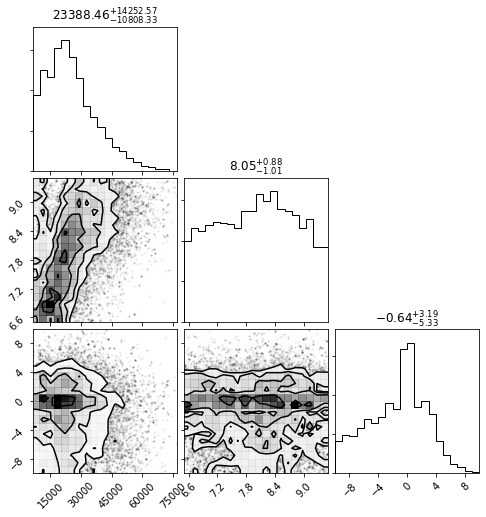

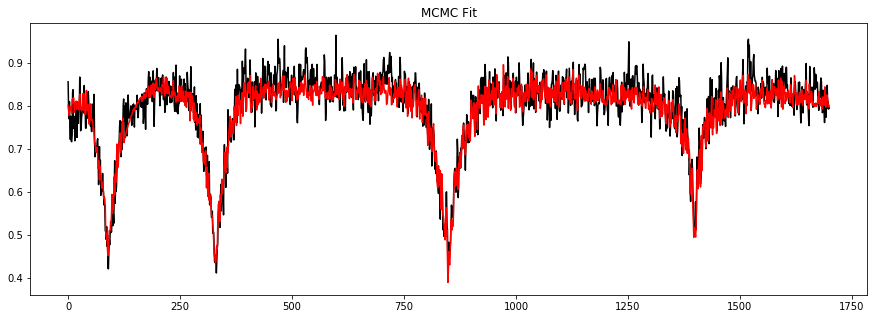

----------------------------------------------------------------------
----------------------------------------------------------------------


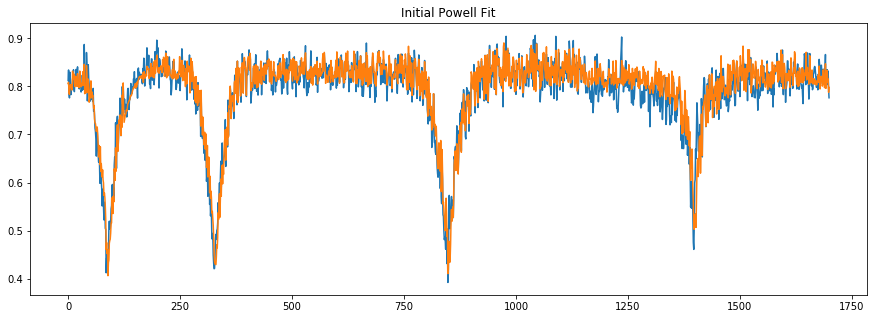

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 77
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.90771910
    reduced chi-square = 5.3458e-04
    Akaike info crit   = -12805.8465
    Bayesian info crit = -12794.9698
##  Warning: uncertainties could not be estimated:
    teff:   at initial value
[[Variables]]
    teff:   13120.13 (fixed)
    logg:   6.50163890 +/- 0.07388907 (1.14%) (init = 8)
    trans: -0.15933082 +/-        nan (nan%) (init = 0)

 Starting Bayesian Sampling...


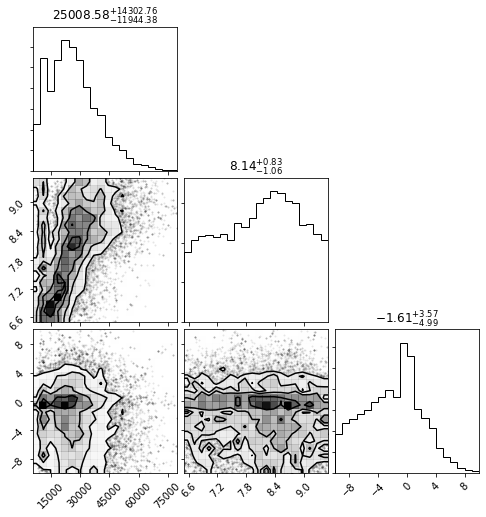

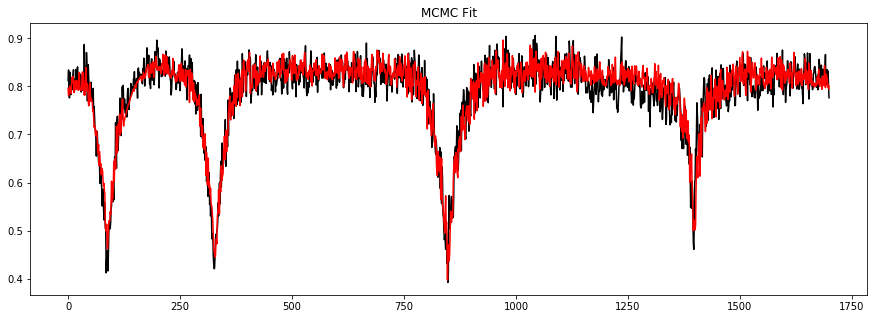

----------------------------------------------------------------------
----------------------------------------------------------------------


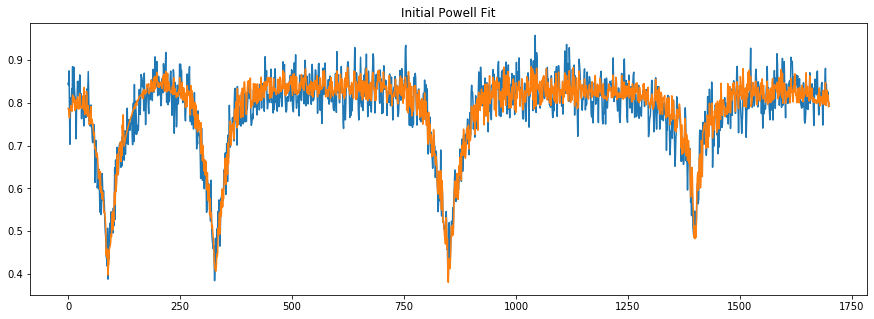

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 89
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.73707075
    reduced chi-square = 0.00102301
    Akaike info crit   = -11702.5116
    Bayesian info crit = -11691.6349
[[Variables]]
    teff:   15699.48 (fixed)
    logg:   7.35109988 +/- 0.05101833 (0.69%) (init = 8)
    trans: -0.04319090 +/- 0.03004880 (69.57%) (init = 0)

 Starting Bayesian Sampling...


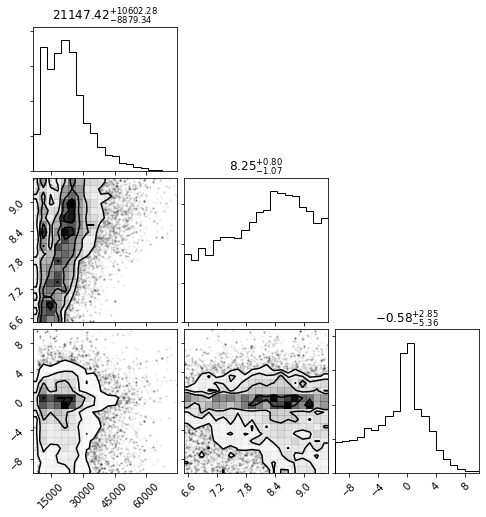

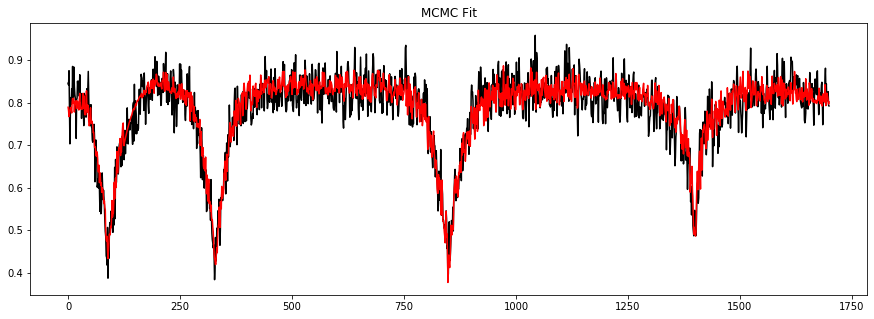

----------------------------------------------------------------------
----------------------------------------------------------------------


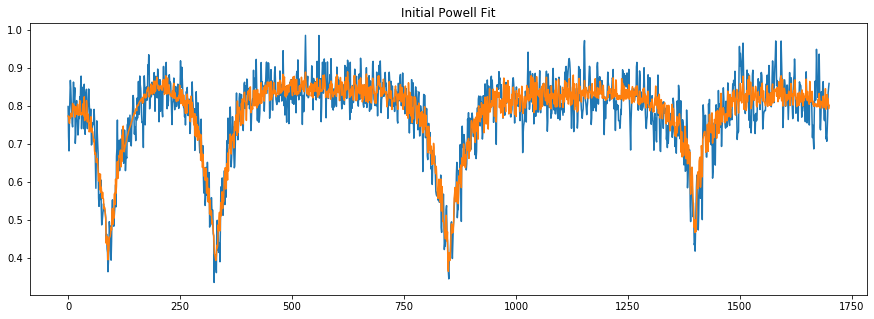

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 65
    # data points      = 1700
    # variables        = 2
    chi-square         = 2.97414732
    reduced chi-square = 0.00175156
    Akaike info crit   = -10788.3245
    Bayesian info crit = -10777.4477
[[Variables]]
    teff:   17604.95 (fixed)
    logg:   8.16183480 +/- 0.04945556 (0.61%) (init = 8)
    trans: -0.04539788 +/- 0.04377229 (96.42%) (init = 0)

 Starting Bayesian Sampling...


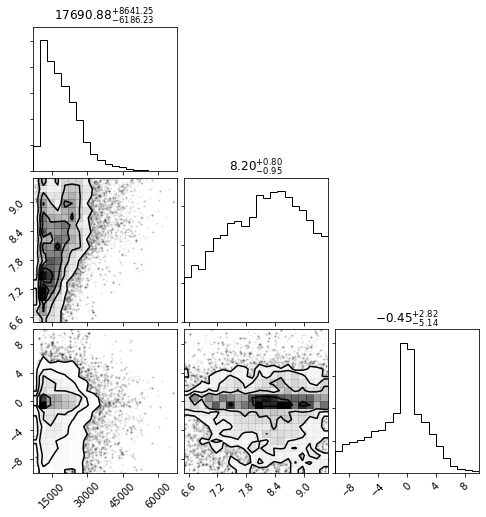

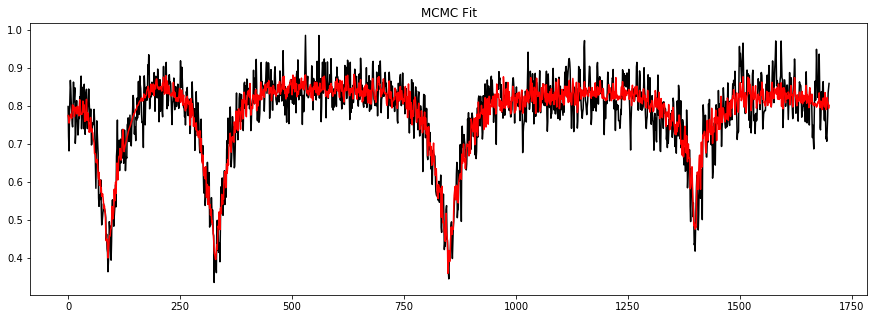

----------------------------------------------------------------------
----------------------------------------------------------------------


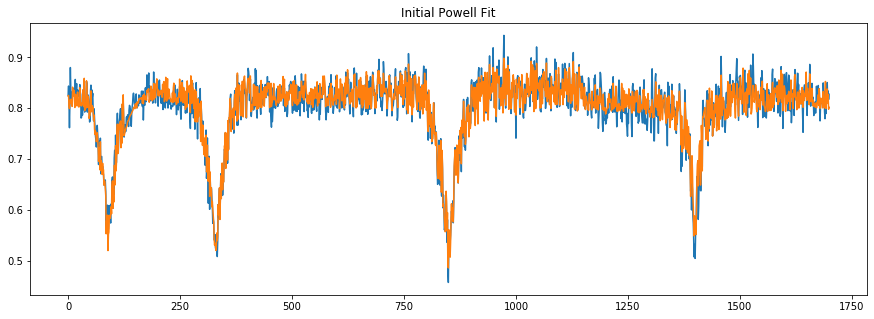

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 90
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.58678717
    reduced chi-square = 3.4558e-04
    Akaike info crit   = -13547.5103
    Bayesian info crit = -13536.6335
[[Variables]]
    teff:   25790.93 (fixed)
    logg:   7.38577112 +/- 0.00975303 (0.13%) (init = 8)
    trans: -0.04501537 +/- 0.01764540 (39.20%) (init = 0)

 Starting Bayesian Sampling...


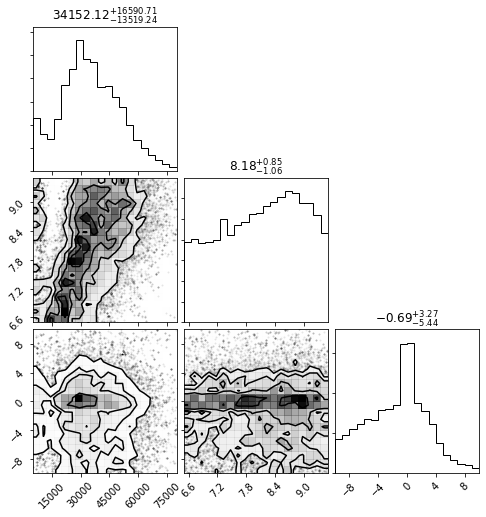

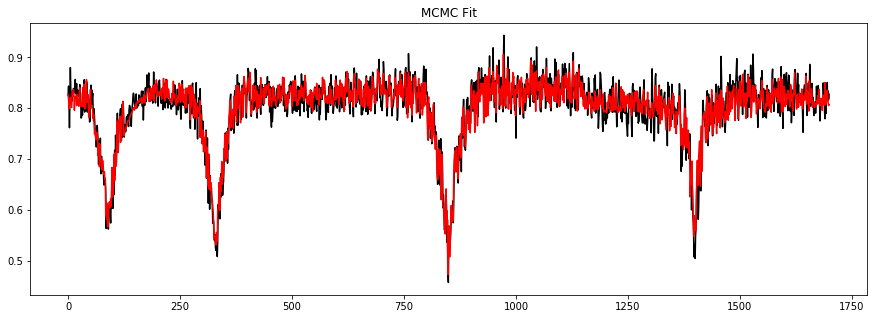

----------------------------------------------------------------------
----------------------------------------------------------------------


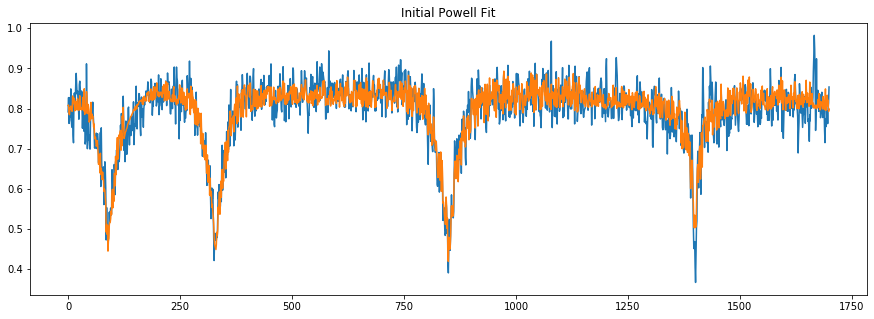

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 100
    # data points      = 1700
    # variables        = 2
    chi-square         = 2.02763572
    reduced chi-square = 0.00119413
    Akaike info crit   = -11439.5722
    Bayesian info crit = -11428.6955
[[Variables]]
    teff:   19863.45 (fixed)
    logg:   7.33724713 +/- 0.02341290 (0.32%) (init = 8)
    trans: -0.05397971 +/- 0.03393205 (62.86%) (init = 0)

 Starting Bayesian Sampling...


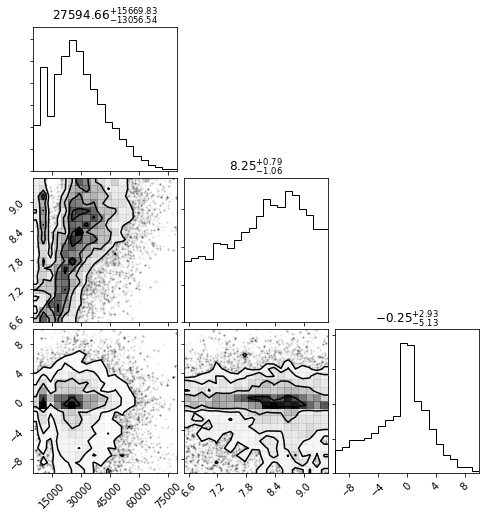

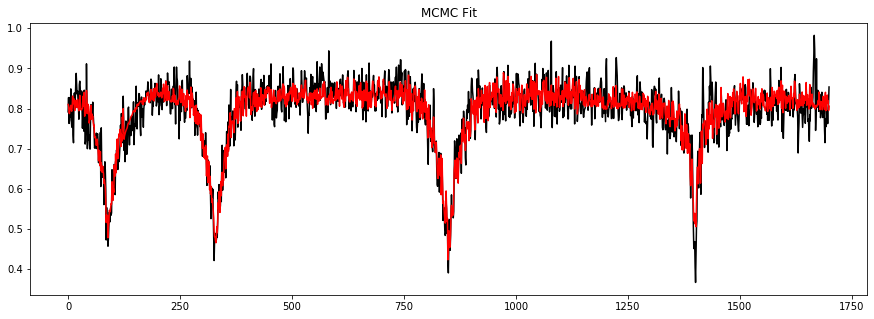

----------------------------------------------------------------------
----------------------------------------------------------------------


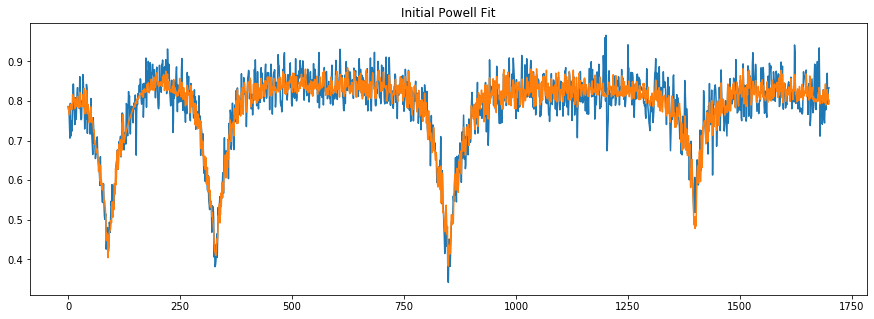

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 64
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.79286708
    reduced chi-square = 0.00105587
    Akaike info crit   = -11648.7647
    Bayesian info crit = -11637.8879
[[Variables]]
    teff:   17980.13 (fixed)
    logg:   7.76562987 +/- 0.02803812 (0.36%) (init = 8)
    trans: -0.11993879 +/- 0.02993178 (24.96%) (init = 0)

 Starting Bayesian Sampling...


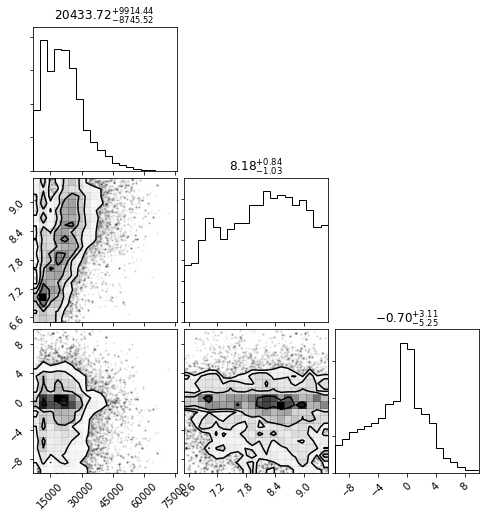

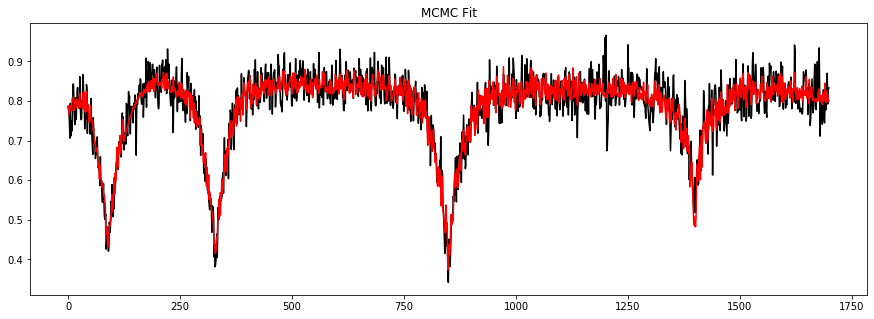

----------------------------------------------------------------------
----------------------------------------------------------------------


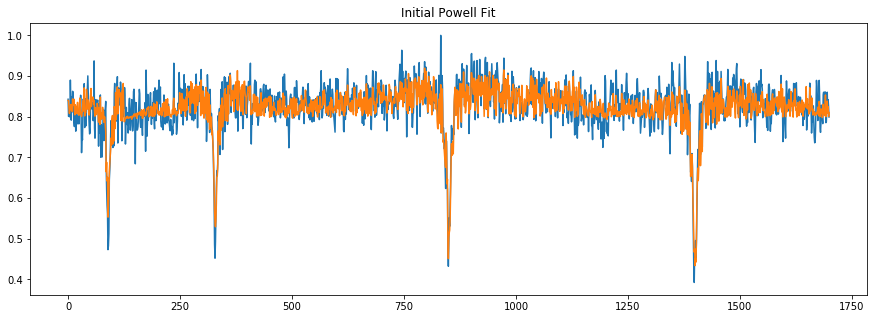

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 86
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.79285364
    reduced chi-square = 0.00105586
    Akaike info crit   = -11648.7774
    Bayesian info crit = -11637.9007
[[Variables]]
    teff:   7118.603 (fixed)
    logg:   8.04085220 +/- 0.03356375 (0.42%) (init = 8)
    trans: -0.04531580 +/- 0.02739364 (60.45%) (init = 0)

 Starting Bayesian Sampling...


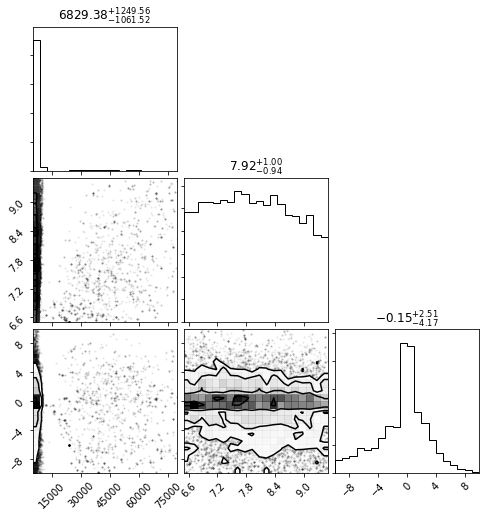

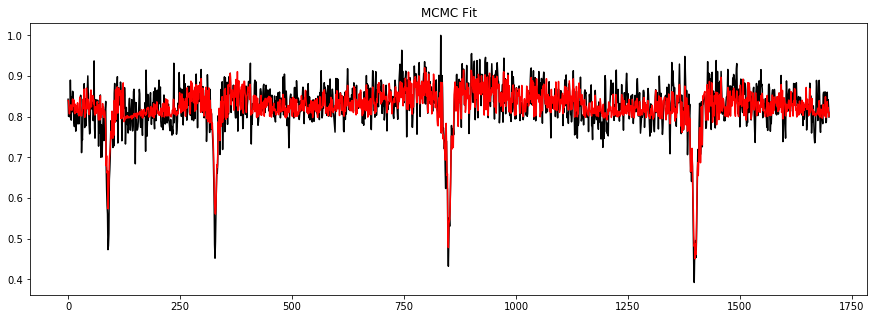

----------------------------------------------------------------------
----------------------------------------------------------------------


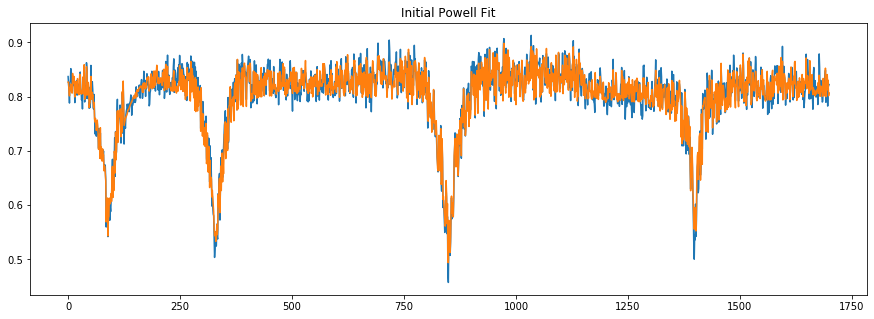

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 142
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.32969681
    reduced chi-square = 1.9417e-04
    Akaike info crit   = -14527.5410
    Bayesian info crit = -14516.6643
[[Variables]]
    teff:   31454.43 (fixed)
    logg:   7.96087246 +/- 0.00670331 (0.08%) (init = 8)
    trans: -0.06374853 +/- 0.01317420 (20.67%) (init = 0)

 Starting Bayesian Sampling...


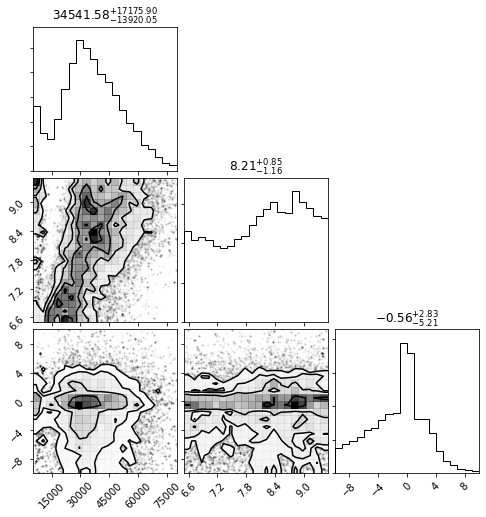

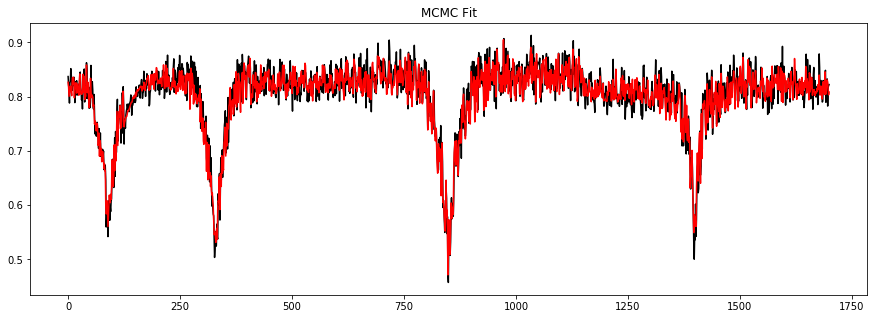

----------------------------------------------------------------------
----------------------------------------------------------------------


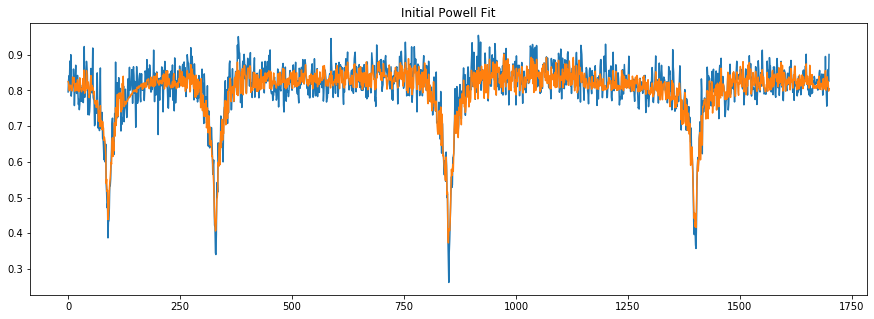

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 91
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.79709304
    reduced chi-square = 0.00105836
    Akaike info crit   = -11644.7624
    Bayesian info crit = -11633.8856
[[Variables]]
    teff:   9162.165 (fixed)
    logg:   8.36748341 +/- 0.02931866 (0.35%) (init = 8)
    trans: -0.08440607 +/- 0.02931219 (34.73%) (init = 0)

 Starting Bayesian Sampling...


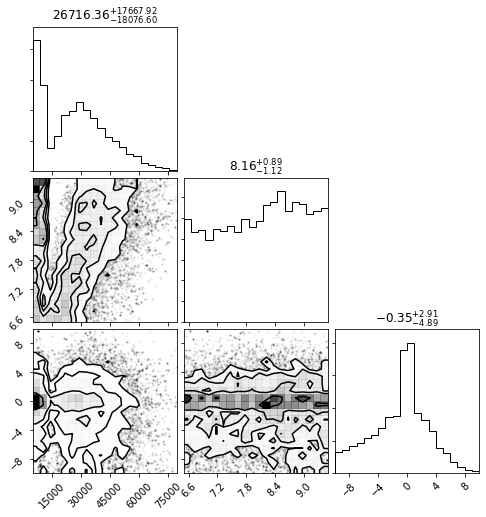

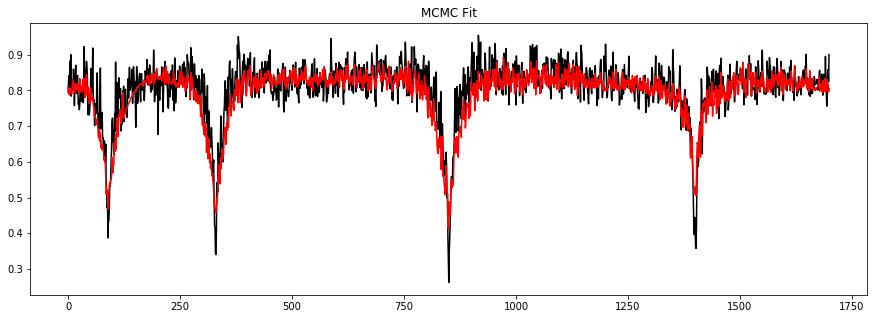

----------------------------------------------------------------------
----------------------------------------------------------------------


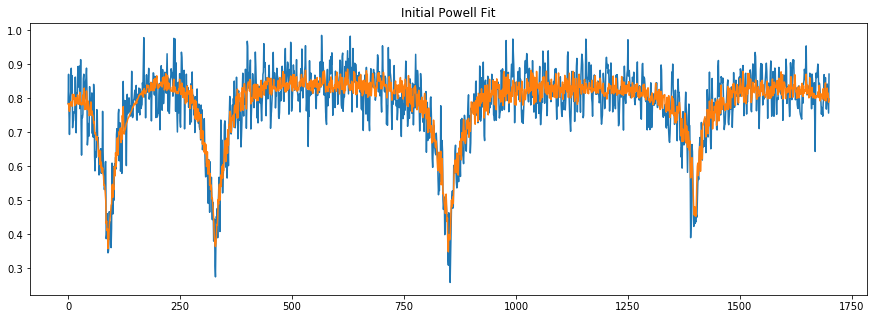

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 92
    # data points      = 1700
    # variables        = 2
    chi-square         = 4.38634134
    reduced chi-square = 0.00258324
    Akaike info crit   = -10127.8097
    Bayesian info crit = -10116.9329
[[Variables]]
    teff:   9511.761 (fixed)
    logg:   7.29495799 +/- 0.03533292 (0.48%) (init = 8)
    trans: -0.11080806 +/- 0.04561748 (41.17%) (init = 0)

 Starting Bayesian Sampling...


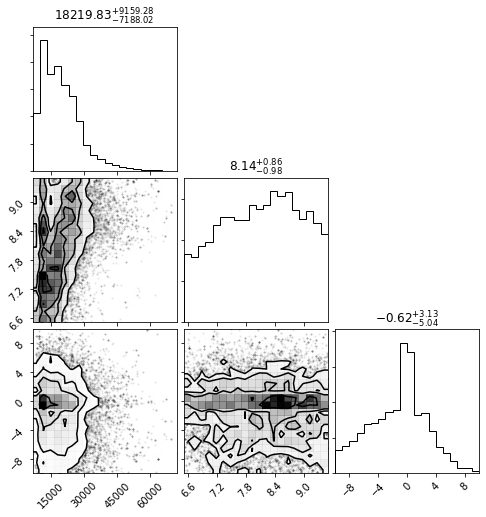

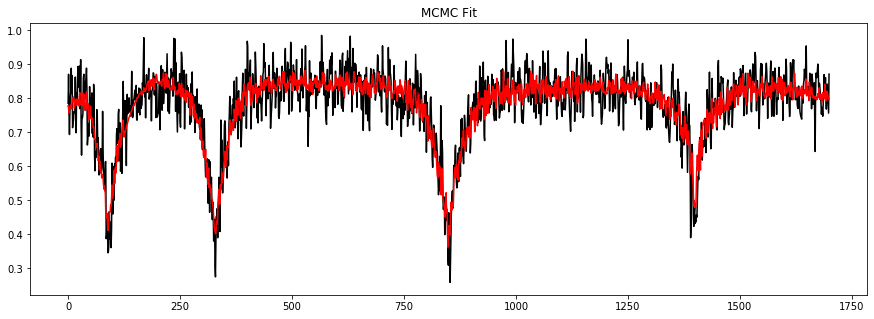

----------------------------------------------------------------------
----------------------------------------------------------------------


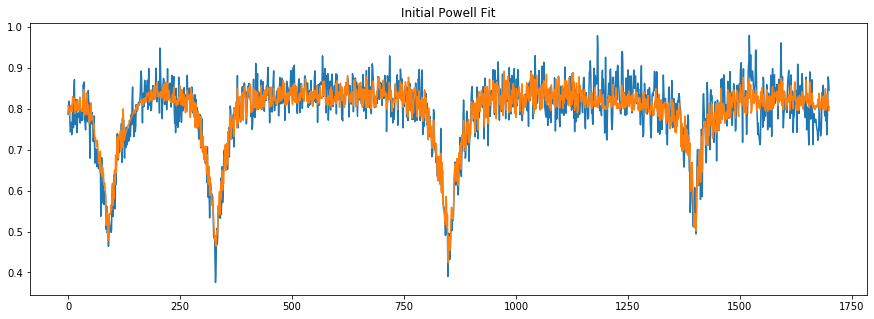

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 60
    # data points      = 1700
    # variables        = 2
    chi-square         = 2.06172204
    reduced chi-square = 0.00121421
    Akaike info crit   = -11411.2313
    Bayesian info crit = -11400.3546
[[Variables]]
    teff:   27411.16 (fixed)
    logg:   8.27804176 +/- 0.03645288 (0.44%) (init = 8)
    trans: -0.01037736 +/- 0.03234096 (311.65%) (init = 0)

 Starting Bayesian Sampling...


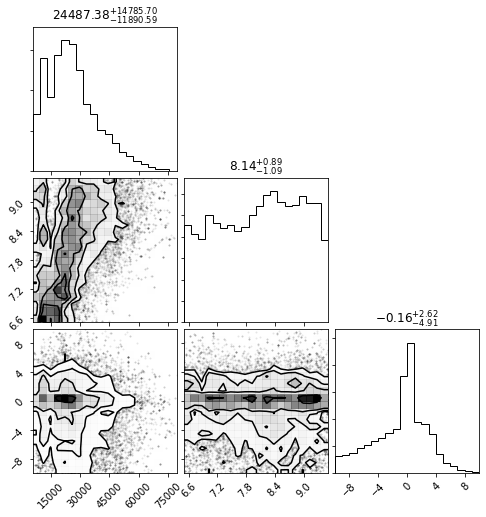

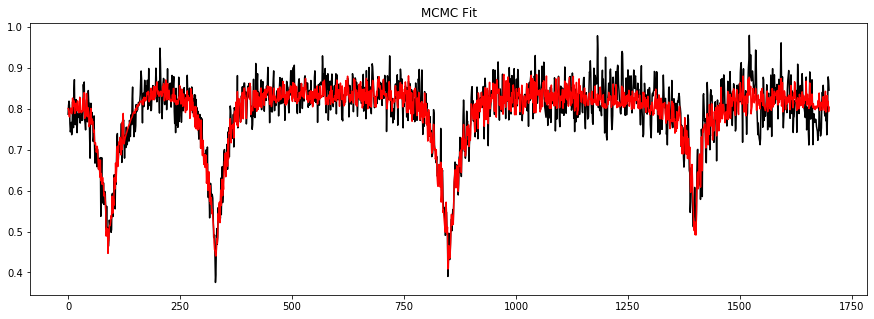

----------------------------------------------------------------------
----------------------------------------------------------------------


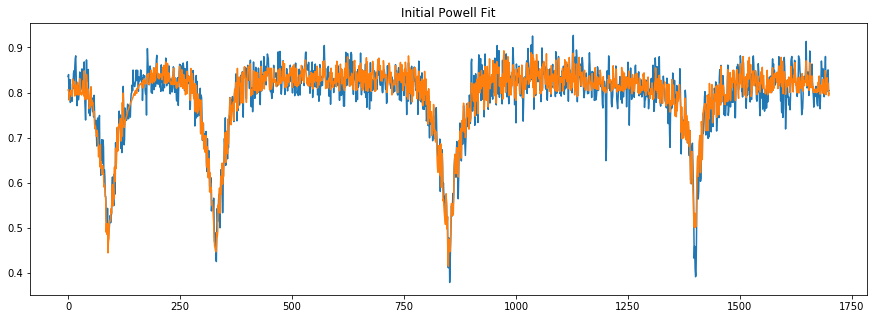

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 92
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.06951370
    reduced chi-square = 6.2987e-04
    Akaike info crit   = -12527.0051
    Bayesian info crit = -12516.1283
[[Variables]]
    teff:   20292.52 (fixed)
    logg:   7.43146606 +/- 0.02578946 (0.35%) (init = 8)
    trans: -0.04009990 +/- 0.02472589 (61.66%) (init = 0)

 Starting Bayesian Sampling...


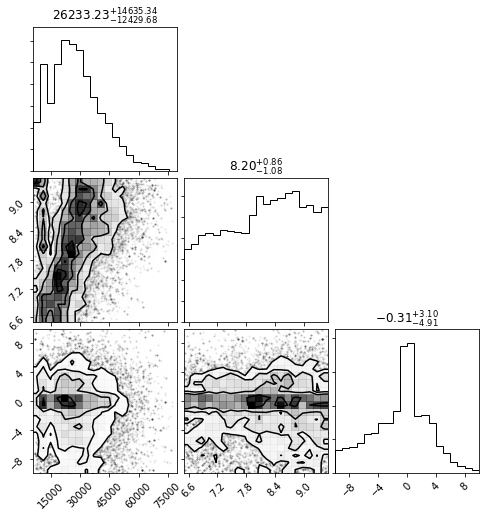

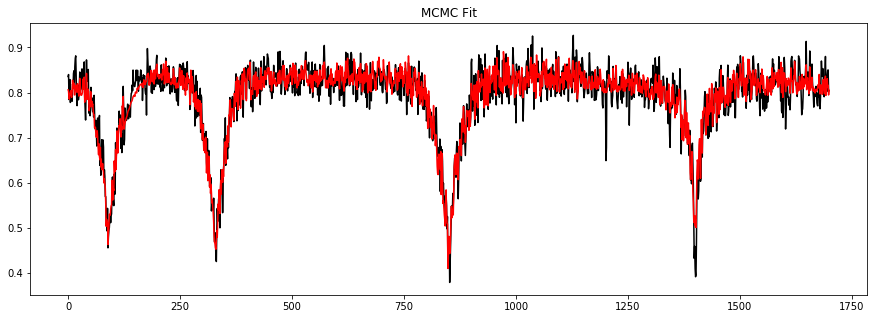

----------------------------------------------------------------------
----------------------------------------------------------------------


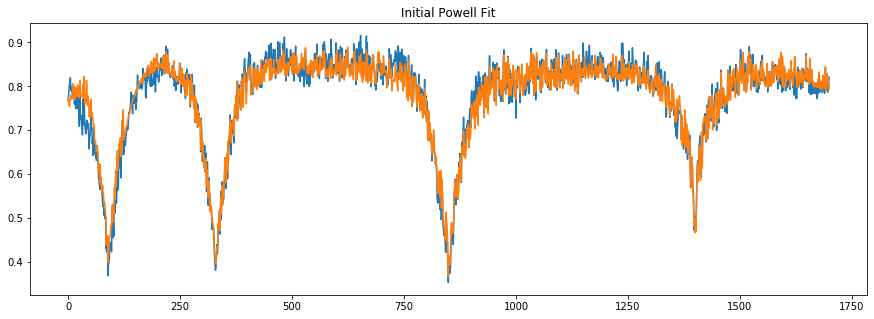

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 68
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.69678772
    reduced chi-square = 4.1036e-04
    Akaike info crit   = -13255.4186
    Bayesian info crit = -13244.5418
[[Variables]]
    teff:   17807.23 (fixed)
    logg:   8.21970571 +/- 0.02580158 (0.31%) (init = 8)
    trans: -0.05968105 +/- 0.02001706 (33.54%) (init = 0)

 Starting Bayesian Sampling...


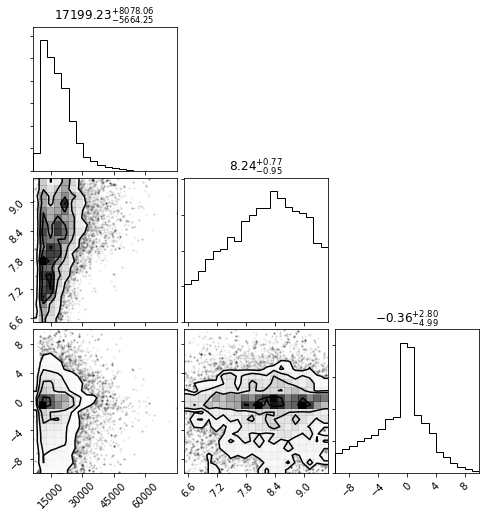

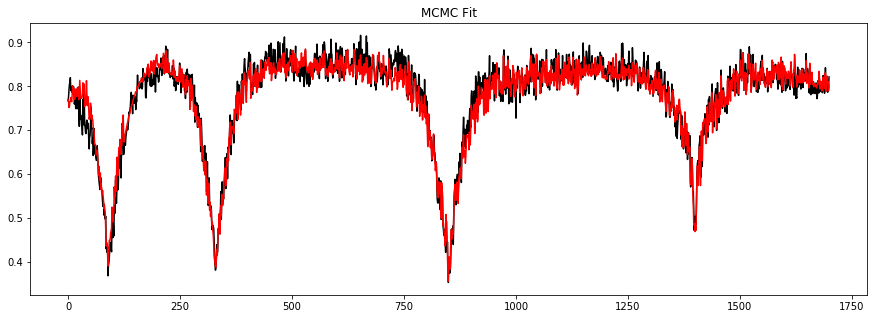

----------------------------------------------------------------------
----------------------------------------------------------------------


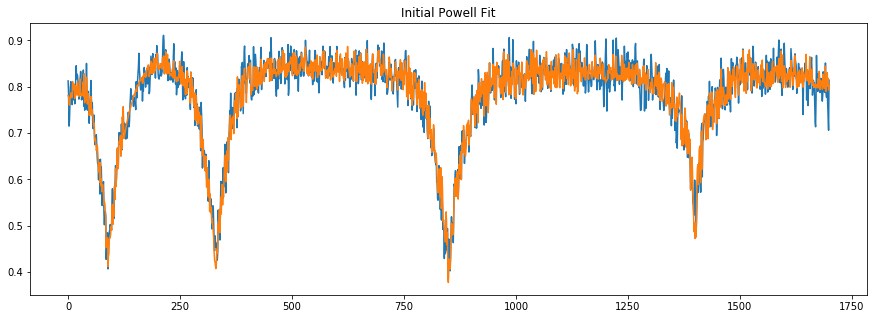

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 87
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.81076281
    reduced chi-square = 4.7748e-04
    Akaike info crit   = -12997.8775
    Bayesian info crit = -12987.0008
[[Variables]]
    teff:   19198.64 (fixed)
    logg:   8.21008345 +/- 0.02764096 (0.34%) (init = 8)
    trans: -0.06379559 +/- 0.02236179 (35.05%) (init = 0)

 Starting Bayesian Sampling...


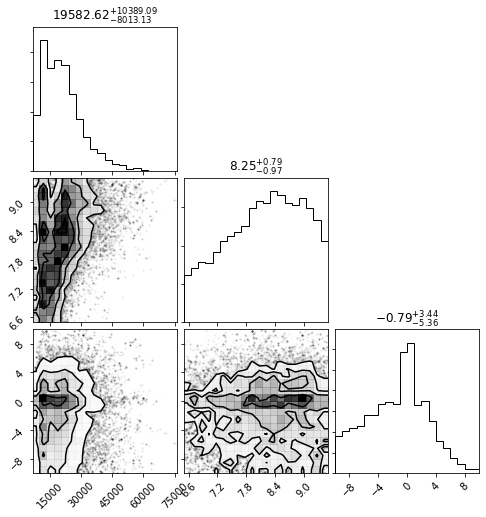

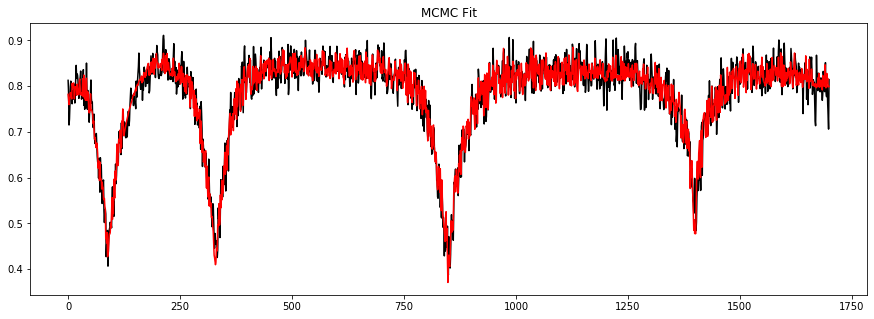

----------------------------------------------------------------------
----------------------------------------------------------------------


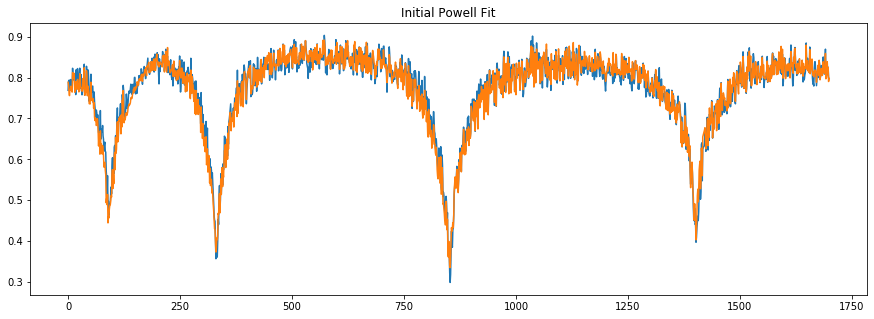

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 82
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.46267328
    reduced chi-square = 2.7248e-04
    Akaike info crit   = -13951.5000
    Bayesian info crit = -13940.6233
[[Variables]]
    teff:   11309.75 (fixed)
    logg:   9.26563705 +/- 0.03366563 (0.36%) (init = 8)
    trans: -0.04234432 +/- 0.01651969 (39.01%) (init = 0)

 Starting Bayesian Sampling...


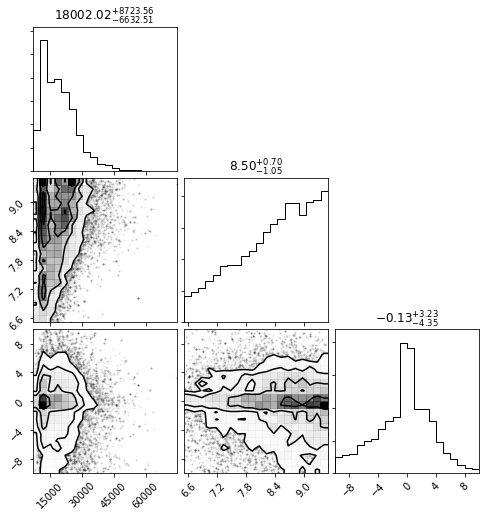

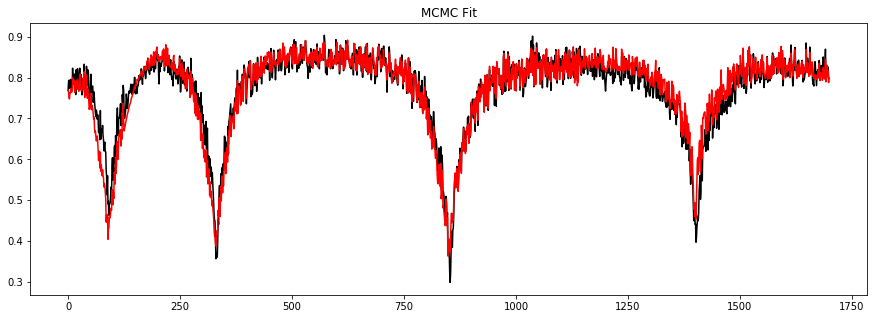

----------------------------------------------------------------------
----------------------------------------------------------------------


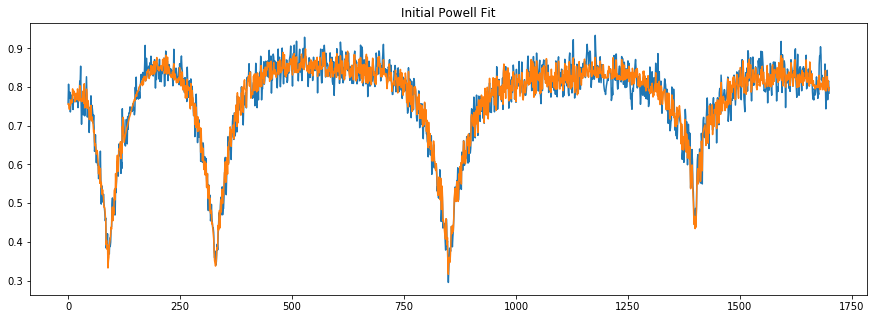

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 140
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.95953184
    reduced chi-square = 5.6510e-04
    Akaike info crit   = -12711.4786
    Bayesian info crit = -12700.6019
[[Variables]]
    teff:   11965.88 (fixed)
    logg:   7.90289531 +/- 0.01919602 (0.24%) (init = 8)
    trans: -0.04486394 +/- 0.02426265 (54.08%) (init = 0)

 Starting Bayesian Sampling...


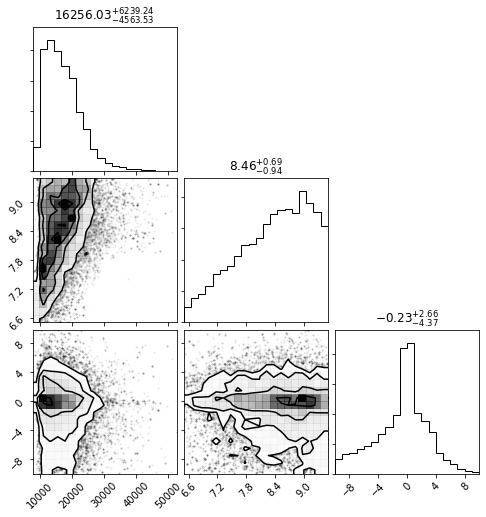

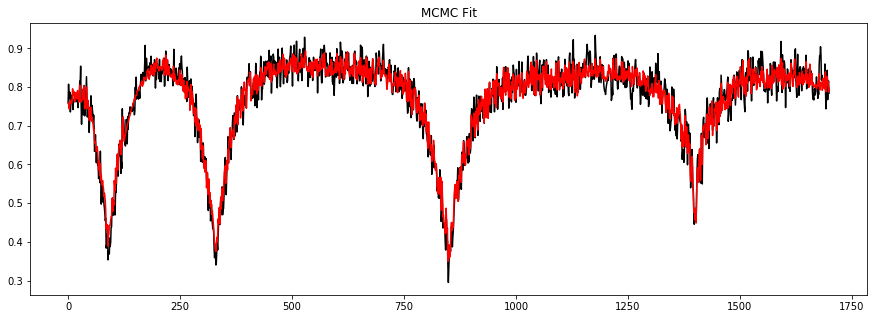

----------------------------------------------------------------------
----------------------------------------------------------------------


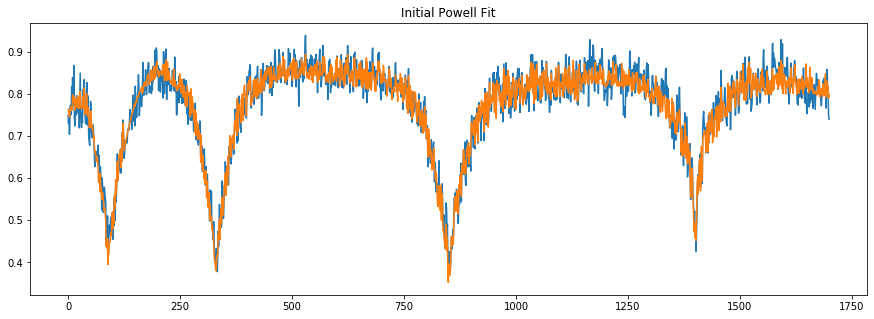

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 100
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.09710935
    reduced chi-square = 6.4612e-04
    Akaike info crit   = -12483.6979
    Bayesian info crit = -12472.8212
[[Variables]]
    teff:   17089.22 (fixed)
    logg:   8.44707776 +/- 0.02260658 (0.27%) (init = 8)
    trans: -0.03566004 +/- 0.02607100 (73.11%) (init = 0)

 Starting Bayesian Sampling...


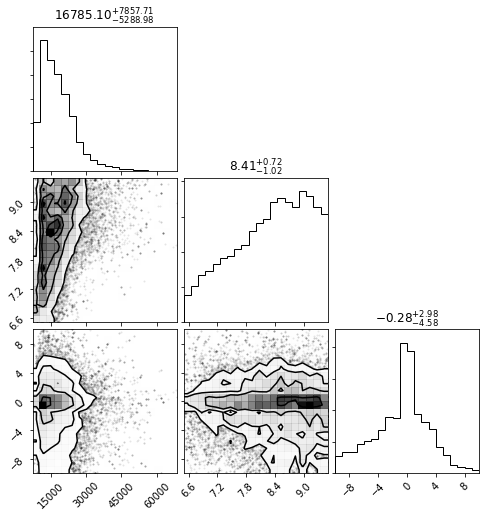

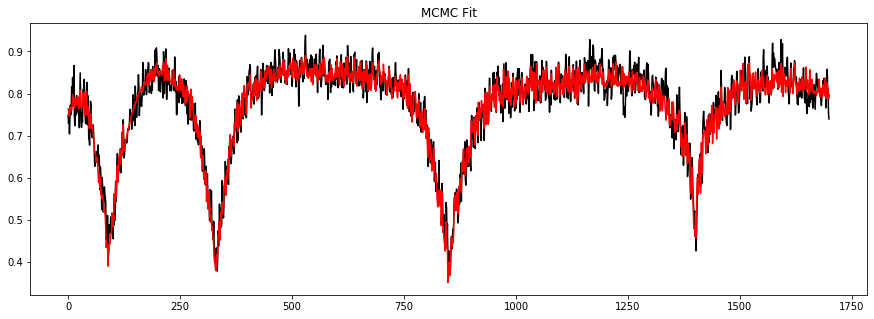

----------------------------------------------------------------------
----------------------------------------------------------------------


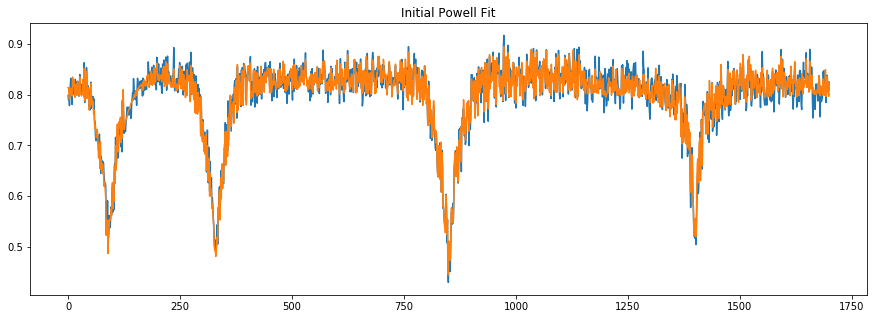

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 73
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.35772562
    reduced chi-square = 2.1067e-04
    Akaike info crit   = -14388.8333
    Bayesian info crit = -14377.9566
##  Warning: uncertainties could not be estimated:
    teff:   at initial value
[[Variables]]
    teff:   26600.46 (fixed)
    logg:   7.87040659 +/- 0.00842204 (0.11%) (init = 8)
    trans: -0.05380651 +/-        nan (nan%) (init = 0)

 Starting Bayesian Sampling...


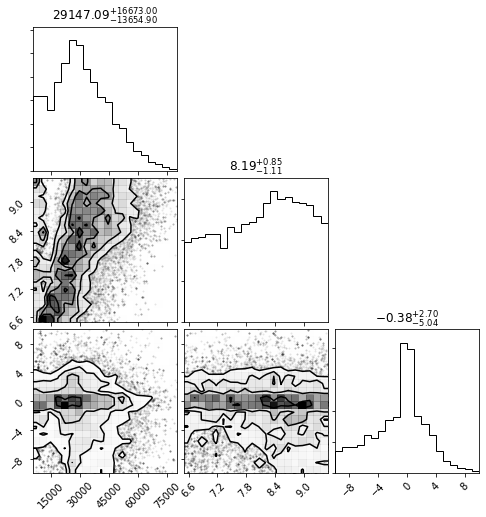

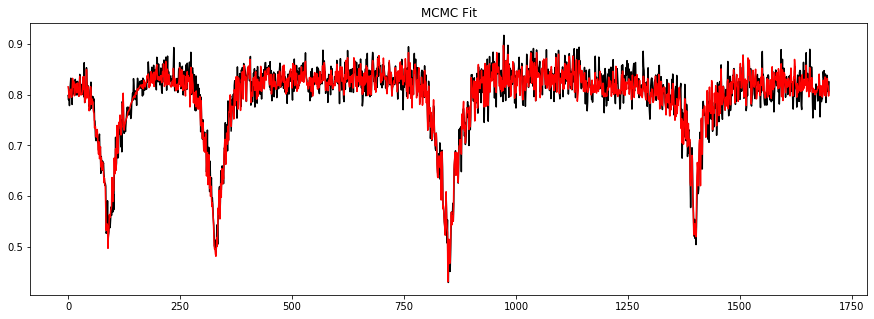

----------------------------------------------------------------------
----------------------------------------------------------------------


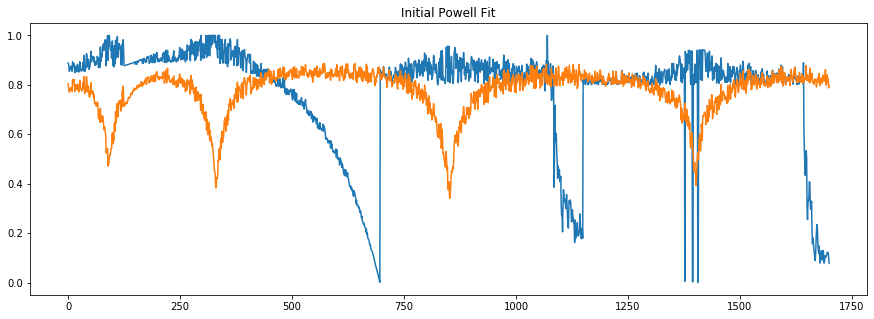

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 66
    # data points      = 1700
    # variables        = 2
    chi-square         = 112.315805
    reduced chi-square = 0.06614594
    Akaike info crit   = -4615.01719
    Bayesian info crit = -4604.14042
[[Variables]]
    teff:   10529.96 (fixed)
    logg:   9.49999990 +/- 6.1934e-05 (0.00%) (init = 8)
    trans: -0.13683158 +/- 1.28132508 (936.43%) (init = 0)

 Starting Bayesian Sampling...


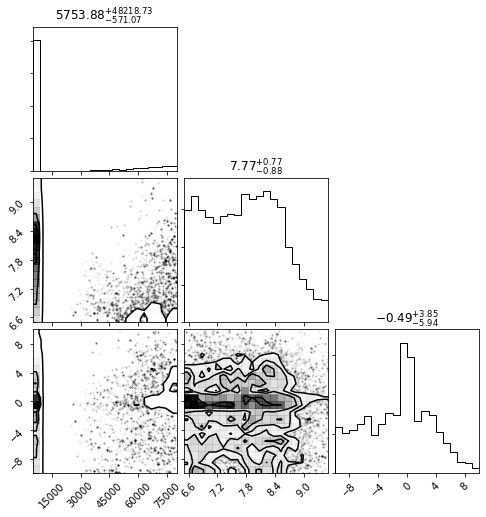

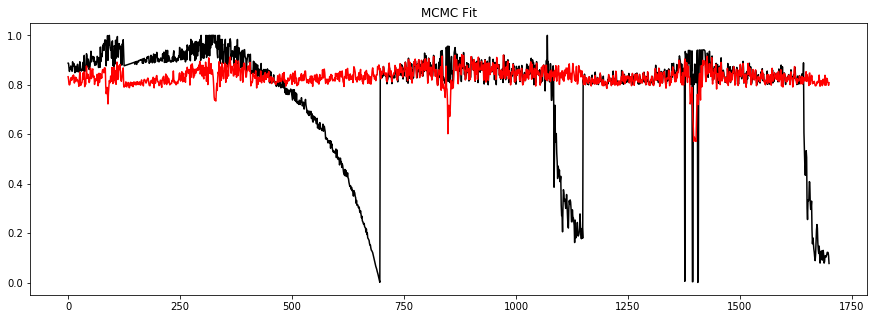

----------------------------------------------------------------------
----------------------------------------------------------------------


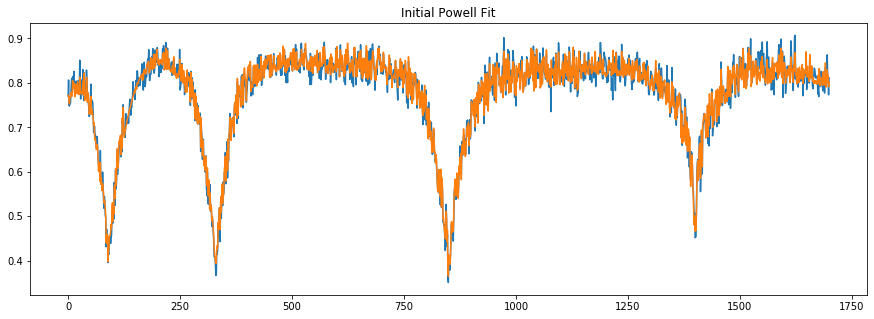

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 87
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.39503448
    reduced chi-square = 2.3265e-04
    Akaike info crit   = -14220.1818
    Bayesian info crit = -14209.3050
[[Variables]]
    teff:   17702.81 (fixed)
    logg:   8.23045542 +/- 0.01592495 (0.19%) (init = 8)
    trans: -0.04618263 +/- 0.01497755 (32.43%) (init = 0)

 Starting Bayesian Sampling...


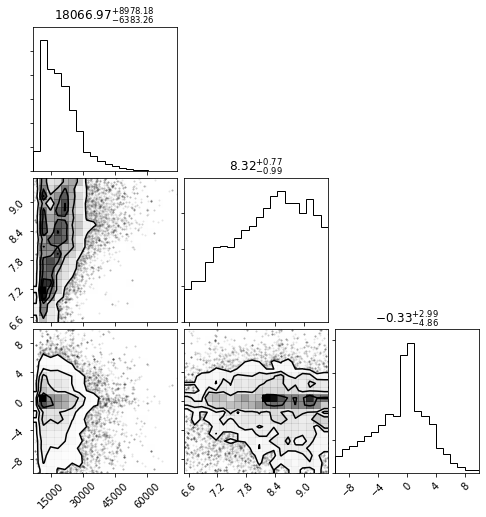

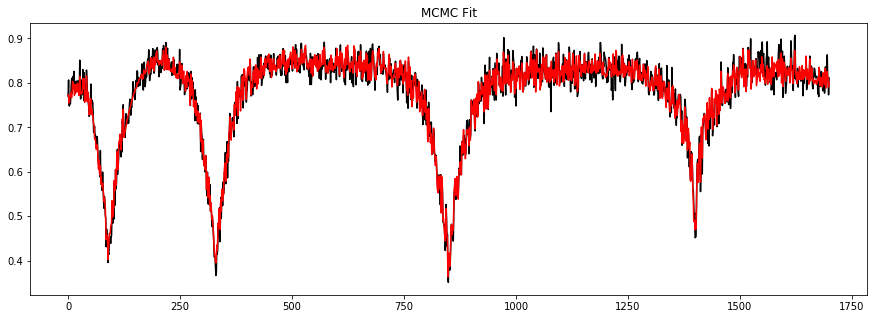

----------------------------------------------------------------------
----------------------------------------------------------------------


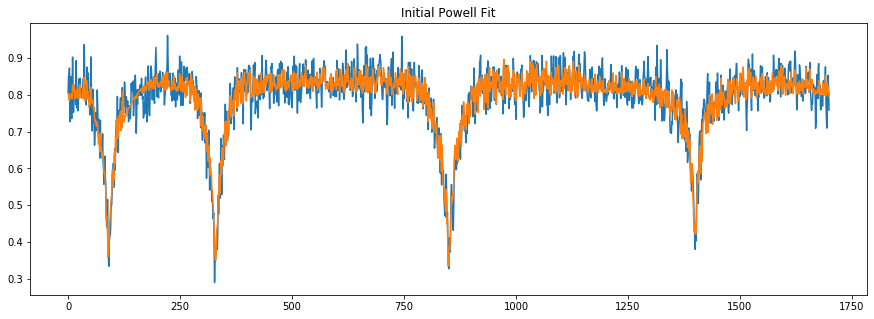

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 82
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.98633592
    reduced chi-square = 0.00116981
    Akaike info crit   = -11474.5561
    Bayesian info crit = -11463.6794
[[Variables]]
    teff:   9453.609 (fixed)
    logg:   8.00809089 +/- 0.01895432 (0.24%) (init = 8)
    trans: -0.01098166 +/- 0.03075537 (280.06%) (init = 0)

 Starting Bayesian Sampling...


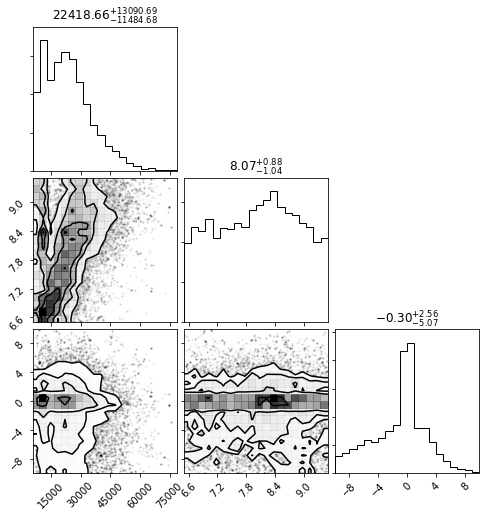

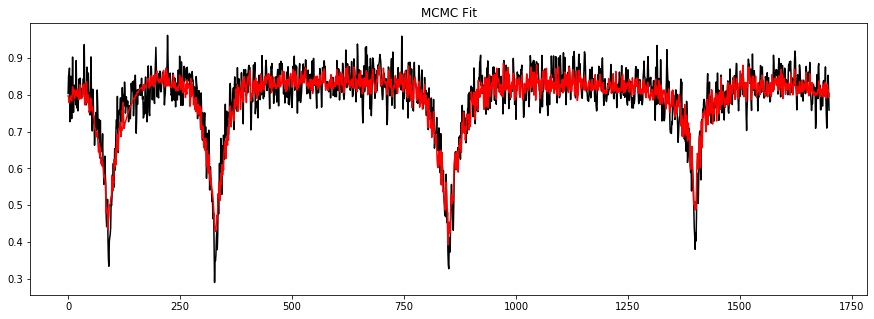

----------------------------------------------------------------------
----------------------------------------------------------------------


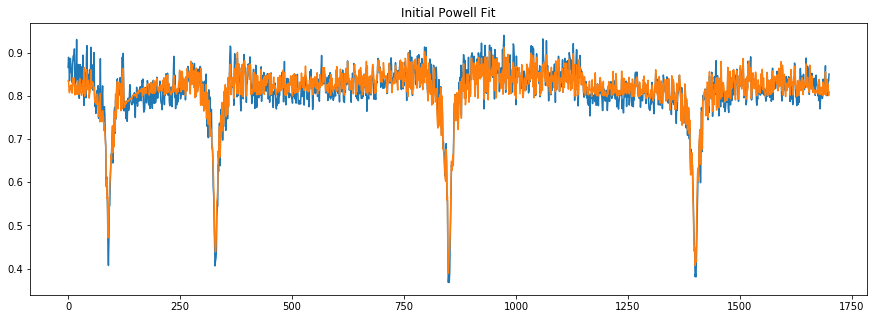

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 106
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.75395719
    reduced chi-square = 4.4403e-04
    Akaike info crit   = -13121.3655
    Bayesian info crit = -13110.4887
[[Variables]]
    teff:   8142.63 (fixed)
    logg:   8.14048066 +/- 0.02471699 (0.30%) (init = 8)
    trans: -0.02975890 +/- 0.01921916 (64.58%) (init = 0)

 Starting Bayesian Sampling...


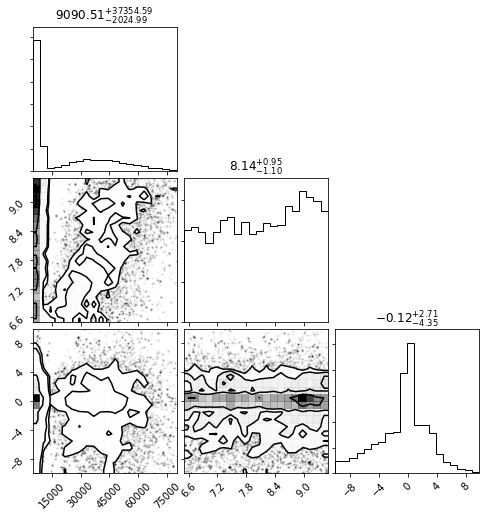

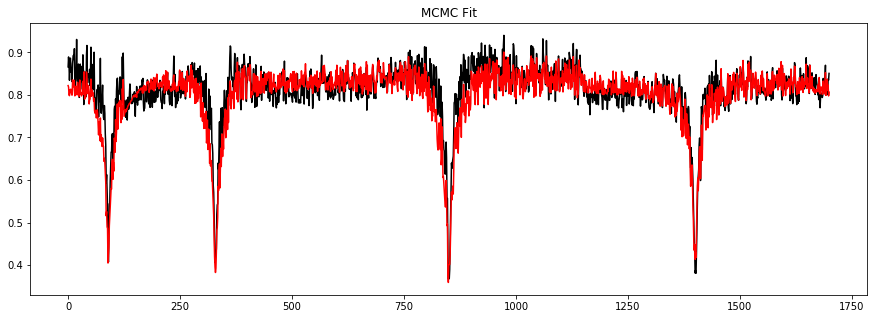

----------------------------------------------------------------------
----------------------------------------------------------------------


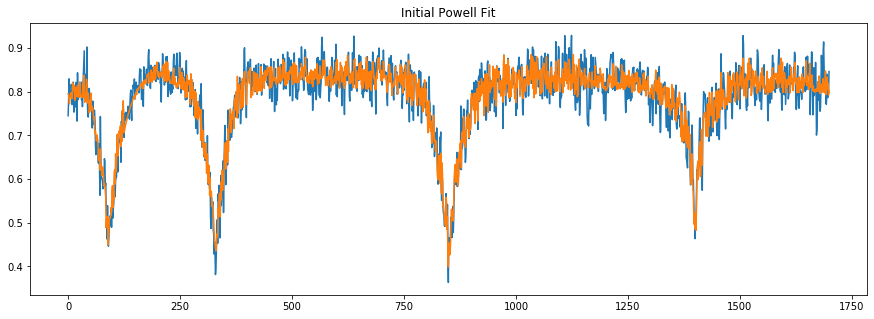

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 54
    # data points      = 1700
    # variables        = 2
    chi-square         = 1.45787781
    reduced chi-square = 8.5859e-04
    Akaike info crit   = -12000.3829
    Bayesian info crit = -11989.5061
[[Variables]]
    teff:   23545.42 (fixed)
    logg:   8.34706004 +/- 0.02574416 (0.31%) (init = 8)
    trans: -0.01905470 +/- 0.02792962 (146.58%) (init = 0)

 Starting Bayesian Sampling...


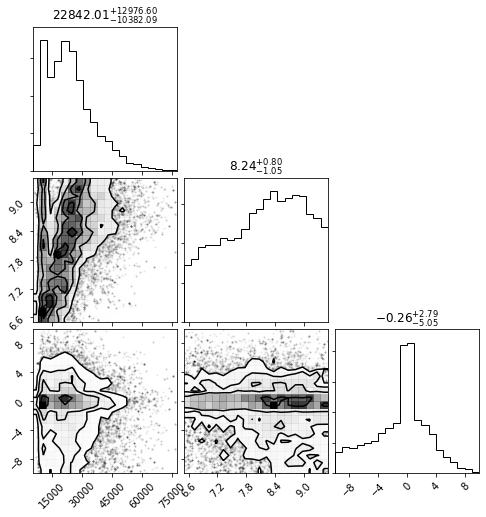

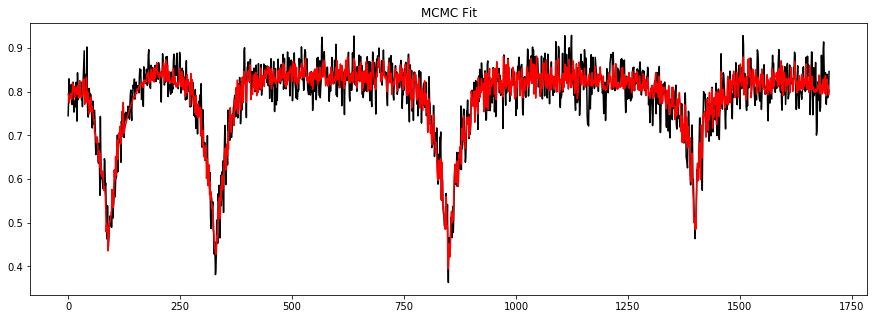

----------------------------------------------------------------------
----------------------------------------------------------------------


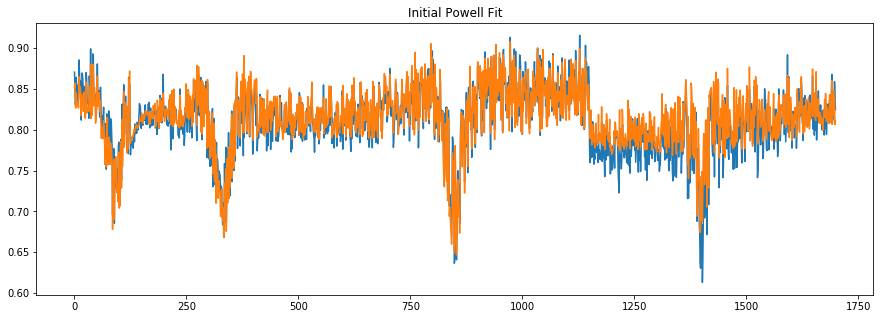

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 105
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.40490846
    reduced chi-square = 2.3846e-04
    Akaike info crit   = -14178.2123
    Bayesian info crit = -14167.3355
##  Warning: uncertainties could not be estimated:
    teff:   at initial value
[[Variables]]
    teff:   36458.31 (fixed)
    logg:   6.62867044 +/- 0.02361335 (0.36%) (init = 8)
    trans: -0.04947031 +/-        nan (nan%) (init = 0)

 Starting Bayesian Sampling...


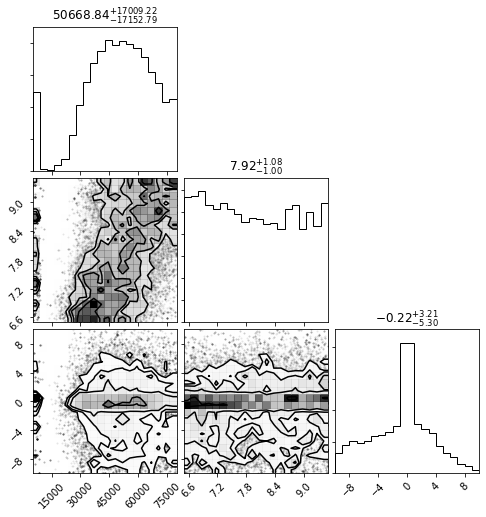

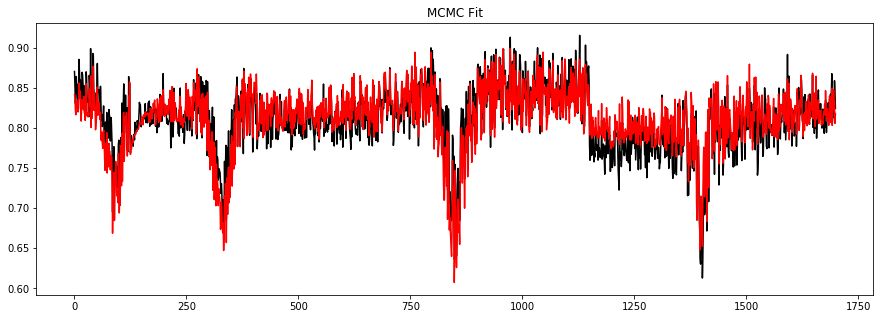

----------------------------------------------------------------------
----------------------------------------------------------------------


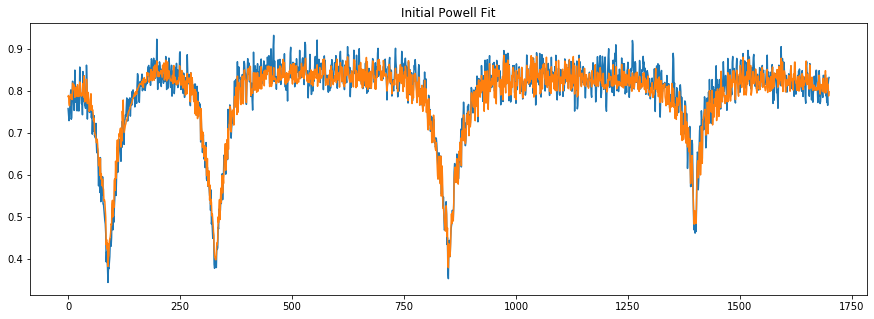

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 59
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.87866388
    reduced chi-square = 5.1747e-04
    Akaike info crit   = -12861.1518
    Bayesian info crit = -12850.2751
[[Variables]]
    teff:   12431.53 (fixed)
    logg:   6.89919067 +/- 0.00800916 (0.12%) (init = 8)
    trans: -0.06061318 +/- 0.02177447 (35.92%) (init = 0)

 Starting Bayesian Sampling...


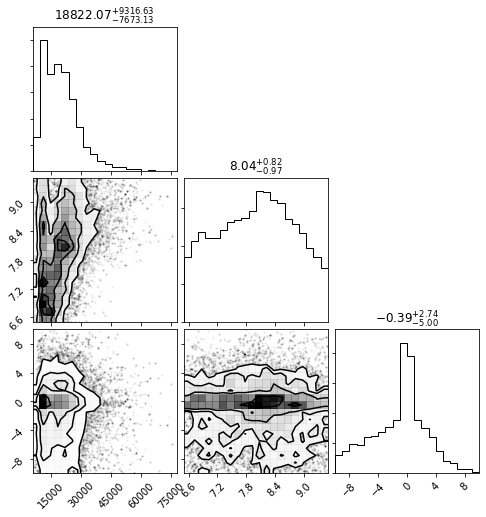

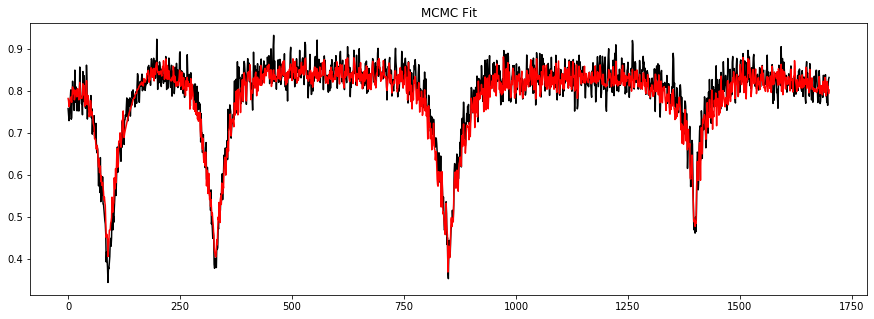

----------------------------------------------------------------------
----------------------------------------------------------------------


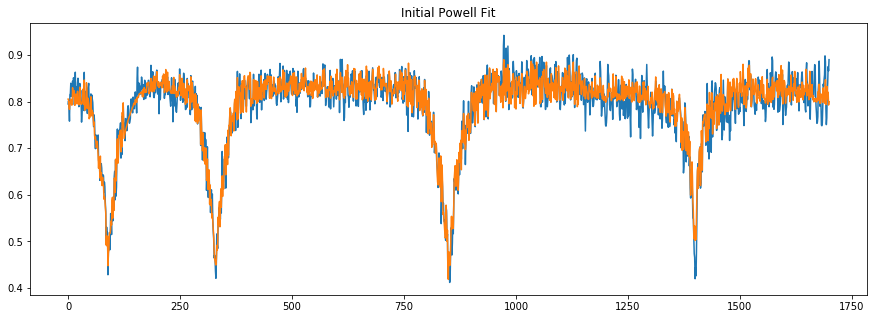

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 107
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.88917146
    reduced chi-square = 5.2366e-04
    Akaike info crit   = -12840.9428
    Bayesian info crit = -12830.0661
[[Variables]]
    teff:   21198.74 (fixed)
    logg:   7.56002429 +/- 0.02351519 (0.31%) (init = 8)
    trans: -0.08983333 +/- 0.02142342 (23.85%) (init = 0)

 Starting Bayesian Sampling...


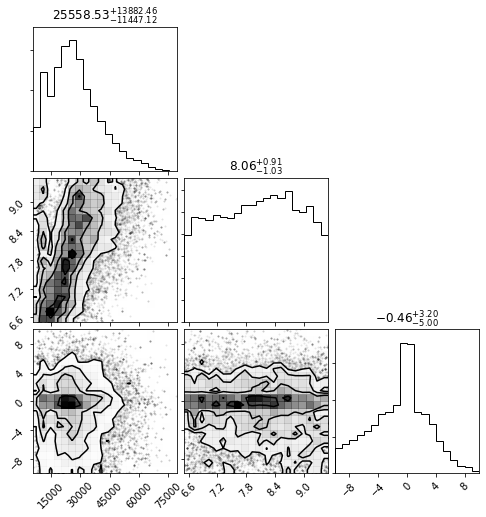

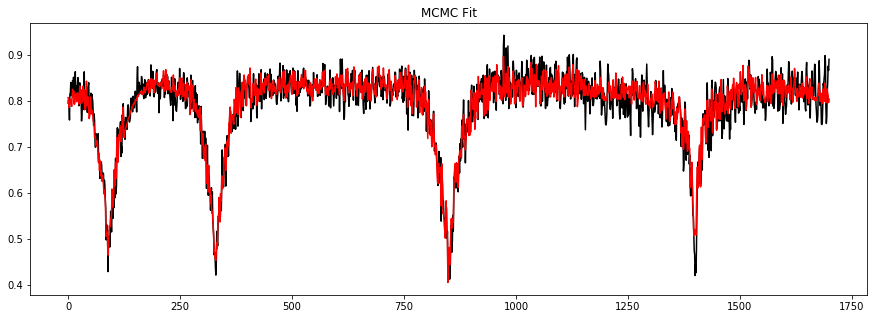

----------------------------------------------------------------------
----------------------------------------------------------------------


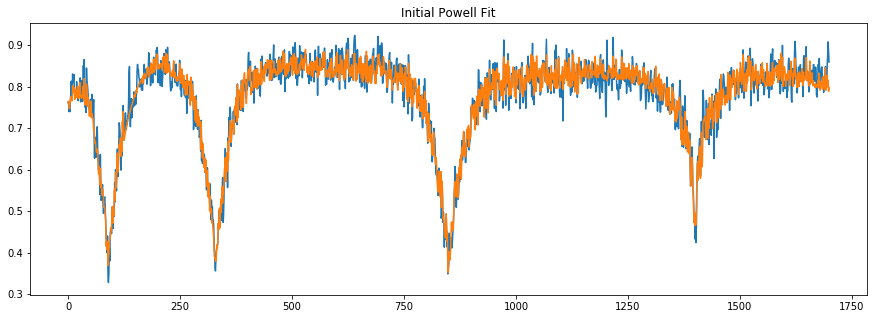

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 116
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.95852743
    reduced chi-square = 5.6450e-04
    Akaike info crit   = -12713.2591
    Bayesian info crit = -12702.3823
[[Variables]]
    teff:   13379.83 (fixed)
    logg:   7.65679719 +/- 0.02295790 (0.30%) (init = 8)
    trans: -0.03996935 +/- 0.02384911 (59.67%) (init = 0)

 Starting Bayesian Sampling...


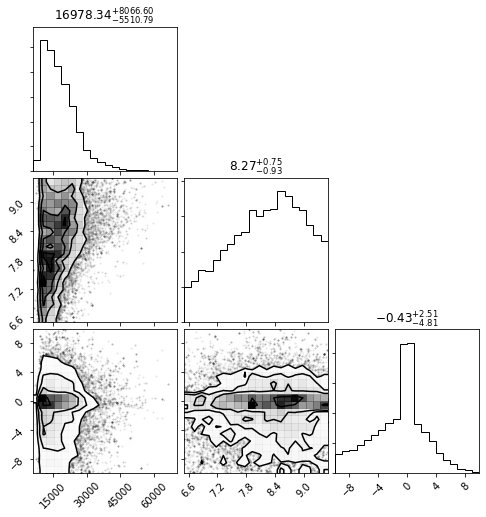

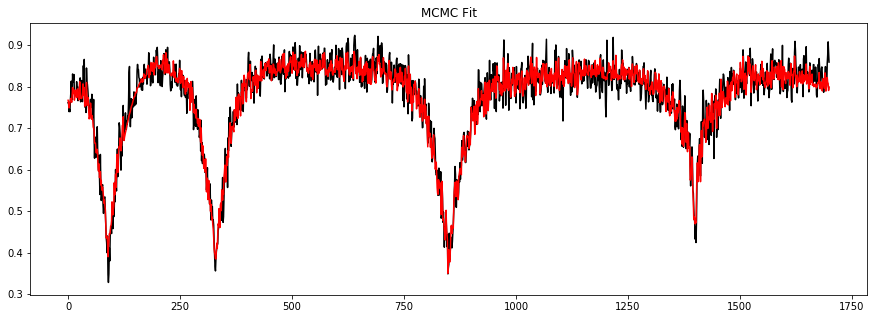

----------------------------------------------------------------------
----------------------------------------------------------------------


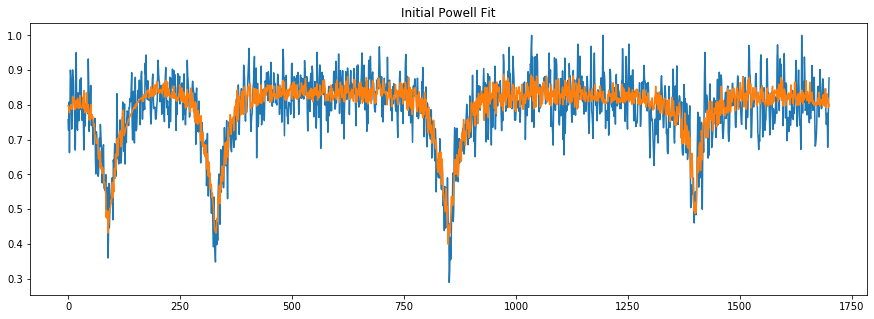

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 107
    # data points      = 1700
    # variables        = 2
    chi-square         = 5.01708130
    reduced chi-square = 0.00295470
    Akaike info crit   = -9899.40981
    Bayesian info crit = -9888.53304
[[Variables]]
    teff:   20764.49 (fixed)
    logg:   7.81320212 +/- 0.03065746 (0.39%) (init = 8)
    trans: -0.07126924 +/- 0.05089286 (71.41%) (init = 0)

 Starting Bayesian Sampling...


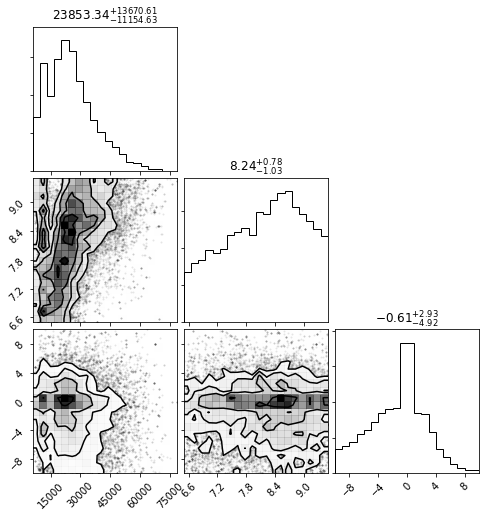

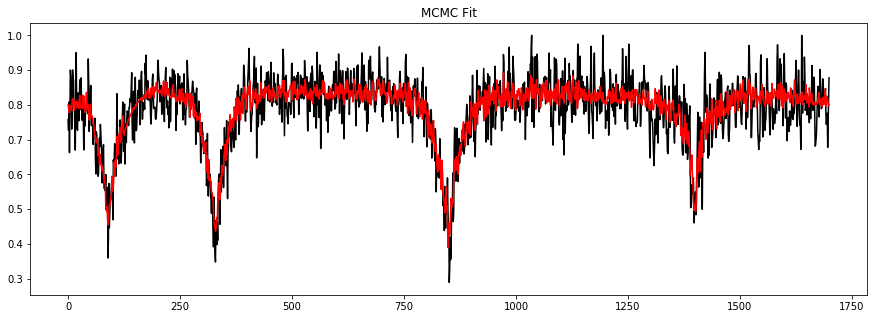

----------------------------------------------------------------------
----------------------------------------------------------------------


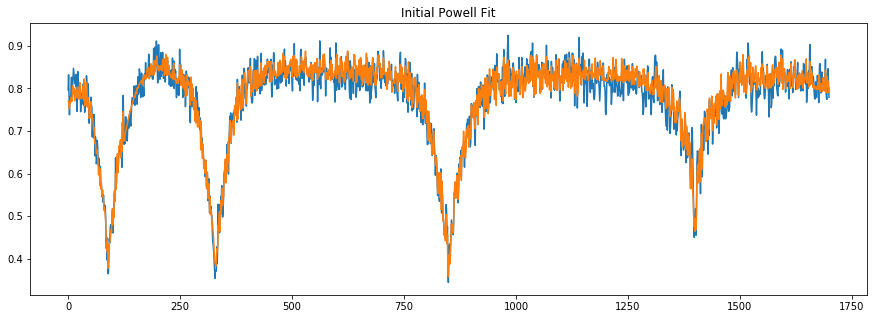

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 80
    # data points      = 1700
    # variables        = 2
    chi-square         = 0.90023744
    reduced chi-square = 5.3018e-04
    Akaike info crit   = -12819.9164
    Bayesian info crit = -12809.0397
[[Variables]]
    teff:   16485.42 (fixed)
    logg:   7.93292112 +/- 0.01239870 (0.16%) (init = 8)
    trans: -0.07810747 +/- 0.02259849 (28.93%) (init = 0)

 Starting Bayesian Sampling...
emcee: Exception while calling your likelihood function:
  params: [ 2.98726588e+04  8.61496089e+00 -1.30395996e-01]
  args: []
  kwargs: {}
  exception:


Traceback (most recent call last):
  File "/home-4/vchandr8@jhu.edu/anaconda/lib/python3.7/site-packages/emcee/ensemble.py", line 519, in __call__
    return self.f(x, *self.args, **self.kwargs)
  File "<ipython-input-194-7469184c5da3>", line 21, in lnprob
    return lp + lnlike(prms)
  File "<ipython-input-194-7469184c5da3>", line 2, in lnlike
    model = spectrum_sampler(None,prms[0],prms[1],prms[2])
  File "<ipython-input-105-b6cb800c7a90>", line 6, in spectrum_sampler
    synth = (interpolation.shift(model.predict(label)[0],trans,cval=1.)*modelscaling)
  File "/home-4/vchandr8@jhu.edu/anaconda/lib/python3.7/site-packages/keras/engine/training.py", line 1169, in predict
    steps=steps)
  File "/home-4/vchandr8@jhu.edu/anaconda/lib/python3.7/site-packages/keras/engine/training_arrays.py", line 294, in predict_loop
    batch_outs = f(ins_batch)
  File "/home-4/vchandr8@jhu.edu/anaconda/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py", line 2715, in __call__
    return

KeyboardInterrupt: 

In [196]:
fitoutput = (np.zeros((len(y_test),5)))
bayesoutput = (np.zeros((len(y_test),10)))

for i in range(len(y_test)):
    global spec
    spec = y_train[i][lines]
    #fitoutput[i,0] = int(specnames[i][:-12])
    #bayesoutput[i,0] = int(specnames[i][:-12])
    params['teff'].set(value=sc.inverse_transform(X_train)[i][0],vary=False)
    result = fitter.fit(spec,params,wl=lamgrid[lines],method="powell",nan_policy='omit',calc_covar=True,
                   fit_kws={'reduce_fcn':chisquare})

    fitoutput[i][1] = result.params['teff'].value
    fitoutput[i][2] = result.params['teff'].stderr
    fitoutput[i][3] = result.params['logg'].value
    fitoutput[i][4] = result.params['logg'].stderr

    plt.figure(figsize=(15,5))
    plt.plot(spec*modelscaling)
    plt.plot(spectrum_sampler(None,result.params['teff'],result.params['logg'],result.params['trans']))
    plt.title('Initial Powell Fit')
    plt.show()
    print(lmfit.fit_report(result))
    
    print('\n Starting Bayesian Sampling...')
    
    p0 = np.asarray(result.params)
    pos0 = np.zeros((nwalkers,ndim))
    for ii in range(ndim):
        pos0[:,ii] = ( p0[ii] + 0.02*p0[ii]*np.random.randn(nwalkers) )

    sampler = emcee.EnsembleSampler(nwalkers,ndim,lnprob,threads = 1)
    b = sampler.run_mcmc(pos0,burn)
    sampler.reset()
    s = sampler.run_mcmc(b[0],steps)
    values = np.median(sampler.flatchain,0)
    lower = np.quantile(sampler.flatchain,.3173,axis=0)
    upper = np.quantile(sampler.flatchain,.6827,axis=0)
    
    bayesoutput[i,1] = values[0]
    bayesoutput[i,2] = lower[0]
    bayesoutput[i,3] = upper[0]
    bayesoutput[i,4] = values[1]
    bayesoutput[i,5] = lower[1]
    bayesoutput[i,6] = upper[1]
    bayesoutput[i,7] = values[2]
    bayesoutput[i,8] = lower[2]
    bayesoutput[i,9] = upper[2]
    
    f = corner.corner(sampler.flatchain,show_titles = True,smooth = 0)
    
    plt.figure(figsize=(15,5))
    plt.title('MCMC Fit')
    plt.plot(spec*modelscaling,'k')
    plt.plot(spectrum_sampler(None,values[0],values[1],values[2]),'r')
    plt.show()
    print('-'*70)
    print('-'*70)

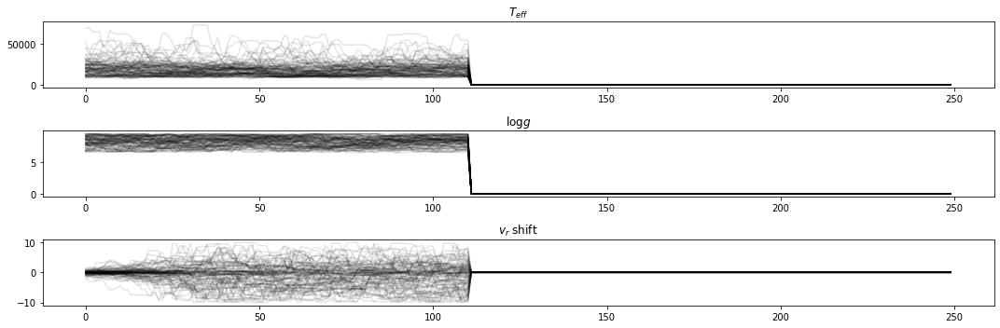

In [197]:
plt.figure(figsize=(15,5))
plt.subplot(311)
plt.plot(sampler.chain[:,:,0].T,alpha=.1,color='k');
plt.title('$T_{eff}$')
plt.subplot(312)
plt.plot(sampler.chain[:,:,1].T,alpha=.1,color='k');
plt.title('$\log{g}$')
plt.subplot(313)
plt.plot(sampler.chain[:,:,2].T,alpha=.1,color='k');
plt.title('$v_r$ shift')
plt.tight_layout()

In [198]:
sampler.acceptance_fraction

array([0.52678571, 0.63392857, 0.58928571, 0.58035714, 0.6875    ,
       0.58928571, 0.59821429, 0.51785714, 0.63392857, 0.66964286,
       0.61607143, 0.5625    , 0.73214286, 0.57142857, 0.64285714,
       0.58035714, 0.65178571, 0.66964286, 0.55357143, 0.63392857,
       0.59821429, 0.59821429, 0.55357143, 0.58035714, 0.66071429,
       0.59821429, 0.60714286, 0.55357143, 0.72321429, 0.50892857,
       0.46428571, 0.58035714, 0.53571429, 0.61607143, 0.60714286,
       0.57142857, 0.60714286, 0.65178571, 0.58035714, 0.66071429,
       0.51785714, 0.5625    , 0.39285714, 0.50892857, 0.49107143,
       0.58928571, 0.54464286, 0.66964286, 0.52678571, 0.5625    ,
       0.54464286, 0.57142857, 0.50892857, 0.55357143, 0.58928571,
       0.625     , 0.51785714, 0.52678571, 0.57142857, 0.54464286,
       0.51785714, 0.53571429, 0.64285714, 0.66964286, 0.46428571,
       0.69642857, 0.59821429, 0.58928571, 0.58928571, 0.63392857,
       0.65178571, 0.5625    , 0.46428571, 0.52678571, 0.57142

In [199]:
np.max(np.exp(sampler.lnprobability))

1.0

Text(0.7, 0.1, 'rms: 11891 K')

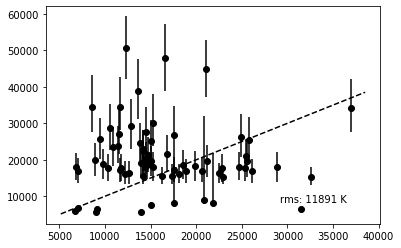

In [200]:
truths = sc.inverse_transform(X_test)
fitmask = bayesoutput[:,2] != 0

f = plt.subplot(111)

ax = plt.errorbar(truths[:,0][fitmask],bayesoutput[fitmask][:,1],\
    yerr = [bayesoutput[fitmask][:,1]-bayesoutput[:,2][fitmask],\
            bayesoutput[:,3][fitmask]-bayesoutput[fitmask][:,1]],color='k',marker='o',linestyle='None')
x = np.linspace(f.axes.get_xlim()[0],f.axes.get_xlim()[1],1000)
y = x
plt.plot(x,y,'k--')
rms = np.sqrt(np.sum((truths[:,0][fitmask]-bayesoutput[fitmask][:,1])**2)/len(bayesoutput[fitmask]))
plt.text(0.7,0.1,'rms: %i K'%rms,transform = f.transAxes)

Text(0.7, 0.1, 'rms: 0.45 dex')

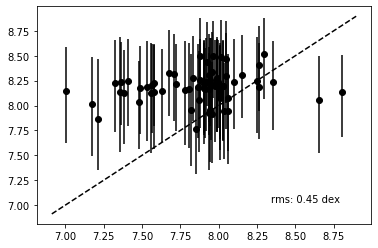

In [201]:
f = plt.subplot(111)

plt.errorbar(truths[:,1][fitmask],bayesoutput[fitmask][:,4],\
    yerr = [bayesoutput[fitmask][:,4]-bayesoutput[:,5][fitmask],\
            bayesoutput[:,6][fitmask]-bayesoutput[fitmask][:,4]],color='k',marker='o',linestyle='None')
x = np.linspace(f.axes.get_xlim()[0],f.axes.get_xlim()[1],1000)
y = x
plt.plot(x,y,'k--')
rms = np.sqrt(np.sum((truths[:,1][fitmask]-bayesoutput[fitmask][:,4])**2)/len(bayesoutput[fitmask]))
plt.text(0.7,0.1,'rms: %.2f dex'%rms,transform = f.transAxes)